In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import spearmanr

# ***Merging***


## ***Tweets***


In [ ]:
df_clean_mkd = pd.read_csv("/content/drive/MyDrive/PraksaMANU/Tweets sept2023-april2024/Air pollution/Macedonia/Tweets_translated_sept2023_april2024.csv")
df_translated_mkd_2 = pd.read_csv("/content/drive/MyDrive/PraksaMANU/Tweets may2024-/Air pollution/Macedonia/Tweets_translated_nov2024_sept2025.csv")

df_macedonia = pd.concat([df_clean_mkd, df_translated_mkd_2], ignore_index=True)

df_macedonia.drop_duplicates(inplace=True)

output_path = "/content/drive/MyDrive/PraksaMANU/Tweets Macedonia Merged/Tweets_Macedonia_sept2023_sept2025.csv"
df_macedonia.to_csv(output_path, index=False)

print(f"✅ Done: {output_path}")
print(f"Total rows: {len(df_macedonia)}")

✅ Done: /content/drive/MyDrive/PraksaMANU/Tweets Macedonia Merged/Tweets_Macedonia_sept2023_sept2025.csv
Total rows: 6152


In [ ]:
df_clean_srb = pd.read_csv("/content/drive/MyDrive/PraksaMANU/Tweets sept2023-april2024/Air pollution/Balkan/Tweets_translated_SRB_sept2023_april2024.csv")
df_translated_srb_2 = pd.read_csv("/content/drive/MyDrive/PraksaMANU/Tweets may2024-/Air pollution/Balkan/Tweets_translated_SRB_may2024_sept2025.csv")

df_srb = pd.concat([df_clean_srb, df_translated_srb_2], ignore_index=True)

df_srb.drop_duplicates(inplace=True)

output_path = "/content/drive/MyDrive/PraksaMANU/Tweets Balkan Merged/Tweets_Balkan_sept2023_sept2025.csv"
df_srb.to_csv(output_path, index=False)

print(f"✅ Done: {output_path}")
print(f"Total rows: {len(df_srb)}")

## ***PM10***


In [ ]:
import pandas as pd

# pateki
files = [
    "/content/drive/MyDrive/PraksaMANU/PM10/Final PM10 for Macedonia/Datasets/PM10_Macedonia_2021_2022.csv",
    "/content/drive/MyDrive/PraksaMANU/PM10/Final PM10 for Macedonia/Datasets/PM10_Macedonia_2022_2023.csv",
    "/content/drive/MyDrive/PraksaMANU/PM10/Final PM10 for Macedonia/Datasets/PM10_Macedonia_2023_2024.csv",
    "/content/drive/MyDrive/PraksaMANU/PM10/Final PM10 for Macedonia/Datasets/PM10_Macedonia_2024_2025.csv",
    "/content/drive/MyDrive/PraksaMANU/PM10/Final PM10 for Macedonia/Datasets/PM10_Macedonia_mart2025_sept2025.csv",
    "/content/drive/MyDrive/PraksaMANU/PM10/Final PM10 for Macedonia/Datasets/PM10_Macedonia_mart2024_sept2024.csv"
]

# citanje i spojuvanje na datasetite
df_list = [pd.read_csv(f) for f in files]
df_macedonia_pm10 = pd.concat(df_list, ignore_index=True)

# trgni duplikati
df_macedonia_pm10.drop_duplicates(inplace=True)

output_path = "/content/drive/MyDrive/PraksaMANU/PM10/Final PM10 for Macedonia/PM10_Macedonia_2021_2025.csv"
df_macedonia_pm10.to_csv(output_path, index=False)

print(f"✅ Done: {output_path}")
print(f"Total rows: {len(df_macedonia_pm10)}")


✅ Done: /content/drive/MyDrive/PraksaMANU/PM10/Final PM10 for Macedonia/PM10_Macedonia_2021_2025.csv
Total rows: 22750


In [ ]:
import pandas as pd

files = [
    "/content/drive/MyDrive/PraksaMANU/PM10/Final PM10 for Balkan/PM10_Belgrade_2023_2025.csv",
    "/content/drive/MyDrive/PraksaMANU/PM10/Final PM10 for Balkan/PM10_Croatia_2023_2025.csv",
    "/content/drive/MyDrive/PraksaMANU/PM10/Final PM10 for Balkan/PM10_Montenegro_2023_2025.csv",
    "/content/drive/MyDrive/PraksaMANU/PM10/Final PM10 for Balkan/Datasets/PM10_Bosnia_may2024_sept2025.csv",
]

df_list = []

for f in files:
    df = pd.read_csv(f)

    # Усогласување на колони: тргни празни места и направи lowercase
    df.columns = df.columns.str.strip().str.lower()

    # Осигурај datetime колоната како datetime тип
    if 'datetime' in df.columns:
        df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')
        df['datetime'] = df['datetime'].dt.tz_localize(None)

    # Отстрани source_file ако постои
    if 'source_file' in df.columns:
        df = df.drop(columns=['source_file'])

    df_list.append(df)

# Спојување на сите датасети
df_balkan_pm10 = pd.concat(df_list, ignore_index=True, sort=False)

# Отстрани дупликати според datetime, но зачувај сите колони
df_balkan_pm10 = df_balkan_pm10.groupby('datetime', as_index=False).first()

# Претвори ги колони со прва голема буква
df_balkan_pm10.columns = [col.capitalize() for col in df_balkan_pm10.columns]

# Сортирање според datetime
df_balkan_pm10 = df_balkan_pm10.sort_values('Datetime').reset_index(drop=True)

# Снимање на финалниот датасет
output_path = "/content/drive/MyDrive/PraksaMANU/PM10/Final PM10 for Balkan/PM10_Balkan_2023_2025_clean.csv"
df_balkan_pm10.to_csv(output_path, index=False)

print(f"✅ Done: {output_path}")
print(f"Total rows: {len(df_balkan_pm10)}")

# ***Macedonia***


In [ ]:
df_macedonia = pd.read_csv("/content/drive/MyDrive/PraksaMANU/Tweets Macedonia Merged/Tweets_Macedonia_sept2023_sept2025.csv")
df_macedonia

,text_en,created_at,id
0,"Come on, there's a little more unnecessary con...",2023-09-13 19:05:20,NaN
1,I'm not satisfied with this: environmental pol...,2023-09-12 21:10:05,NaN
2,We'll breathe like that.,2023-09-12 08:01:52,NaN
3,I don't know what's in those sick minds. I jus...,2023-09-11 22:04:20,NaN
4,I'm not satisfied with this: environmental pol...,2023-09-11 16:33:49,NaN
...,...,...,...
6082,November pollution in Tetovo: PM10 and PM25 pa...,2025-11-20 13:21:18,1.990000e+18
6083,Abe and Norway from Finland imports the garbag...,2025-11-20 11:23:58,1.990000e+18
6084,So it's all our priority if we breathe fresh a...,2025-11-20 09:54:18,1.990000e+18
6085,So maybe he'll raise his awareness of this peo...,2025-11-20 09:37:26,1.990000e+18


In [ ]:
df_macedonia_pm10 = pd.read_csv("/content/drive/MyDrive/PraksaMANU/PM10/Final PM10 for Macedonia/PM10_Macedonia_2021_2025.csv")
df_macedonia_pm10

,Time,Kicevo,Lazaropole,Tetovo,Gostivar,Prilep,Veles,Kocani,Kavadarci,Kumanovo,Strumica,Gevgelija,Berovo,Skopje,Bitola,Ohrid
0,2021-10-31 00:00:00,139.3320,17.56,130.2300,92.0391,NaN,72.171,55.429,85.5730,146.0700,143.4,39.15,NaN,158.150,40.20,NaN
1,2021-11-01 01:00:00,127.7590,16.98,149.5000,83.3030,NaN,56.751,78.752,61.3250,105.0800,93.0,49.78,NaN,160.338,46.02,NaN
2,2021-11-01 02:00:00,137.4740,21.58,113.0500,63.6610,NaN,35.431,61.986,38.1330,93.3101,98.8,27.69,NaN,117.034,53.34,NaN
3,2021-11-01 03:00:00,91.6880,15.08,95.1801,52.4100,NaN,31.323,60.750,39.3880,83.0400,100.9,30.68,NaN,92.868,51.00,NaN
4,2021-11-01 04:00:00,85.2030,14.07,85.1500,38.4360,NaN,20.337,42.841,31.7700,80.6600,62.9,29.13,NaN,81.043,43.10,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22745,2024-10-31 19:00:00,77.2891,9.68,22.0200,111.2920,NaN,45.473,NaN,70.0780,NaN,108.6,NaN,NaN,61.300,30.91,41.633
22746,2024-10-31 20:00:00,84.2250,9.30,34.2600,82.0610,NaN,23.626,NaN,104.7300,NaN,170.1,NaN,NaN,65.103,31.05,38.812
22747,2024-10-31 21:00:00,121.5240,9.24,59.3900,56.3020,NaN,34.267,NaN,79.7570,NaN,108.2,NaN,NaN,84.666,36.30,40.537
22748,2024-10-31 22:00:00,92.9310,9.44,58.2100,44.3780,NaN,65.994,NaN,100.3370,NaN,87.6,NaN,NaN,109.649,24.93,34.299


In [ ]:
# import pandas as pd

# df_macedonia['created_at'] = df_macedonia['created_at'].astype(str)

# df_macedonia['created_at'] = df_macedonia['created_at'].str.replace(r'\+00:00$', '', regex=True)

# df_macedonia['created_at'] = pd.to_datetime(df_macedonia['created_at'], format="%Y-%m-%d %H:%M:%S", errors='coerce')

# print(df_macedonia['created_at'].head())

In [ ]:
df_macedonia['created_at'] = pd.to_datetime(df_macedonia['created_at'])
df_mkd_per_day = df_macedonia.groupby(df_macedonia['created_at'].dt.date).size().reset_index(name='tweet_count')
df_mkd_per_day

,created_at,tweet_count
0,2023-09-08,3
1,2023-09-09,1
2,2023-09-10,1
3,2023-09-11,2
4,2023-09-12,2
...,...,...
698,2025-11-22,4
699,2025-11-23,2
700,2025-11-24,12
701,2025-11-25,32


In [ ]:
df_macedonia_pm10['Time'] = pd.to_datetime(df_macedonia_pm10['Time'])
df_pm10_per_day_macedonia = df_macedonia_pm10.groupby(df_macedonia_pm10['Time'].dt.date).mean()

In [ ]:
numeric_cols = df_pm10_per_day_macedonia.select_dtypes(include='number').columns
df_pm10_per_day_macedonia['Mean Value'] = df_pm10_per_day_macedonia[numeric_cols].mean(axis=1)

In [ ]:
df_pm10_per_day_macedonia[numeric_cols].max()

,0
Kicevo,217.646000
Lazaropole,95.930467
Tetovo,179.465833
Gostivar,198.599583
Prilep,178.072087
Veles,163.175758
Kocani,183.841375
Kavadarci,183.527179
Kumanovo,166.399167
Strumica,424.675000


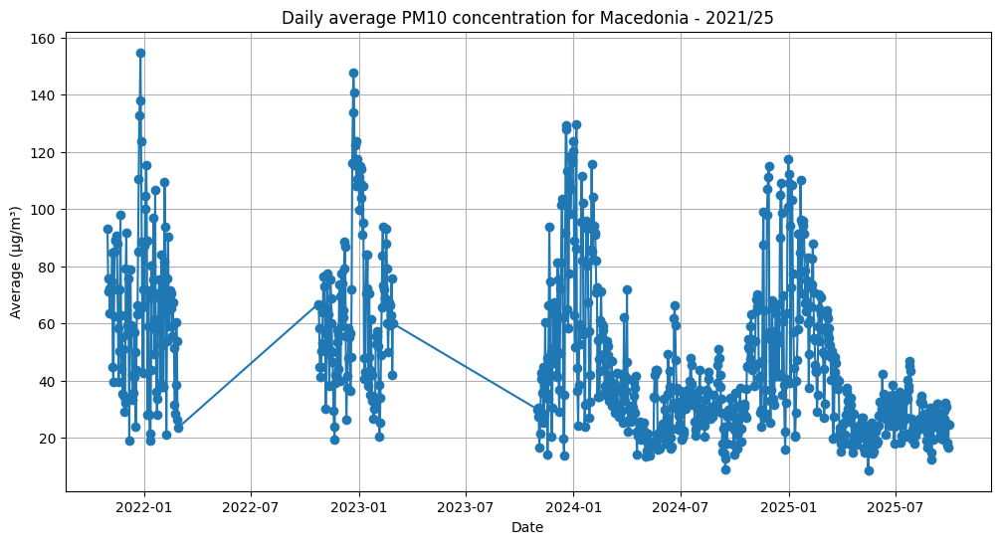

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,6))
plt.plot(df_pm10_per_day_macedonia.index, df_pm10_per_day_macedonia['Mean Value'], marker='o')
plt.title("Daily average PM10 concentration for Macedonia - 2021/25")
plt.xlabel("Date")
plt.ylabel("Average (µg/m³)")
plt.grid(True)
plt.show()

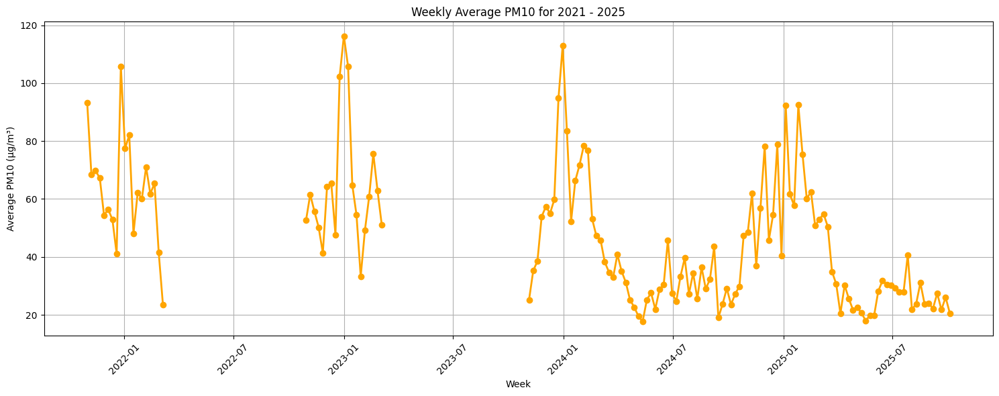

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

df_macedonia_pm10['Time'] = pd.to_datetime(df_macedonia_pm10['Time'], errors='coerce')
df_mne = df_macedonia_pm10.dropna(subset=['Time'])

df_copy = df_mne.copy()

weekly_mean = df_copy.groupby(pd.Grouper(key='Time', freq='W')).mean().mean(axis=1)

plt.figure(figsize=(15,6))
plt.plot(weekly_mean.index, weekly_mean.values, color='orange', linewidth=2, marker='o')
plt.xlabel("Week")
plt.ylabel("Average PM10 (µg/m³)")
plt.title("Weekly Average PM10 for 2021 - 2025")
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

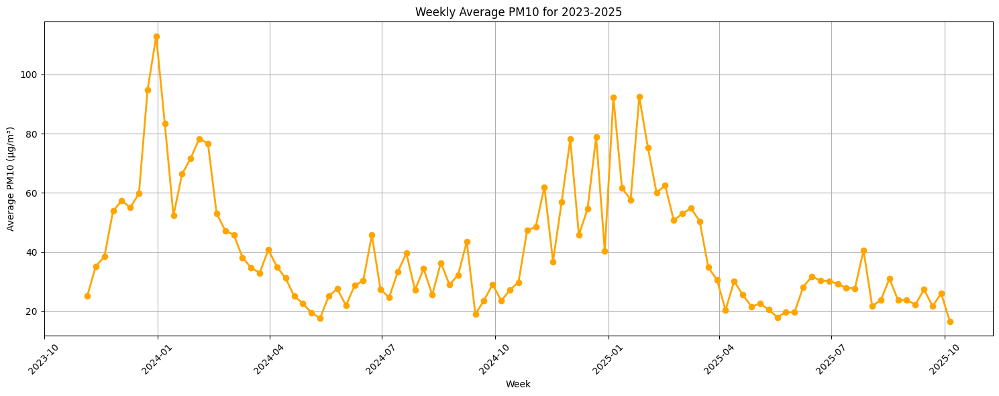

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

df_macedonia_pm10['Time'] = pd.to_datetime(df_macedonia_pm10['Time'], errors='coerce', )
df_mne = df_macedonia_pm10.dropna(subset=['Time'])

# filter
start_date = pd.to_datetime("2023-09-01")
end_date = pd.to_datetime("2025-09-30")

df_filtered = df_mne[
    (df_mne['Time'] >= start_date) &
    (df_mne['Time'] <= end_date)
]

df_copy = df_filtered.copy()

weekly_mean = (
    df_copy
    .groupby(pd.Grouper(key='Time', freq='W'))
    .mean()
    .mean(axis=1)
)

# plot
plt.figure(figsize=(15,6))
plt.plot(weekly_mean.index, weekly_mean.values, linewidth=2, marker='o', color='orange')
plt.xlabel("Week")
plt.ylabel("Average PM10 (µg/m³)")
plt.title("Weekly Average PM10 for 2023-2025")
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
df_macedonia_pm10["year"] = pd.to_datetime(df_macedonia_pm10["Time"]).dt.year

results = []

for city in numeric_cols:
    idx = df_macedonia_pm10[city].idxmax()
    results.append({
        "City": city,
        "Max_PM10": df_macedonia_pm10.loc[idx, city],
        "Year": df_macedonia_pm10.loc[idx, "year"]
    })

df_top = pd.DataFrame(results)

In [ ]:
top10 = df_top.sort_values("Max_PM10", ascending=False).head(10)
print("\033[1mTop 10 highest PM10 values through years:\033[0m")
top10 = top10.reset_index(drop=True)
print(top10)

Top 10 highest PM10 values through years:
        City  Max_PM10  Year
0   Strumica   692.100  2023
1  Kavadarci   636.416  2025
2     Kicevo   590.125  2025
3     Skopje   525.390  2022
4     Bitola   499.860  2023
5      Veles   497.244  2022
6   Gostivar   482.686  2025
7     Kocani   436.756  2021
8      Ohrid   424.149  2023
9   Kumanovo   379.320  2024


In [ ]:
# Convert dataset into long format (if each city is a column)
df_long = df_macedonia_pm10.melt(id_vars='Time', var_name='City', value_name='PM10')

# Define categories
bins = [0, 20, 40, 50, 100, 150, 1200]
labels = ['Excellent', 'Good', 'Moderate', 'Polluted', 'Very Polluted', 'Extremely Polluted']

/tmp/ipython-input-474367527.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_long, x='Category', order=labels, palette='coolwarm')


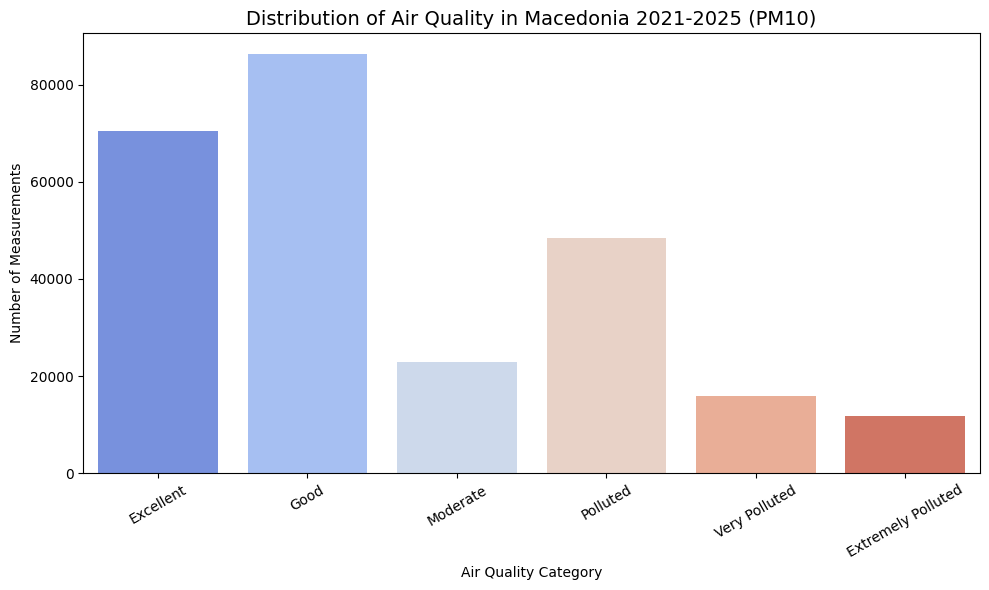

In [ ]:
import seaborn as sns

df_long['Category'] = pd.cut(df_long['PM10'], bins=bins, labels=labels, right=False)
plt.figure(figsize=(10, 6))
sns.countplot(data=df_long, x='Category', order=labels, palette='coolwarm')
plt.title("Distribution of Air Quality in Macedonia 2021-2025 (PM10)", fontsize=14)
plt.xlabel("Air Quality Category")
plt.ylabel("Number of Measurements")
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

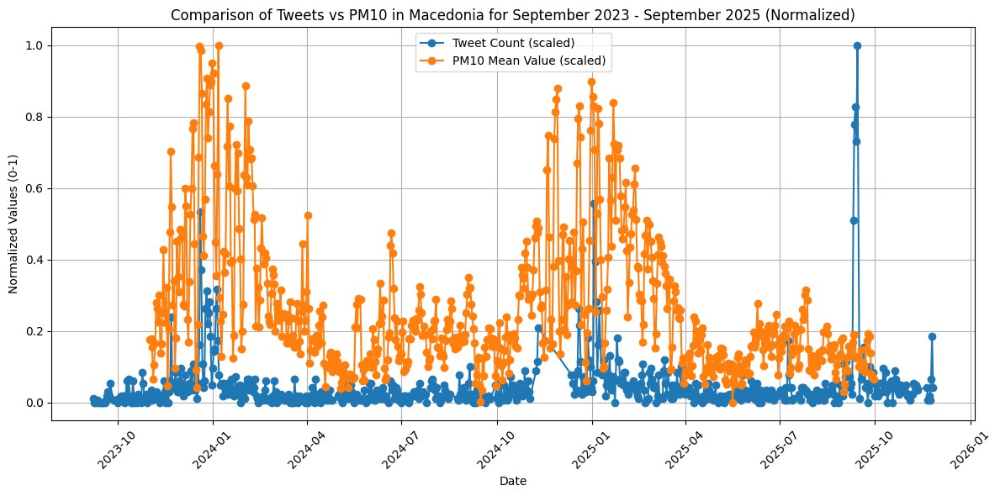

In [ ]:
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
import numpy as np
import pandas as pd

scaler = MinMaxScaler()

df_pm10_per_day_macedonia['Time'] = pd.to_datetime(df_pm10_per_day_macedonia['Time'], errors='coerce')

start_date = '2023-09-01'
end_date = '2025-09-30'
df_pm10_filtered = df_pm10_per_day_macedonia[(df_pm10_per_day_macedonia['Time'] >= start_date) &
                                             (df_pm10_per_day_macedonia['Time'] <= end_date)]

tweets_scaled = scaler.fit_transform(df_mkd_per_day['tweet_count'].values.reshape(-1,1))
pm10_scaled = scaler.fit_transform(df_pm10_filtered['Mean Value'].values.reshape(-1,1))

plt.figure(figsize=(12,6))
plt.plot(df_mkd_per_day['created_at'], tweets_scaled, label='Tweet Count (scaled)', marker='o')
plt.plot(df_pm10_filtered['Time'], pm10_scaled, label='PM10 Mean Value (scaled)', marker='o')
plt.title('Comparison of Tweets vs PM10 in Macedonia for September 2023 - September 2025 (Normalized)')
plt.xlabel('Date')
plt.ylabel('Normalized Values (0-1)')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


# ***Balkan***

In [ ]:
df_balkan = pd.read_csv("/content/drive/MyDrive/PraksaMANU/Tweets Balkan Merged/Tweets_Balkan_sept2023_sept2025.csv")
df_balkan

,text_en,created_at,id
0,Sabac is a disaster related to pollution and e...,2023-09-26 12:30:12,NaN
1,Climate talks are organised within the week of...,2023-09-26 08:02:09,NaN
2,It looks like it's been down a lot over the pa...,2023-09-26 00:54:26,NaN
3,Smells or hugs?,2023-09-25 23:16:21,NaN
4,"The question is, as long as it's not going to ...",2023-09-25 16:06:11,NaN
...,...,...,...
3172,Two tanks full of oil disappeared during the n...,2025-09-28 12:37:18,1.972279e+18
3173,We're here to reduce this pollution of the max...,2025-09-27 16:50:07,1.971981e+18
3174,We're here to reduce this pollution from the m...,2025-09-27 15:36:10,1.971962e+18
3175,And the tax on gambling because maybe when you...,2025-09-25 17:46:38,1.971270e+18


In [ ]:
df_balkan_pm10 = pd.read_csv("/content/drive/MyDrive/PraksaMANU/PM10/Final PM10 for Balkan/PM10_Balkan_2023_2025_clean.csv")
df_balkan_pm10

,Datetime,Belgrade,Desnic,Plitvicka jezera,Bakar - luka,Dubrovnik,Zagreb,Osjek,Koprivnica,Rijeka,...,Desinic,Podgorica,Pljevlja,Niksic,Bijelo_polje,Bar,Bihac,Sarajevo,Tesanj,Zenica
0,2023-09-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,8.8,13.4,8.7,18.2,NaN,NaN,NaN,NaN
1,2023-09-01 01:00:00,16.127167,6.3,3.9,6.0,NaN,14.0,13.0,12.0,4.0,...,NaN,NaN,9.8,15.2,6.4,18.5,NaN,NaN,NaN,NaN
2,2023-09-01 02:00:00,16.926500,7.0,4.2,6.0,NaN,14.0,11.0,13.0,4.0,...,NaN,NaN,8.2,10.0,5.7,16.6,NaN,NaN,NaN,NaN
3,2023-09-01 03:00:00,16.488000,7.2,3.0,5.0,NaN,15.0,12.0,13.0,4.0,...,NaN,NaN,7.9,9.8,5.1,15.4,NaN,NaN,NaN,NaN
4,2023-09-01 04:00:00,17.656333,7.4,3.3,2.0,NaN,28.0,14.0,14.0,4.0,...,NaN,NaN,9.1,9.8,NaN,17.4,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18248,2025-09-30 19:00:00,NaN,NaN,23.2,3.0,5.0,23.0,33.0,19.0,2.0,...,10.4,11.3,12.2,5.2,11.5,17.9,NaN,NaN,NaN,NaN
18249,2025-09-30 20:00:00,NaN,NaN,22.4,NaN,8.7,21.0,20.0,22.0,3.0,...,13.5,15.2,15.5,5.7,14.3,15.2,NaN,NaN,NaN,NaN
18250,2025-09-30 21:00:00,NaN,NaN,28.2,5.0,9.0,19.0,25.0,28.0,4.0,...,14.4,12.8,21.8,6.6,13.9,10.7,NaN,NaN,NaN,NaN
18251,2025-09-30 22:00:00,NaN,NaN,28.9,5.0,6.9,29.0,17.0,26.0,4.0,...,14.3,8.9,30.2,7.1,14.0,10.5,NaN,NaN,NaN,NaN


In [ ]:
df_balkan['created_at'] = pd.to_datetime(df_balkan['created_at'])
df_blk_per_day = df_balkan.groupby(df_balkan['created_at'].dt.date).size().reset_index(name='tweet_count')
df_blk_per_day

,created_at,tweet_count
0,2023-09-20,5
1,2023-09-21,3
2,2023-09-22,6
3,2023-09-23,3
4,2023-09-24,1
...,...,...
632,2025-09-23,1
633,2025-09-25,2
634,2025-09-27,2
635,2025-09-28,1


In [ ]:
df_balkan_pm10['Datetime'] = pd.to_datetime(df_balkan_pm10['Datetime'])
df_pm10_per_day_balkan = df_balkan_pm10.groupby(df_balkan_pm10['Datetime'].dt.date).mean()

In [ ]:
numeric_cols = df_pm10_per_day_balkan.select_dtypes(include='number').columns
df_pm10_per_day_balkan['Mean Value'] = df_pm10_per_day_balkan[numeric_cols].mean(axis=1)

In [ ]:
df_pm10_per_day_balkan.max()

,0
Datetime,2025-09-30 11:30:00
Belgrade,126.908202
Desnic,101.318182
Plitvicka jezera,67.959091
Bakar - luka,80.434783
Dubrovnik,57.13913
Zagreb,162.478261
Osjek,144.043478
Koprivnica,107.434783
Rijeka,105.826087


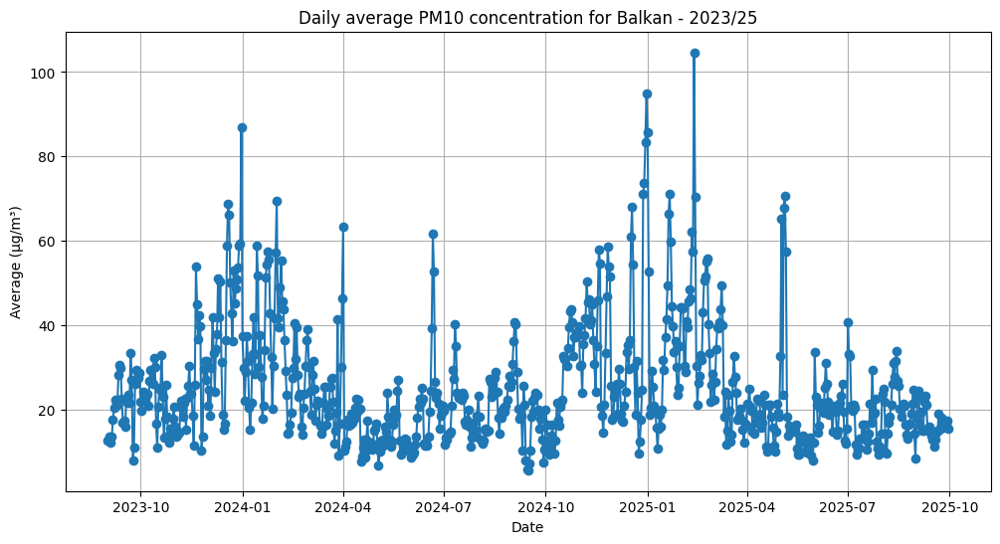

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,6))
plt.plot(df_pm10_per_day_balkan.index, df_pm10_per_day_balkan['Mean Value'], marker='o')
plt.title("Daily average PM10 concentration for Balkan - 2023/25")
plt.xlabel("Date")
plt.ylabel("Average (µg/m³)")
plt.grid(True)
plt.show()

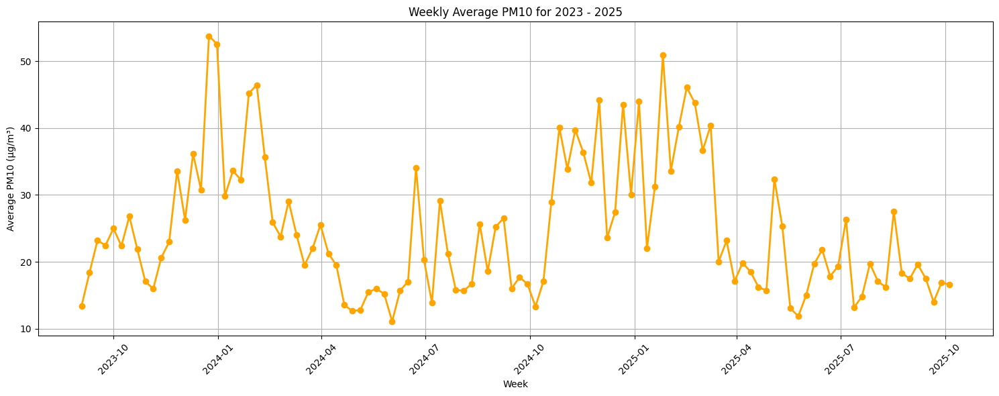

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

df_balkan_pm10['Datetime'] = pd.to_datetime(df_balkan_pm10['Datetime'], errors='coerce')
df_mne = df_balkan_pm10.dropna(subset=['Datetime'])

df_copy = df_mne.copy()

weekly_mean = df_copy.groupby(pd.Grouper(key='Datetime', freq='W')).mean().mean(axis=1)

plt.figure(figsize=(15,6))
plt.plot(weekly_mean.index, weekly_mean.values, color='orange', linewidth=2, marker='o')
plt.xlabel("Week")
plt.ylabel("Average PM10 (µg/m³)")
plt.title("Weekly Average PM10 for 2023 - 2025")
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
df_balkan_pm10["year"] = pd.to_datetime(df_balkan_pm10["Datetime"]).dt.year

results = []

for city in numeric_cols:
    idx = df_balkan_pm10[city].idxmax()
    results.append({
        "City": city,
        "Max_PM10": df_balkan_pm10.loc[idx, city],
        "Year": df_balkan_pm10.loc[idx, "year"]
    })

df_top = pd.DataFrame(results)

In [ ]:
top10 = df_top.sort_values("Max_PM10", ascending=False).head(10)
print("\033[1mTop 10 highest PM10 values through years:\033[0m")
top10 = top10.reset_index(drop=True)
print(top10)

Top 10 highest PM10 values through years:
           City  Max_PM10  Year
0      Sarajevo   984.990  2024
1        Zenica   923.660  2024
2        Niksic   678.300  2025
3  Bijelo_polje   626.000  2025
4  Bakar - luka   526.000  2023
5      Pljevlja   521.100  2023
6         Split   505.000  2025
7         Bihac   436.488  2024
8        Zagreb   390.000  2025
9     Podgorica   379.600  2023


In [ ]:
# Convert dataset into long format (if each city is a column)
df_long = df_balkan_pm10.melt(id_vars='Datetime', var_name='City', value_name='PM10')

# Define categories
bins = [0, 20, 40, 50, 100, 150, 1200]
labels = ['Excellent', 'Good', 'Moderate', 'Polluted', 'Very Polluted', 'Extremely Polluted']

/tmp/ipython-input-3333455918.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_long, x='Category', order=labels, palette='coolwarm')


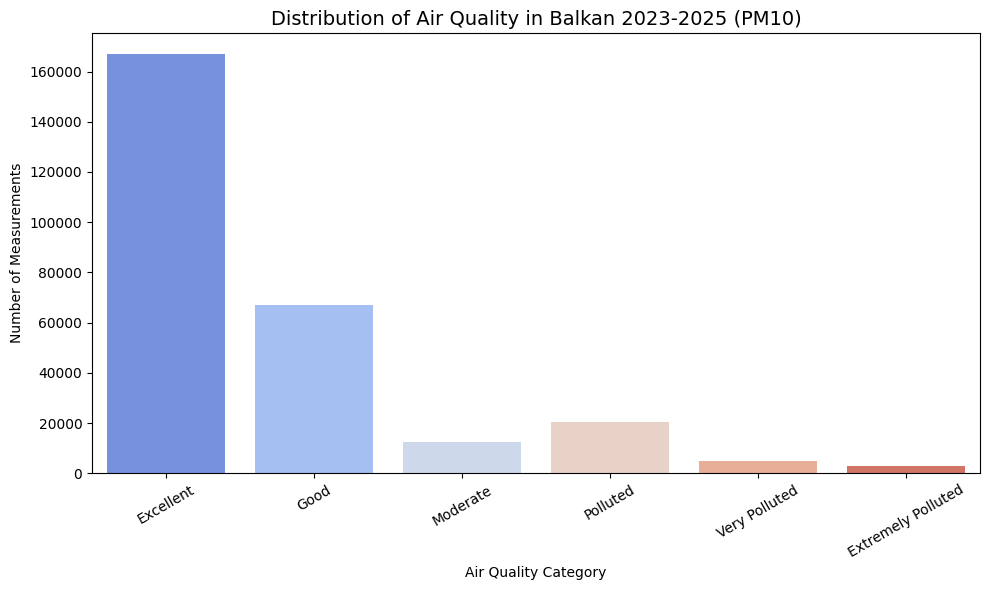

In [ ]:
import seaborn as sns

df_long['Category'] = pd.cut(df_long['PM10'], bins=bins, labels=labels, right=False)
plt.figure(figsize=(10, 6))
sns.countplot(data=df_long, x='Category', order=labels, palette='coolwarm')
plt.title("Distribution of Air Quality in Balkan 2023-2025 (PM10)", fontsize=14)
plt.xlabel("Air Quality Category")
plt.ylabel("Number of Measurements")
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

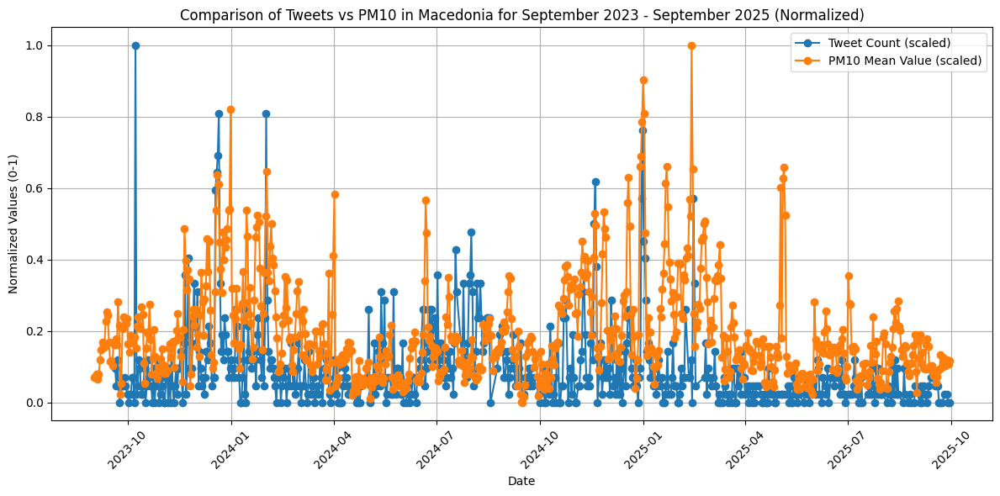

In [ ]:
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
import numpy as np
import pandas as pd

scaler = MinMaxScaler()

df_pm10_per_day_balkan['Datetime'] = pd.to_datetime(df_pm10_per_day_balkan['Datetime'], errors='coerce')

start_date = '2023-09-01'
end_date = '2025-09-30'
df_pm10_filtered = df_pm10_per_day_balkan[(df_pm10_per_day_balkan['Datetime'] >= start_date) &
                                             (df_pm10_per_day_balkan['Datetime'] <= end_date)]

tweets_scaled = scaler.fit_transform(df_blk_per_day['tweet_count'].values.reshape(-1,1))
pm10_scaled = scaler.fit_transform(df_pm10_filtered['Mean Value'].values.reshape(-1,1))

plt.figure(figsize=(12,6))
plt.plot(df_blk_per_day['created_at'], tweets_scaled, label='Tweet Count (scaled)', marker='o')
plt.plot(df_pm10_filtered['Datetime'], pm10_scaled, label='PM10 Mean Value (scaled)', marker='o')
plt.title('Comparison of Tweets vs PM10 in Macedonia for September 2023 - September 2025 (Normalized)')
plt.xlabel('Date')
plt.ylabel('Normalized Values (0-1)')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# ***Sentiment Macedonia***

***RoBERTa***

In [ ]:
df_macedonia = pd.read_csv("/content/drive/MyDrive/PraksaMANU/Tweets Macedonia Merged/Tweets_Macedonia_sept2023_sept2025.csv")

In [ ]:
import pandas as pd
import numpy as np
import torch
from scipy.special import softmax
from transformers import AutoModelForSequenceClassification, AutoTokenizer, AutoConfig

# Load model
MODEL = "cardiffnlp/twitter-roberta-base-sentiment-latest"
tokenizer = AutoTokenizer.from_pretrained(MODEL)
config = AutoConfig.from_pretrained(MODEL)
model = AutoModelForSequenceClassification.from_pretrained(MODEL)

# Move model to GPU if available
device = "cuda" if torch.cuda.is_available() else "cpu"
print("Using device:", device)
model.to(device)

# Prepare dataframe
df_macedonia["RoBerta-sentiment"] = ""

# Batch size for GPU
batch_size = 32

positive_count = 0
negative_count = 0
neutral_count = 0

def preprocess_sentiment_RoBerta(text):
    if not isinstance(text, str):
        return None
    return text.strip()

texts = df_macedonia["text_en"].astype(str).tolist()
results = []

# Process in batches
for i in range(0, len(texts), batch_size):
    batch = texts[i : i + batch_size]
    batch = [preprocess_sentiment_RoBerta(t) for t in batch]
    batch = [t for t in batch if t]  # remove empty

    if not batch:
        continue

    # Tokenize on GPU
    encoded_input = tokenizer(batch, return_tensors='pt', truncation=True, padding=True)
    encoded_input = {k: v.to(device) for k, v in encoded_input.items()}

    # Forward pass
    with torch.no_grad():
        output = model(**encoded_input)

    # Softmax on GPU → move to CPU for numpy
    scores = softmax(output.logits.cpu().numpy(), axis=1)

    # Predictions
    batch_predictions = np.argmax(scores, axis=1)

    for pred_id in batch_predictions:
        label = config.id2label[pred_id]
        results.append(label)

# Store results
df_macedonia["RoBerta-sentiment"] = results

# Count values
positive_count = results.count("positive")
negative_count = results.count("negative")
neutral_count = results.count("neutral")

total = positive_count + negative_count + neutral_count

print("=== RoBERTa Sentiment Results (GPU) ===")
print(f"Positive: {positive_count} ({positive_count / total * 100:.2f}%)")
print(f"Negative: {negative_count} ({negative_count / total * 100:.2f}%)")
print(f"Neutral: {neutral_count} ({neutral_count / total * 100:.2f}%)")

columns_to_save = ["id", "text_en", "created_at", "RoBerta-sentiment"]

df_macedonia[columns_to_save].to_csv(
    "/content/drive/MyDrive/PraksaMANU/Tweets Macedonia Merged/Sentiment analyses/Tweets_Macedonia_with_RoBERTa_sentiment.csv",
    index=False
)
print("\nDONE! ☑️")

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/929 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/239 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/501M [00:00<?, ?B/s]

Some weights of the model checkpoint at cardiffnlp/twitter-roberta-base-sentiment-latest were not used when initializing RobertaForSequenceClassification: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


Using device: cuda


model.safetensors:   0%|          | 0.00/501M [00:00<?, ?B/s]

Asking to truncate to max_length but no maximum length is provided and the model has no predefined maximum length. Default to no truncation.


=== RoBERTa Sentiment Results (GPU) ===
Positive: 495 (8.13%)
Negative: 3189 (52.39%)
Neutral: 2403 (39.48%)

DONE! ☑️


***BERTweet***

In [ ]:
!pip install transformers torch pandas tqdm --quiet

from transformers import pipeline
import pandas as pd
from tqdm import tqdm

texts = df_macedonia["text_en"].fillna("").astype(str).tolist()

pipe_bertweet = pipeline(
    "sentiment-analysis",
    model="finiteautomata/bertweet-base-sentiment-analysis",
    tokenizer="finiteautomata/bertweet-base-sentiment-analysis",
    device=0,
    batch_size=32
)

df_macedonia["BERTweet-sentiment"] = ""

batch_size = 32
results = []

# map returned labels
label_map = {
    "POS": "positive",
    "NEG": "negative",
    "NEU": "neutral"
}

for i in tqdm(range(0, len(texts), batch_size), desc="Running BERTweet sentiment (BATCH)"):
    batch = texts[i : i + batch_size]

    outputs = pipe_bertweet(batch, truncation=True, max_length=128)

    for out in outputs:
        mapped = label_map.get(out["label"], "neutral")
        results.append(mapped)

df_macedonia["BERTweet-sentiment"] = results

positive_count = results.count("positive")
negative_count = results.count("negative")
neutral_count = results.count("neutral")

columns_to_save = ["id", "text_en", "created_at", "BERTweet-sentiment"]
df_macedonia[columns_to_save].to_csv(
    "/content/drive/MyDrive/PraksaMANU/Tweets Macedonia Merged/Sentiment analyses/Tweets_Macedonia_with_BERTweet_sentiment.csv",
    index=False
)

total = len(results)
print("=== BERTweet Sentiment Results ===")
print(f"Positive: {positive_count} ({positive_count/total*100:.2f}%)")
print(f"Negative: {negative_count} ({negative_count/total*100:.2f}%)")
print(f"Neutral: {neutral_count} ({neutral_count/total*100:.2f}%)")


config.json:   0%|          | 0.00/949 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/540M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/540M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/338 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

bpe.codes: 0.00B [00:00, ?B/s]

added_tokens.json:   0%|          | 0.00/22.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/167 [00:00<?, ?B/s]

emoji is not installed, thus not converting emoticons or emojis into text. Install emoji: pip3 install emoji==0.6.0
Device set to use cuda:0

Running BERTweet sentiment (BATCH):   5%|▌         | 10/191 [00:02<00:28,  6.38it/s]You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset

Running BERTweet sentiment (BATCH): 100%|██████████| 191/191 [00:25<00:00,  7.43it/s]


=== BERTweet Sentiment Results ===
Positive: 576 (9.46%)
Negative: 3190 (52.41%)
Neutral: 2321 (38.13%)


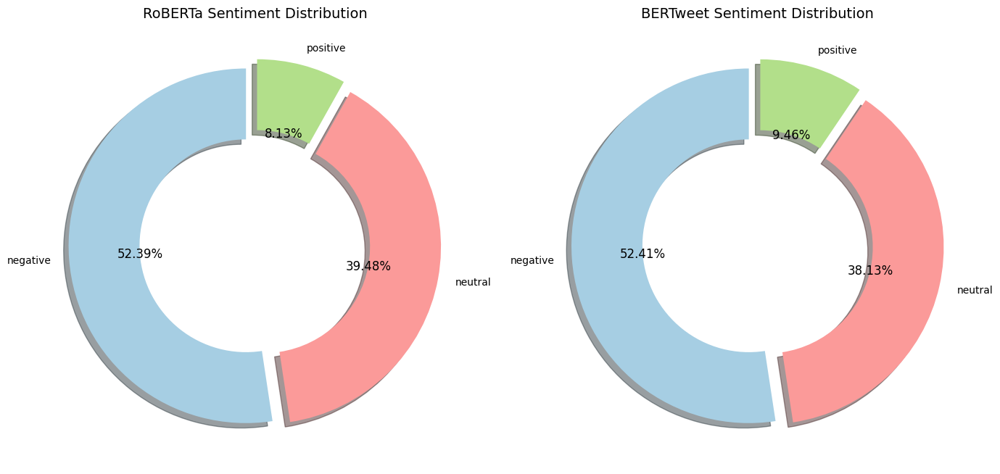

In [ ]:
import matplotlib.pyplot as plt

roberta_counts = df_macedonia['RoBerta-sentiment'].value_counts()
bertweet_counts = df_macedonia['BERTweet-sentiment'].value_counts()

colors = ['#a6cee3', '#fb9a99', '#b2df8a']  # blue, red, green

explode = (0.05, 0.05, 0.05)

fig, axes = plt.subplots(1, 2, figsize=(14,7))

# RoBERTa donut pie chart
wedges1, texts1, autotexts1 = axes[0].pie(
    roberta_counts,
    labels=roberta_counts.index,
    autopct='%1.2f%%',
    startangle=90,
    colors=colors,
    explode=explode,
    shadow=True,
    wedgeprops=dict(width=0.4)
)
axes[0].set_title('RoBERTa Sentiment Distribution', fontsize=14)

# BERTweet donut pie chart
wedges2, texts2, autotexts2 = axes[1].pie(
    bertweet_counts,
    labels=bertweet_counts.index,
    autopct='%1.2f%%',
    startangle=90,
    colors=colors,
    explode=explode,
    shadow=True,
    wedgeprops=dict(width=0.4)
)
axes[1].set_title('BERTweet Sentiment Distribution', fontsize=14)

for t in autotexts1 + autotexts2:
    t.set_color('black')
    t.set_fontsize(12)

plt.tight_layout()
plt.show()


# ***Sentiment Balkan***

In [ ]:
df_balkan = pd.read_csv("/content/drive/MyDrive/PraksaMANU/Tweets Balkan Merged/Tweets_Balkan_sept2023_sept2025.csv")

In [ ]:
import pandas as pd
import numpy as np
import torch
from scipy.special import softmax
from transformers import AutoTokenizer, AutoModelForSequenceClassification, AutoConfig

MODEL = "cardiffnlp/twitter-roberta-base-sentiment-latest"
tokenizer = AutoTokenizer.from_pretrained(MODEL)
config = AutoConfig.from_pretrained(MODEL)
model = AutoModelForSequenceClassification.from_pretrained(MODEL)

# Move model to GPU if available
device = "cuda" if torch.cuda.is_available() else "cpu"
print("Using device:", device)
model.to(device)

# Prepare dataframe
df_balkan["RoBerta-sentiment"] = ""

# Batch size for GPU
batch_size = 32

positive_count = 0
negative_count = 0
neutral_count = 0

def preprocess_sentiment_RoBerta(text):
    if not isinstance(text, str):
        return None
    return text.strip()

texts = df_balkan["text_en"].astype(str).tolist()
results = []

# Process in batches
for i in range(0, len(texts), batch_size):
    batch = texts[i : i + batch_size]
    batch = [preprocess_sentiment_RoBerta(t) for t in batch]
    batch = [t for t in batch if t]  # remove empty

    if not batch:
        continue

    # Tokenize on GPU
    encoded_input = tokenizer(batch, return_tensors='pt', truncation=True, padding=True)
    encoded_input = {k: v.to(device) for k, v in encoded_input.items()}

    # Forward pass
    with torch.no_grad():
        output = model(**encoded_input)

    # Softmax on GPU → move to CPU for numpy
    scores = softmax(output.logits.cpu().numpy(), axis=1)

    # Predictions
    batch_predictions = np.argmax(scores, axis=1)

    for pred_id in batch_predictions:
        label = config.id2label[pred_id]
        results.append(label)

# Store results
df_balkan["RoBerta-sentiment"] = results

# Count values
positive_count = results.count("positive")
negative_count = results.count("negative")
neutral_count = results.count("neutral")

total = positive_count + negative_count + neutral_count

print("=== RoBERTa Sentiment Results (GPU) ===")
print(f"Positive: {positive_count} ({positive_count / total * 100:.2f}%)")
print(f"Negative: {negative_count} ({negative_count / total * 100:.2f}%)")
print(f"Neutral: {neutral_count} ({neutral_count / total * 100:.2f}%)")

columns_to_save = ["id", "text_en", "created_at", "RoBerta-sentiment"]

df_balkan[columns_to_save].to_csv(
    "/content/drive/MyDrive/PraksaMANU/Tweets Balkan Merged/Tweets_Balkan_with_RoBERTa_sentiment.csv",
    index=False
)
print("\nDONE! ☑️")

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/929 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/239 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/501M [00:00<?, ?B/s]

Some weights of the model checkpoint at cardiffnlp/twitter-roberta-base-sentiment-latest were not used when initializing RobertaForSequenceClassification: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


Using device: cuda


model.safetensors:   0%|          | 0.00/501M [00:00<?, ?B/s]

Asking to truncate to max_length but no maximum length is provided and the model has no predefined maximum length. Default to no truncation.


=== RoBERTa Sentiment Results (GPU) ===
Positive: 147 (4.63%)
Negative: 1772 (55.78%)
Neutral: 1258 (39.60%)

DONE! ☑️


***BERTweet***

In [ ]:
# !pip install transformers torch pandas tqdm --quiet

from transformers import pipeline
import pandas as pd
from tqdm import tqdm

texts = df_balkan["text_en"].fillna("").astype(str).tolist()

pipe_bertweet = pipeline(
    "sentiment-analysis",
    model="finiteautomata/bertweet-base-sentiment-analysis",
    tokenizer="finiteautomata/bertweet-base-sentiment-analysis",
    device=0,
    batch_size=32
)

df_balkan["BERTweet-sentiment"] = ""

batch_size = 32
results = []

# map returned labels
label_map = {
    "POS": "positive",
    "NEG": "negative",
    "NEU": "neutral"
}

for i in tqdm(range(0, len(texts), batch_size), desc="Running BERTweet sentiment (BATCH)"):
    batch = texts[i : i + batch_size]

    outputs = pipe_bertweet(batch, truncation=True, max_length=128)

    for out in outputs:
        mapped = label_map.get(out["label"], "neutral")
        results.append(mapped)

df_balkan["BERTweet-sentiment"] = results

positive_count = results.count("positive")
negative_count = results.count("negative")
neutral_count = results.count("neutral")

columns_to_save = ["id", "text_en", "created_at", "BERTweet-sentiment"]
df_balkan[columns_to_save].to_csv(
    "/content/drive/MyDrive/PraksaMANU/Tweets Balkan Merged/Tweets_Balkan_with_BERTweet_sentiment.csv",
    index=False
)

total = len(results)
print("=== BERTweet Sentiment Results ===")
print(f"Positive: {positive_count} ({positive_count/total*100:.2f}%)")
print(f"Negative: {negative_count} ({negative_count/total*100:.2f}%)")
print(f"Neutral: {neutral_count} ({neutral_count/total*100:.2f}%)")

emoji is not installed, thus not converting emoticons or emojis into text. Install emoji: pip3 install emoji==0.6.0
Device set to use cuda:0
Running BERTweet sentiment (BATCH): 100%|██████████| 100/100 [00:15<00:00,  6.65it/s]


=== BERTweet Sentiment Results ===
Positive: 173 (5.45%)
Negative: 1710 (53.82%)
Neutral: 1294 (40.73%)


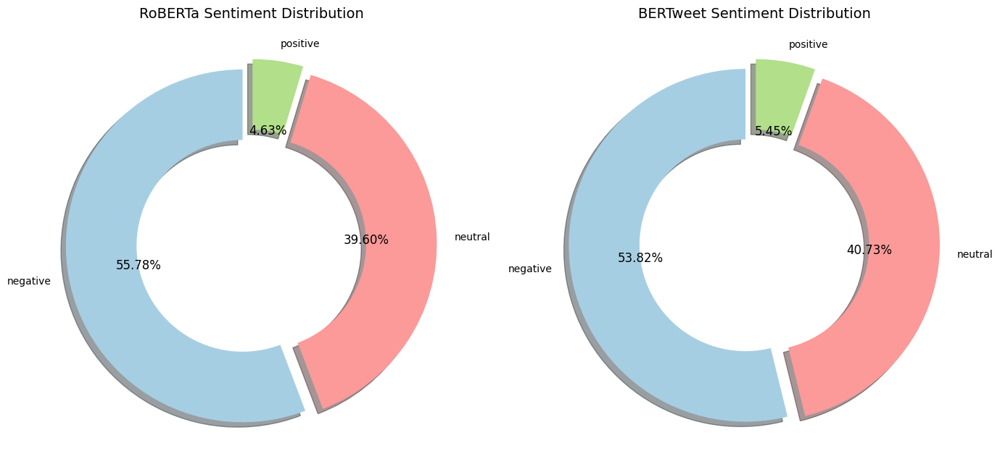

In [ ]:
import matplotlib.pyplot as plt

roberta_counts = df_balkan['RoBerta-sentiment'].value_counts()
bertweet_counts = df_balkan['BERTweet-sentiment'].value_counts()

colors = ['#a6cee3', '#fb9a99', '#b2df8a']  # blue, red, green

explode = (0.05, 0.05, 0.05)

fig, axes = plt.subplots(1, 2, figsize=(14,7))

# RoBERTa donut pie chart
wedges1, texts1, autotexts1 = axes[0].pie(
    roberta_counts,
    labels=roberta_counts.index,
    autopct='%1.2f%%',
    startangle=90,
    colors=colors,
    explode=explode,
    shadow=True,
    wedgeprops=dict(width=0.4)
)
axes[0].set_title('RoBERTa Sentiment Distribution', fontsize=14)

# BERTweet donut pie chart
wedges2, texts2, autotexts2 = axes[1].pie(
    bertweet_counts,
    labels=bertweet_counts.index,
    autopct='%1.2f%%',
    startangle=90,
    colors=colors,
    explode=explode,
    shadow=True,
    wedgeprops=dict(width=0.4)
)
axes[1].set_title('BERTweet Sentiment Distribution', fontsize=14)

for t in autotexts1 + autotexts2:
    t.set_color('black')
    t.set_fontsize(12)

plt.tight_layout()
plt.show()


# **Topic Modeling**

##***start-up***

In [ ]:
!pip install preprocessor
!pip install tweet-preprocessor
!pip install bertopic
import nltk
nltk.download('averaged_perceptron_tagger')
nltk.download('averaged_perceptron_tagger_eng')
nltk.download('wordnet')
nltk.download('omw-1.4')
nltk.download('stopwords')

  Preparing metadata (setup.py) ... done
  Created wheel for preprocessor: filename=preprocessor-1.1.3-py3-none-any.whl size=4474 sha256=413c9cd7a712899c41228110495a5d4f90a6cbd4e88560f84f1d907c61fb04ec
  Stored in directory: /root/.cache/pip/wheels/60/33/31/972a156cd609581707e69298b91f0e42d349c08fefc173e19e
Successfully built preprocessor
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.7/154.7 kB 16.4 MB/s eta 0:00:00


[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger_eng.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
from nltk.corpus import wordnet, stopwords
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud
from nltk.corpus import wordnet, stopwords
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud
import preprocessor as p
from umap import UMAP
from hdbscan import HDBSCAN
from sklearn.feature_extraction.text import CountVectorizer
import re
from sentence_transformers import SentenceTransformer
from bertopic import BERTopic
from bertopic.vectorizers import ClassTfidfTransformer
# import pymannkendall as mk
# import scipy
# from scipy import signal
# import statsmodels.api as sm
# from scipy.stats import spearmanr
# import plotly.graph_objects as go
# from textblob import TextBlob
# from scipy.stats import kruskal
# import math

/usr/local/lib/python3.12/dist-packages/hdbscan/robust_single_linkage_.py:175: SyntaxWarning: invalid escape sequence '\{'
  $max \{ core_k(a), core_k(b), 1/\alpha d(a,b) \}$.


In [ ]:
def get_wordnet_pos(treebank_tag):
    if treebank_tag.startswith('J'):
        return wordnet.ADJ
    elif treebank_tag.startswith('V'):
        return wordnet.VERB
    elif treebank_tag.startswith('N'):
        return wordnet.NOUN
    elif treebank_tag.startswith('R'):
        return wordnet.ADV
    else:
        # kako default pos vo lemmatization e Noun
        return wordnet.NOUN

In [ ]:
def remove_hashtag_sign(text):
    text = re.sub(r'#', '', text)
    return text

In [ ]:
def get_bert_topics(topic_model, num_topics):
    word_dict = {}
    for i in range(num_topics):
        words=topic_model.get_topic(i)
        word_dict['Topic # ' + '{:02d}'.format(i+1)] = [i[0] for i in words]
    return pd.DataFrame(word_dict)

In [ ]:
def create_wordcloud(topic_model, topic):
    topic_words = topic_model.get_topic(topic)

    if topic_words:
        text = {word: value for word, value in topic_words}
        wc = WordCloud(background_color="white", max_words=1000)
        wc.generate_from_frequencies(text)
        plt.imshow(wc, interpolation="bilinear")
        plt.axis("off")
        plt.title("Topic " + str(topic))
        plt.show()
    else:
        print(f"Topic {topic} not found or has no associated words.")

#***Macedonia***

In [ ]:
df_air_pollution_mkd = pd.read_csv("/content/drive/MyDrive/PraksaMANU/Tweets Macedonia Merged/Tweets_Macedonia_sept2023_sept2025.csv")
df_air_pollution_mkd

,text_en,created_at,id
0,"Come on, there's a little more unnecessary con...",2023-09-13 19:05:20,NaN
1,I'm not satisfied with this: environmental pol...,2023-09-12 21:10:05,NaN
2,We'll breathe like that.,2023-09-12 08:01:52,NaN
3,I don't know what's in those sick minds. I jus...,2023-09-11 22:04:20,NaN
4,I'm not satisfied with this: environmental pol...,2023-09-11 16:33:49,NaN
...,...,...,...
6082,November pollution in Tetovo: PM10 and PM25 pa...,2025-11-20 13:21:18,1.990000e+18
6083,Abe and Norway from Finland imports the garbag...,2025-11-20 11:23:58,1.990000e+18
6084,So it's all our priority if we breathe fresh a...,2025-11-20 09:54:18,1.990000e+18
6085,So maybe he'll raise his awareness of this peo...,2025-11-20 09:37:26,1.990000e+18


In [ ]:
df_topics_mkd = df_air_pollution_mkd[["text_en"]].copy()

p.set_options(p.OPT.URL, p.OPT.EMOJI, p.OPT.MENTION, p.OPT.SMILEY, p.OPT.NUMBER)

# 1. Clean
df_topics_mkd['text_en'] = df_topics_mkd['text_en'].apply(lambda x: p.clean(str(x)))

# 2. Remove #
df_topics_mkd['text_en'] = df_topics_mkd['text_en'].apply(remove_hashtag_sign)

# 3. Lowercase + punctuation cleanup
df_topics_mkd['text_en'] = (
    df_topics_mkd['text_en']
    .str.lower()
    .str.replace(r'[^\w\s]', ' ', regex=True)
    .str.replace(r'\s\s+', ' ', regex=True)
    .str.strip()
)

# 4. Remove empty
df_topics_mkd = df_topics_mkd[df_topics_mkd['text_en'].str.len() > 0]
timestamps_clean = pd.to_datetime(df_air_pollution_mkd.loc[df_topics_mkd.index, "created_at"]).tolist()


# 5. Lemmatization
lemmatizer = WordNetLemmatizer()
lemmatized_tweet_list = []

for sentence in df_topics_mkd['text_en']:
    words = sentence.split()
    tagged_words = nltk.pos_tag(words)
    lemmatized_sentence = " ".join([
        lemmatizer.lemmatize(word, get_wordnet_pos(pos))
        for word, pos in tagged_words
    ])
    lemmatized_tweet_list.append(lemmatized_sentence)

# final check
print(len(lemmatized_tweet_list))

6084


### ***All Tweets***

In [ ]:
# stopwords i vectorizer(gi pretvora tvitovite vo bag-of-words matrica)
english_stopwords = stopwords.words('english')
custom_stopwords = ["http", "rt", "pollution", "polluted", "air", "pollute", "breathe"]
english_stopwords.extend(custom_stopwords)

vectorizer_model = CountVectorizer(stop_words=english_stopwords)

vectorized_data = vectorizer_model.fit_transform(lemmatized_tweet_list)
text_without_stopwords = vectorizer_model.inverse_transform(vectorized_data)

topics_tweet_list = [" ".join(words) for words in text_without_stopwords]

In [ ]:
# embeddings - sekoja recenica vo vektor
embedding_model = SentenceTransformer("all-MiniLM-L6-v2")
embedded_tweets = embedding_model.encode(topics_tweet_list)

# namaluvanje na dimenzii so UMAP
umap_model = UMAP(n_components=5)
umap_embeddings = umap_model.fit_transform(embedded_tweets)

# HDBSCAN - klasteriranje, naogja avtomatski temi bez da ima k
hdbscan_model = HDBSCAN(
    min_cluster_size=10,
    min_samples=6,
    gen_min_span_tree=True,
    prediction_data=True
)

hdbscan_model.fit(umap_embeddings)

# BERTopic - gi kombinira gornonavedenite i izvojuva temi
ctfidf_model = ClassTfidfTransformer()

topic_model = BERTopic(
    hdbscan_model=hdbscan_model,
    embedding_model=embedding_model,
    nr_topics=10,
    ctfidf_model=ctfidf_model,
    vectorizer_model=vectorizer_model,
    umap_model=umap_model,
    low_memory=True,
    calculate_probabilities=True,
    verbose=True,
    n_gram_range=(1, 5)
)

topics, probs = topic_model.fit_transform(topics_tweet_list)

2026-01-11 21:02:13,359 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/191 [00:00<?, ?it/s]

2026-01-11 21:02:15,223 - BERTopic - Embedding - Completed ✓
2026-01-11 21:02:15,223 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2026-01-11 21:02:25,494 - BERTopic - Dimensionality - Completed ✓
2026-01-11 21:02:25,495 - BERTopic - Cluster - Start clustering the reduced embeddings
2026-01-11 21:02:28,286 - BERTopic - Cluster - Completed ✓
2026-01-11 21:02:28,287 - BERTopic - Representation - Extracting topics using c-TF-IDF for topic reduction.
2026-01-11 21:02:28,406 - BERTopic - Representation - Completed ✓
2026-01-11 21:02:28,407 - BERTopic - Topic reduction - Reducing number of topics
2026-01-11 21:02:28,422 - BERTopic - Representation - Fine-tuning topics using representation models.
2026-01-11 21:02:28,531 - BERTopic - Representation - Completed ✓
2026-01-11 21:02:28,533 - BERTopic - Topic reduction - Reduced number of topics from 101 to 10


In [ ]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,3094,-1_skopje_contaminate_one_go,"[skopje, contaminate, one, go, like, burn, get...",[year allow one burn everything country lot pe...
1,0,1291,0_contaminate_smell_burn_like,"[contaminate, smell, burn, like, fire, contami...",[know burn burning dump field someone season w...
2,1,998,1_skopje_protest_macedonia_people,"[skopje, protest, macedonia, people, city, con...","[skopje, skopje, skopje contaminate]"
3,2,526,2_clear_clean_like_go,"[clear, clean, like, go, bitola, year, see, kn...","[clear, clear, clear]"
4,3,98,3_pm10_m3_pm2_edg,"[pm10, m3, pm2, edg, measure, pm, particle, ma...",[two source main city third pm2 municipal bad ...
5,4,24,4_child_parent_accident_live,"[child, parent, accident, live, care, brother,...",[year less ask live problem authority solution...
6,5,23,5_allergy_sinus_worsen_factor,"[allergy, sinus, worsen, factor, cough, allerg...",[especially heat season main every today facto...
7,6,10,6_cement_store_cementara_osce,"[cement, store, cementara, osce, around, work,...","[like morning today cementara cement, entire a..."
8,7,10,7_sound_correctly_atmospheric_additional,"[sound, correctly, atmospheric, additional, lo...",[well set measurement additional sound station...
9,8,10,8_trubarevo_ispp_quality_result,"[trubarevo, ispp, quality, result, trubars, tr...","[contaminate particle pm trubarevo ispp, quali..."


In [ ]:
topic_model.get_topic(0)

[('contaminate', np.float64(0.04385516767557689)),
 ('smell', np.float64(0.02732643525354473)),
 ('burn', np.float64(0.026987254854715786)),
 ('like', np.float64(0.02565140834139637)),
 ('fire', np.float64(0.023687703647317843)),
 ('contamination', np.float64(0.023147909680323247)),
 ('water', np.float64(0.02198108672549686)),
 ('smoke', np.float64(0.02142046665463413)),
 ('year', np.float64(0.01938601409268978)),
 ('get', np.float64(0.019303011631240125))]

In [ ]:
topic_model.visualize_barchart()

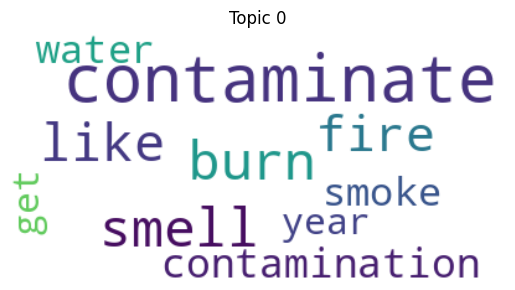

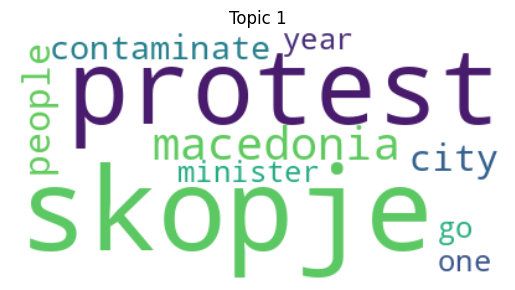

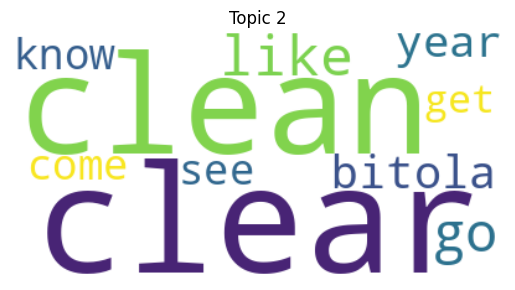

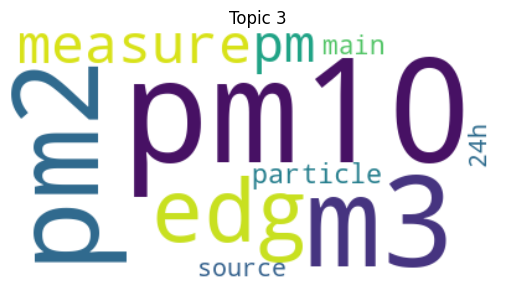

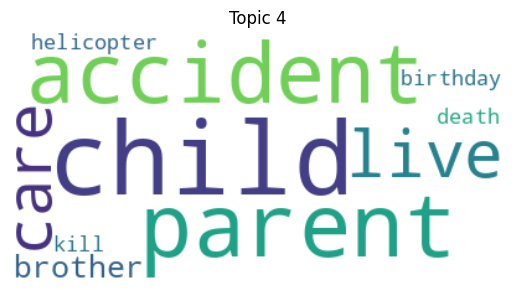

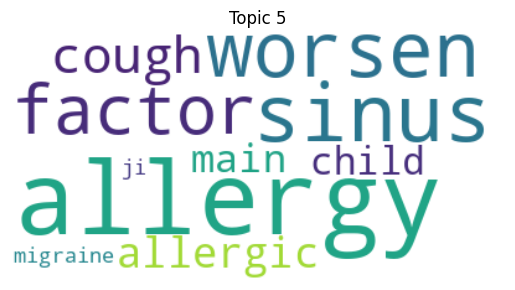

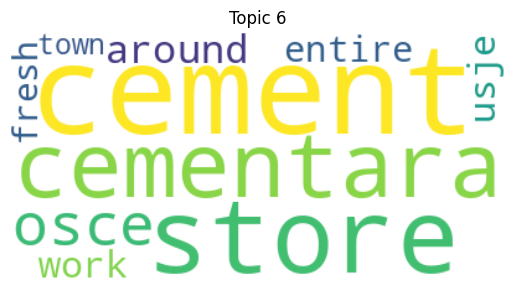

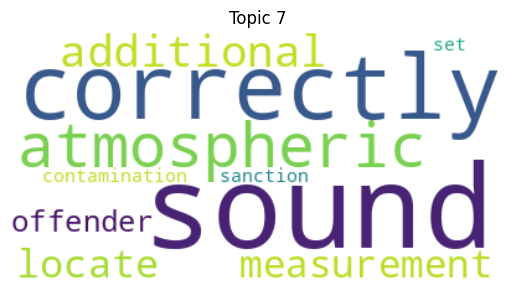

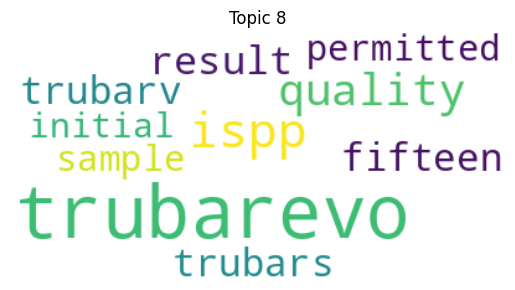

In [ ]:
for i in range(len(set(topics))-1):
    create_wordcloud(topic_model, topic=i)

In [ ]:
topics_over_time = topic_model.topics_over_time(topics_tweet_list, timestamps_clean,
                                                global_tuning=True, evolution_tuning=True, nr_bins=20)

topic_model.visualize_topics_over_time(topics_over_time)

20it [00:00, 35.97it/s]


In [ ]:
topic_model.visualize_topics()

## ***Positive / Negative / Neutral***

In [ ]:
df_roberta = pd.read_csv("/content/drive/MyDrive/PraksaMANU/Tweets Macedonia Merged/Sentiment analyses/Tweets_Macedonia_with_RoBERTa_sentiment.csv")
df_bertweet = pd.read_csv("/content/drive/MyDrive/PraksaMANU/Tweets Macedonia Merged/Sentiment analyses/Tweets_Macedonia_with_BERTweet_sentiment.csv")

### ***Positive***

In [ ]:
# RoBERTa dataset
df_positive = df_roberta[df_roberta['RoBerta-sentiment'] == 'positive'].copy()
positive_tweets = df_positive['text_en'].tolist()

In [ ]:
len(positive_tweets)

495

In [ ]:
timestamps_positive = pd.to_datetime(df_positive['created_at']).tolist()

In [ ]:
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
from sklearn.feature_extraction.text import CountVectorizer
from umap import UMAP
from hdbscan import HDBSCAN
from bertopic.vectorizers import ClassTfidfTransformer
from nltk.corpus import stopwords

# Stopwords
english_stopwords = stopwords.words('english')
custom_stopwords = ["http", "rt", "pollution", "polluted", "air", "pollute", "breathe"]
english_stopwords.extend(custom_stopwords)

vectorizer_model = CountVectorizer(stop_words=english_stopwords)
embedding_model = SentenceTransformer("all-MiniLM-L6-v2")
umap_model = UMAP(n_components=5)
hdbscan_model = HDBSCAN(min_cluster_size=15, min_samples=6, gen_min_span_tree=True, prediction_data=True)
ctfidf_model = ClassTfidfTransformer()

topic_model_positive = BERTopic(
    hdbscan_model=hdbscan_model,
    embedding_model=embedding_model,
    nr_topics=10,
    ctfidf_model=ctfidf_model,
    vectorizer_model=vectorizer_model,
    umap_model=umap_model,
    low_memory=True,
    calculate_probabilities=True,
    verbose=True,
    n_gram_range=(1, 5)
)

topics_positive, probs_positive = topic_model_positive.fit_transform(positive_tweets)
topic_model_positive.get_topic_info()

2025-12-16 14:39:56,826 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/16 [00:00<?, ?it/s]

2025-12-16 14:39:57,204 - BERTopic - Embedding - Completed ✓
2025-12-16 14:39:57,206 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-12-16 14:39:58,023 - BERTopic - Dimensionality - Completed ✓
2025-12-16 14:39:58,024 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-12-16 14:39:58,054 - BERTopic - Cluster - Completed ✓
2025-12-16 14:39:58,054 - BERTopic - Representation - Extracting topics using c-TF-IDF for topic reduction.
2025-12-16 14:39:58,076 - BERTopic - Representation - Completed ✓
2025-12-16 14:39:58,077 - BERTopic - Topic reduction - Reducing number of topics
2025-12-16 14:39:58,077 - BERTopic - Topic reduction - Number of topics (10) is equal or higher than the clustered topics(6).
2025-12-16 14:39:58,078 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-12-16 14:39:58,111 - BERTopic - Representation - Completed ✓


,Topic,Count,Name,Representation,Representative_Docs
0,-1,164,-1_good_beautiful_like_love,"[good, beautiful, like, love, morning, clean, ...","[Good morning, Good morning., I would be proud..."
1,0,38,0_weather_spring_smell_fire,"[weather, spring, smell, fire, day, beautiful,...","[Colder weather, minus two degrees is the high..."
2,1,152,1_clear_clean_gonna_least,"[clear, clean, gonna, least, happen, going, fe...","[The air's clear., Their air is clear, But the..."
3,2,66,2_skopje_macedonia_new_city,"[skopje, macedonia, new, city, great, beautifu...",[Skopje is another city when the air is clear....
4,3,48,3_less_traffic_term_benefits,"[less, traffic, term, benefits, dealing, trans...",[I'm so big on electricity savings that a gas-...
5,4,27,4_contaminated_water_spray_fish,"[contaminated, water, spray, fish, windows, lo...",[I have an apple in my yard and we never spray...


In [ ]:
topic_model_positive.get_topic(0)

[('weather', np.float64(0.07810840918683797)),
 ('spring', np.float64(0.0740283872678828)),
 ('smell', np.float64(0.06198949091684439)),
 ('fire', np.float64(0.06198949091684439)),
 ('day', np.float64(0.06197696168853119)),
 ('beautiful', np.float64(0.061291620900372476)),
 ('like', np.float64(0.06026267187214504)),
 ('cold', np.float64(0.052877419477059144)),
 ('warm', np.float64(0.051657909097370336)),
 ('sun', np.float64(0.051657909097370336))]

In [ ]:
topic_model_positive.visualize_barchart()

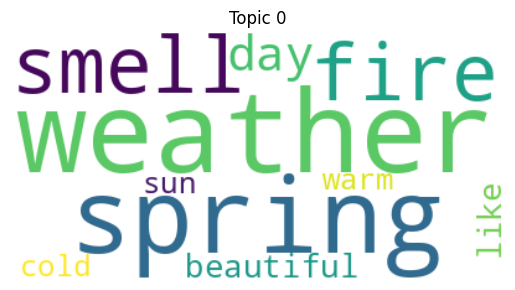

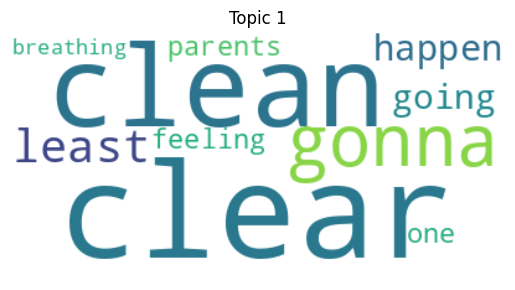

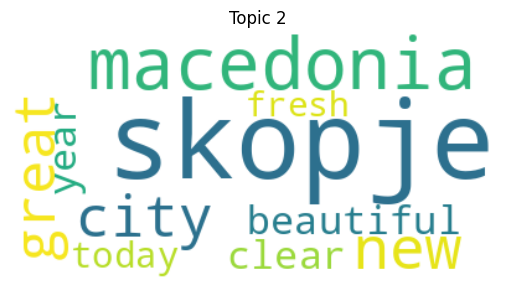

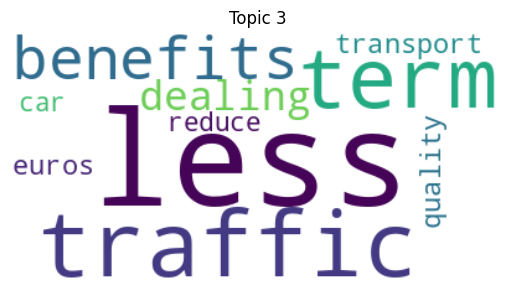

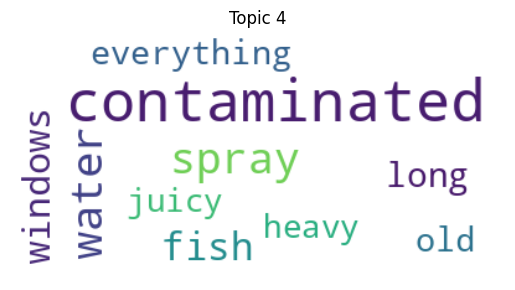

In [ ]:
for i in range(len(set(topics_positive))-1):
    create_wordcloud(topic_model_positive, topic=i)

In [ ]:
topics_over_time_positive = topic_model_positive.topics_over_time(
    positive_tweets,
    timestamps_positive,
    global_tuning=True,
    evolution_tuning=True,
    nr_bins=20
)
fig = topic_model_positive.visualize_topics_over_time(topics_over_time_positive)
fig.show()

20it [00:00, 47.45it/s]


In [ ]:
topic_model_positive.visualize_topics()

In [ ]:
# BERTweet dataset
df_positive_bertweet = df_bertweet[df_bertweet['BERTweet-sentiment'] == 'positive'].copy()
positive_tweets_bertweet = df_positive_bertweet['text_en'].tolist()

In [ ]:
len(df_positive_bertweet)

576

In [ ]:
timestamps_positive_bertweet = pd.to_datetime(df_positive_bertweet['created_at']).tolist()

In [ ]:
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
from sklearn.feature_extraction.text import CountVectorizer
from umap import UMAP
from hdbscan import HDBSCAN
from bertopic.vectorizers import ClassTfidfTransformer
from nltk.corpus import stopwords

# Stopwords
english_stopwords = stopwords.words('english')
custom_stopwords = ["http", "rt", "pollution", "polluted", "air", "pollute", "breathe"]
english_stopwords.extend(custom_stopwords)

vectorizer_model = CountVectorizer(stop_words=english_stopwords)
embedding_model = SentenceTransformer("all-MiniLM-L6-v2")
umap_model = UMAP(n_components=5)
hdbscan_model = HDBSCAN(min_cluster_size=10, min_samples=6, gen_min_span_tree=True, prediction_data=True)
ctfidf_model = ClassTfidfTransformer()

topic_model_positive = BERTopic(
    hdbscan_model=hdbscan_model,
    embedding_model=embedding_model,
    nr_topics=10,
    ctfidf_model=ctfidf_model,
    vectorizer_model=vectorizer_model,
    umap_model=umap_model,
    low_memory=True,
    calculate_probabilities=True,
    verbose=True,
    n_gram_range=(1, 5)
)

topics_positive, probs_positive = topic_model_positive.fit_transform(positive_tweets_bertweet)
topic_model_positive.get_topic_info()

2026-01-23 14:24:04,616 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/18 [00:00<?, ?it/s]

2026-01-23 14:24:05,099 - BERTopic - Embedding - Completed ✓
2026-01-23 14:24:05,100 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2026-01-23 14:24:06,134 - BERTopic - Dimensionality - Completed ✓
2026-01-23 14:24:06,135 - BERTopic - Cluster - Start clustering the reduced embeddings
2026-01-23 14:24:06,186 - BERTopic - Cluster - Completed ✓
2026-01-23 14:24:06,187 - BERTopic - Representation - Extracting topics using c-TF-IDF for topic reduction.
2026-01-23 14:24:06,214 - BERTopic - Representation - Completed ✓
2026-01-23 14:24:06,215 - BERTopic - Topic reduction - Reducing number of topics
2026-01-23 14:24:06,222 - BERTopic - Representation - Fine-tuning topics using representation models.
2026-01-23 14:24:06,243 - BERTopic - Representation - Completed ✓
2026-01-23 14:24:06,245 - BERTopic - Topic reduction - Reduced number of topics from 13 to 10


,Topic,Count,Name,Representation,Representative_Docs
0,-1,247,-1_like_love_quality_life,"[like, love, quality, life, power, good, days,...",[We have a clear message and then it's done. E...
1,0,77,0_skopje_macedonia_new_city,"[skopje, macedonia, new, city, river, beautifu...",[Skopje is another city when the air is clear....
2,1,52,1_clear_cleaner_clean_least,"[clear, cleaner, clean, least, good, wind, roo...","[When the air is in power somehow cleaner, it'..."
3,2,46,2_beautiful_weather_smells_like,"[beautiful, weather, smells, like, smell, spri...","[The Upper White is a very beautiful village, ..."
4,3,41,3_breathing_let_okay_fresh,"[breathing, let, okay, fresh, go, come, god, g...","[In hospitals, there are no bandages, he's tel..."
5,4,37,4_less_transport_benefits_traffic,"[less, transport, benefits, traffic, economic,...","[Statistically the safest, less auto-reserved,..."
6,5,26,5_contaminated_cold_water_fish,"[contaminated, cold, water, fish, sun, windows...",[There's one of the most beautiful fish in thi...
7,6,22,6_happen_parents_going_gonna,"[happen, parents, going, gonna, never, sea, he...",[I'll never forget my parents bringing me on a...
8,7,14,7_freedom_feeling_visa_fingers,"[freedom, feeling, visa, fingers, felt, around...","[There's a feeling of freedom in the air., Wha..."
9,8,14,8_protest_minister_wish_dear,"[protest, minister, wish, dear, queen, fellow,...","[I salute the councilmen of Veles, at the head..."


In [ ]:
topic_model_positive.get_topic(0)

[('skopje', np.float64(0.16084545451444507)),
 ('macedonia', np.float64(0.06490234094385573)),
 ('new', np.float64(0.039184760943360875)),
 ('city', np.float64(0.03668408845407624)),
 ('river', np.float64(0.03236474554355218)),
 ('beautiful', np.float64(0.02848955405047071)),
 ('great', np.float64(0.02814725537539293)),
 ('year', np.float64(0.02735199541974546)),
 ('good', np.float64(0.023075825337707478)),
 ('would', np.float64(0.02279332951645455))]

In [ ]:
topic_model_positive.visualize_barchart()

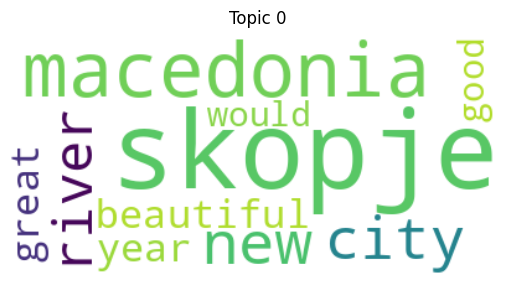

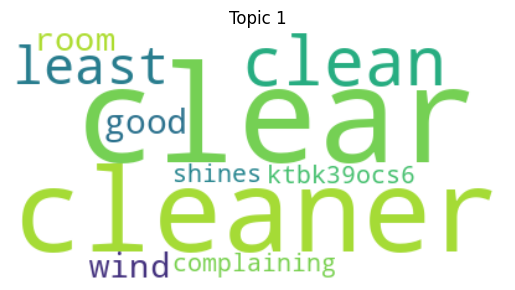

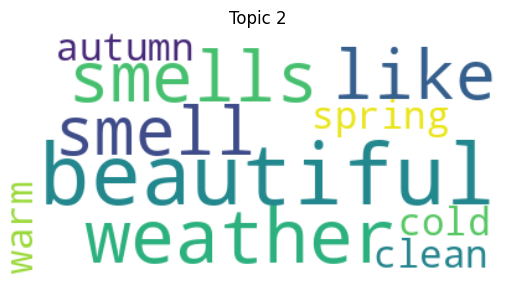

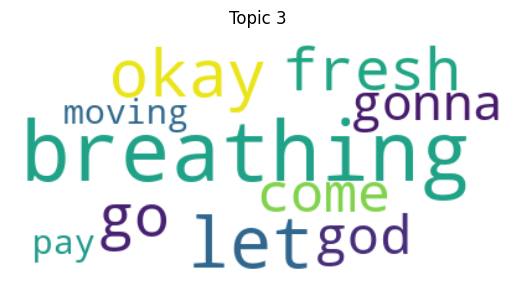

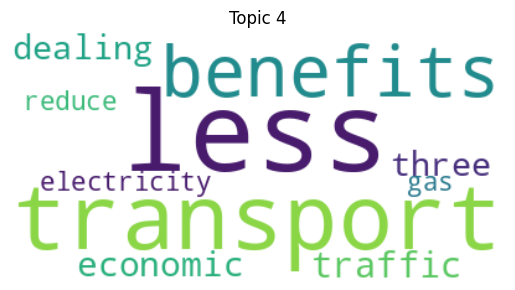

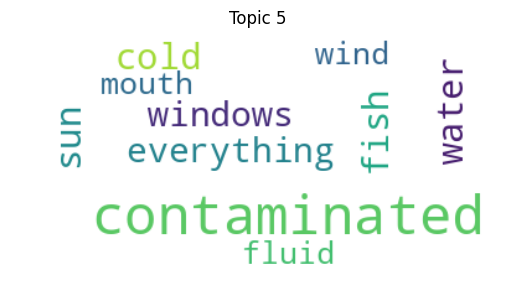

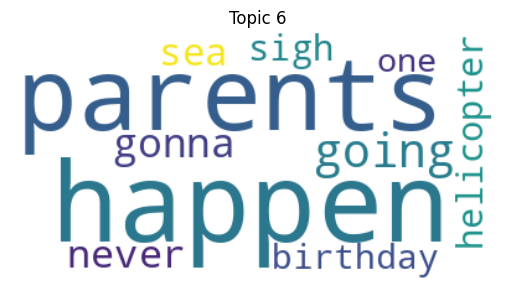

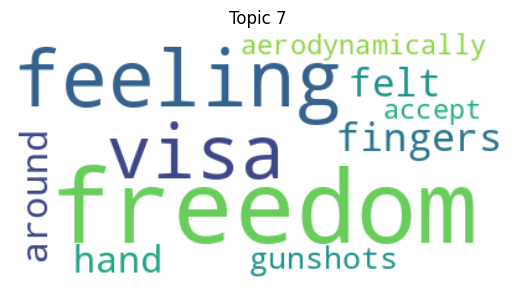

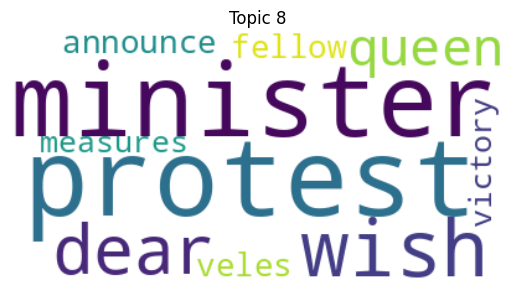

In [ ]:
for i in range(len(set(topics_positive))-1):
    create_wordcloud(topic_model_positive, topic=i)

In [ ]:
topics_over_time_positive = topic_model_positive.topics_over_time(
    positive_tweets_bertweet,
    timestamps_positive_bertweet,
    global_tuning=True,
    evolution_tuning=True,
    nr_bins=20
)
fig = topic_model_positive.visualize_topics_over_time(topics_over_time_positive)
fig.show()

20it [00:00, 53.59it/s]


In [ ]:
topic_model_positive.visualize_topics()

### ***Negative***

In [ ]:
# RoBERTa dataset
df_negative = df_roberta[df_roberta['RoBerta-sentiment'] == 'negative'].copy()
negative_tweets = df_negative['text_en'].tolist()

In [ ]:
len(negative_tweets)

3189

In [ ]:
timestamps_negative = pd.to_datetime(df_negative['created_at']).tolist()

In [ ]:
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
from sklearn.feature_extraction.text import CountVectorizer
from umap import UMAP
from hdbscan import HDBSCAN
from bertopic.vectorizers import ClassTfidfTransformer
from nltk.corpus import stopwords

# Stopwords
english_stopwords = stopwords.words('english')
custom_stopwords = ["http", "rt", "pollution", "polluted", "air", "pollute", "breathe"]
english_stopwords.extend(custom_stopwords)

vectorizer_model = CountVectorizer(stop_words=english_stopwords)
embedding_model = SentenceTransformer("all-MiniLM-L6-v2")
umap_model = UMAP(n_components=5)
hdbscan_model = HDBSCAN(min_cluster_size=15, min_samples=6, gen_min_span_tree=True, prediction_data=True)
ctfidf_model = ClassTfidfTransformer()

topic_model_negative = BERTopic(
    hdbscan_model=hdbscan_model,
    embedding_model=embedding_model,
    nr_topics=10,
    ctfidf_model=ctfidf_model,
    vectorizer_model=vectorizer_model,
    umap_model=umap_model,
    low_memory=True,
    calculate_probabilities=True,
    verbose=True,
    n_gram_range=(1, 5)
)

topics_negative, probs_negative = topic_model_negative.fit_transform(negative_tweets)
topic_model_negative.get_topic_info()

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

2026-01-11 17:13:09,083 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/100 [00:00<?, ?it/s]

2026-01-11 17:13:14,156 - BERTopic - Embedding - Completed ✓
2026-01-11 17:13:14,158 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2026-01-11 17:14:38,225 - BERTopic - Dimensionality - Completed ✓
2026-01-11 17:14:38,245 - BERTopic - Cluster - Start clustering the reduced embeddings
2026-01-11 17:14:40,301 - BERTopic - Cluster - Completed ✓
2026-01-11 17:14:40,308 - BERTopic - Representation - Extracting topics using c-TF-IDF for topic reduction.
2026-01-11 17:14:40,766 - BERTopic - Representation - Completed ✓
2026-01-11 17:14:40,769 - BERTopic - Topic reduction - Reducing number of topics
2026-01-11 17:14:40,810 - BERTopic - Representation - Fine-tuning topics using representation models.
2026-01-11 17:14:41,170 - BERTopic - Representation - Completed ✓
2026-01-11 17:14:41,175 - BERTopic - Topic reduction - Reduced number of topics from 29 to 10


,Topic,Count,Name,Representation,Representative_Docs
0,-1,1142,-1_contaminated_people_like_one,"[contaminated, people, like, one, burning, us,...",[And the sparrows know they're literally conta...
1,0,953,0_contaminated_dumps_burning_years,"[contaminated, dumps, burning, years, like, tr...",[The whole time someone's burning and burning ...
2,1,555,1_skopje_macedonia_city_contaminated,"[skopje, macedonia, city, contaminated, cities...",[This is what for Skopje is the wind when the ...
3,2,181,2_uh_breathing_like_smell,"[uh, breathing, like, smell, smells, dark, kno...","[It's been like this for years, this whole Aer..."
4,3,150,3_protest_party_protests_people,"[protest, party, protests, people, election, p...","[No one protests the air, the savagery, the pa..."
5,4,121,4_cancer_poison_cigarettes_breathing,"[cancer, poison, cigarettes, breathing, us, po...",[While lung cancer is engulfed into the breast...
6,5,35,5_vmro_sdsm_sds_power,"[vmro, sdsm, sds, power, dpmne, eight, years, ...","[In VMRO time, we breathed, now in the SDSM's ..."
7,6,18,6_bitola_rek_perrinski_ash,"[bitola, rek, perrinski, ash, gonna, plus, cit...","[Polluted, REK Bitola should be closed, It is ..."
8,7,17,7_allergies_autism_child_factor,"[allergies, autism, child, factor, worsening, ...","[) Today every child has allergies, and air po..."
9,8,17,8_bad_m3_pm_pm2,"[bad, m3, pm, pm2, sources, municipal, edg, 24...",[Two-thirds Main Sources Insult: PM2.5 and PM1...


In [ ]:
topic_model_negative.get_topic(0)

[('people', np.float64(0.03017772567845664)),
 ('traffic', np.float64(0.02318656188999454)),
 ('protest', np.float64(0.022044560387419462)),
 ('know', np.float64(0.01790157361891578)),
 ('one', np.float64(0.0176809460681431)),
 ('cars', np.float64(0.016542476225208595)),
 ('like', np.float64(0.016517004046981976)),
 ('would', np.float64(0.01630519051512417)),
 ('us', np.float64(0.016127232427390063)),
 ('years', np.float64(0.01561638187470869))]

In [ ]:
topic_model_negative.visualize_barchart()

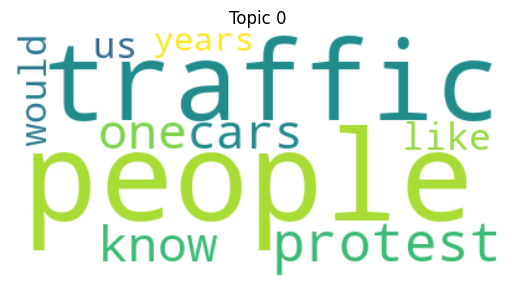

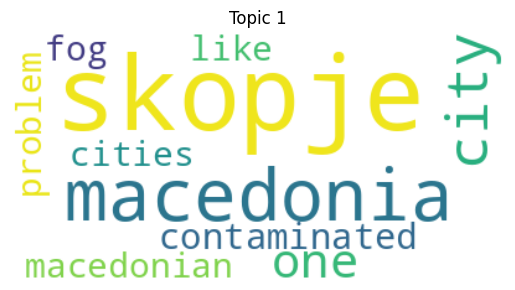

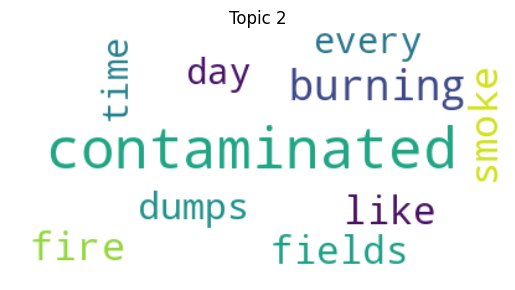

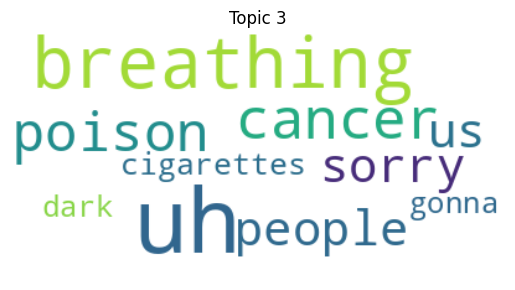

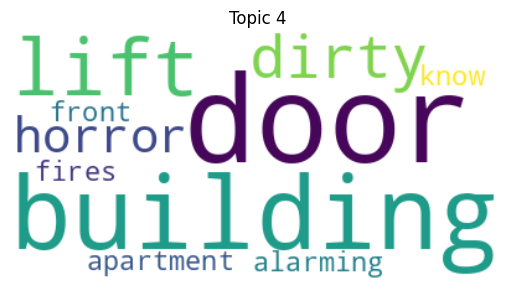

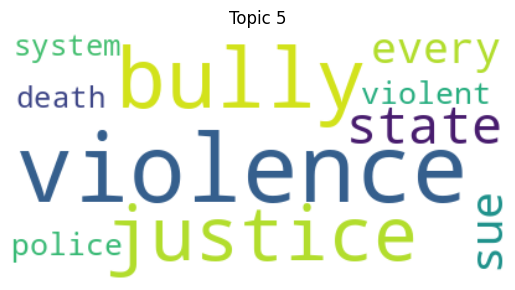

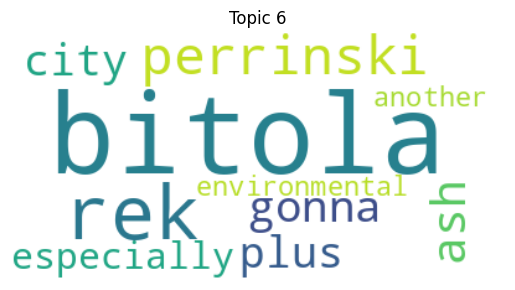

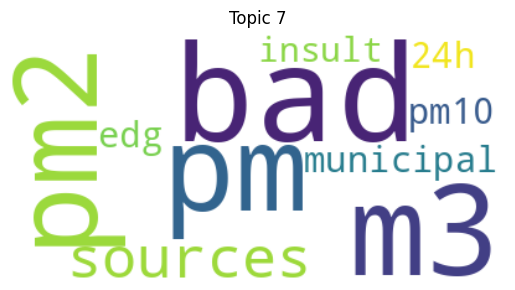

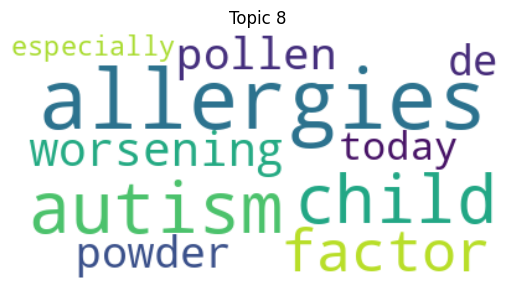

In [ ]:
for i in range(len(set(topics_negative))-1):
    create_wordcloud(topic_model_negative, topic=i)

In [ ]:
topics_over_time_negative = topic_model_negative.topics_over_time(
    negative_tweets,
    timestamps_negative,
    global_tuning=True,
    evolution_tuning=True,
    nr_bins=20
)
fig = topic_model_negative.visualize_topics_over_time(topics_over_time_negative)
fig.show()

20it [00:00, 21.92it/s]


In [ ]:
topic_model_negative.visualize_topics()

In [ ]:
# BERTweet dataset
df_negative_bertweet = df_bertweet[df_bertweet['BERTweet-sentiment'] == 'negative'].copy()
negative_tweets_bertweet = df_negative_bertweet['text_en'].tolist()

In [ ]:
len(negative_tweets_bertweet)

3190

In [ ]:
timestamps_negative_bertweet = pd.to_datetime(df_negative_bertweet['created_at']).tolist()

In [ ]:
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
from sklearn.feature_extraction.text import CountVectorizer
from umap import UMAP
from hdbscan import HDBSCAN
from bertopic.vectorizers import ClassTfidfTransformer
from nltk.corpus import stopwords

# Stopwords
english_stopwords = stopwords.words('english')
custom_stopwords = ["http", "rt", "pollution", "polluted", "air", "pollute", "breathe"]
english_stopwords.extend(custom_stopwords)

vectorizer_model = CountVectorizer(stop_words=english_stopwords)
embedding_model = SentenceTransformer("all-MiniLM-L6-v2")
umap_model = UMAP(n_components=5)
hdbscan_model = HDBSCAN(min_cluster_size=15, min_samples=6, gen_min_span_tree=True, prediction_data=True)
ctfidf_model = ClassTfidfTransformer()

topic_model_negative = BERTopic(
    hdbscan_model=hdbscan_model,
    embedding_model=embedding_model,
    nr_topics=10,
    ctfidf_model=ctfidf_model,
    vectorizer_model=vectorizer_model,
    umap_model=umap_model,
    low_memory=True,
    calculate_probabilities=True,
    verbose=True,
    n_gram_range=(1, 5)
)

topics_negative, probs_negative = topic_model_negative.fit_transform(negative_tweets_bertweet)
topic_model_negative.get_topic_info()

2025-12-16 14:59:07,707 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/100 [00:00<?, ?it/s]

2025-12-16 14:59:11,610 - BERTopic - Embedding - Completed ✓
2025-12-16 14:59:11,614 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-12-16 14:59:46,905 - BERTopic - Dimensionality - Completed ✓
2025-12-16 14:59:46,909 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-12-16 14:59:47,574 - BERTopic - Cluster - Completed ✓
2025-12-16 14:59:47,577 - BERTopic - Representation - Extracting topics using c-TF-IDF for topic reduction.
2025-12-16 14:59:47,735 - BERTopic - Representation - Completed ✓
2025-12-16 14:59:47,736 - BERTopic - Topic reduction - Reducing number of topics
2025-12-16 14:59:47,750 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-12-16 14:59:47,935 - BERTopic - Representation - Completed ✓
2025-12-16 14:59:47,941 - BERTopic - Topic reduction - Reduced number of topics from 32 to 10


,Topic,Count,Name,Representation,Representative_Docs
0,-1,1334,-1_contaminated_people_like_one,"[contaminated, people, like, one, burning, us,...",[To vote for Orcze means you're comfortable li...
1,0,712,0_contaminated_burning_fields_dumps,"[contaminated, burning, fields, dumps, fire, d...","[And when is it contaminated?, Now the air is ..."
2,1,516,1_skopje_macedonia_city_contaminated,"[skopje, macedonia, city, contaminated, macedo...","[After Skopje it was contaminated, This is why..."
3,2,347,2_protest_people_years_corruption,"[protest, people, years, corruption, cancer, s...","[A protest doesn't solve pollution, pal, if we..."
4,3,182,3_smells_breathing_like_smell,"[smells, breathing, like, smell, smoke, cigare...",[I think the air still smells like the smell o...
5,4,29,4_party_vote_politics_iq33,"[party, vote, politics, iq33, election, stupid...",[Imagine what a North American asshole you hav...
6,5,24,5_election_people_want_take,"[election, people, want, take, political, know...",[Now that his political people are breaking up...
7,6,16,6_bitola_rek_oil_oils,"[bitola, rek, oil, oils, ash, albania, right, ...","[How do you live in that Bitola polluted, come..."
8,7,15,7_allergies_autism_child_factor,"[allergies, autism, child, factor, worsening, ...","[) Today every child has allergies, and air po..."
9,8,15,8_lake_ohrid_doyran_youth,"[lake, ohrid, doyran, youth, collector, dise, ...","[As the collector waits for money, fecals cont..."


In [ ]:
topic_model_negative.get_topic(0)

[('contaminated', np.float64(0.06327240607436381)),
 ('burning', np.float64(0.030509521887700192)),
 ('fields', np.float64(0.02639242672866886)),
 ('dumps', np.float64(0.024387563925801256)),
 ('fire', np.float64(0.024115655864825728)),
 ('day', np.float64(0.02266644970940118)),
 ('smoke', np.float64(0.022527975204861186)),
 ('years', np.float64(0.022021323719067256)),
 ('every', np.float64(0.022008616569039442)),
 ('someone', np.float64(0.02110296434417632))]

In [ ]:
topic_model_negative.visualize_barchart()

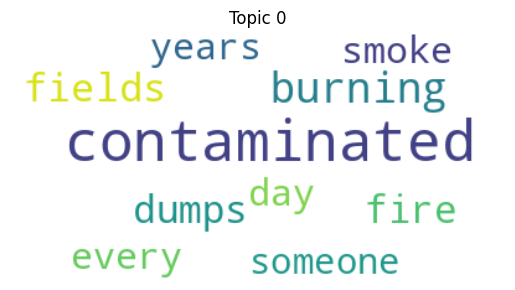

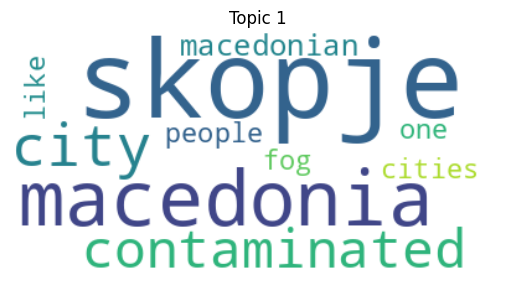

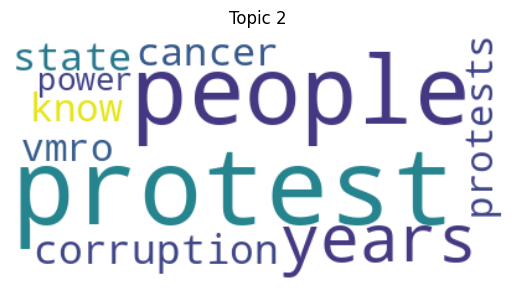

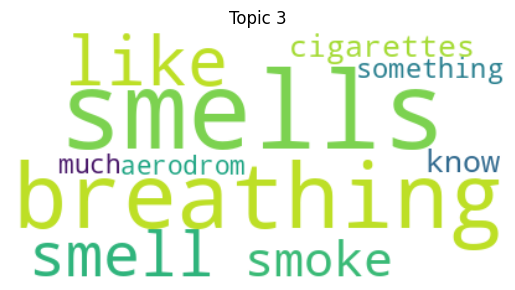

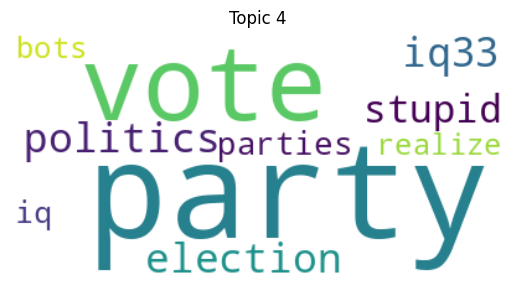

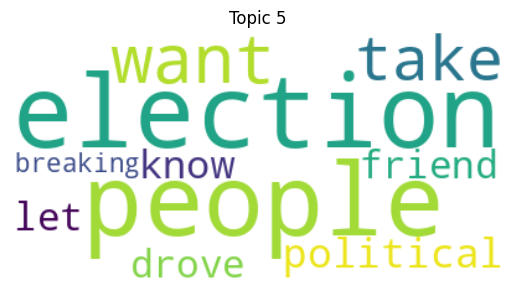

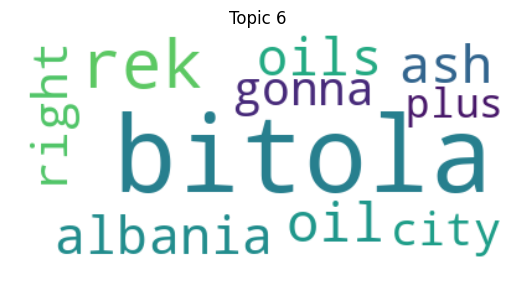

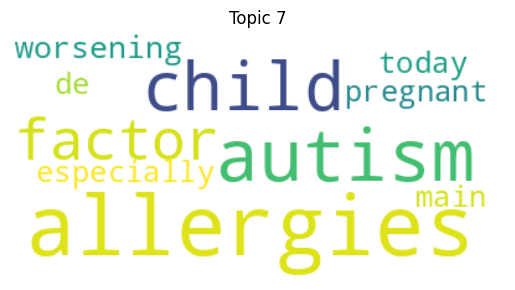

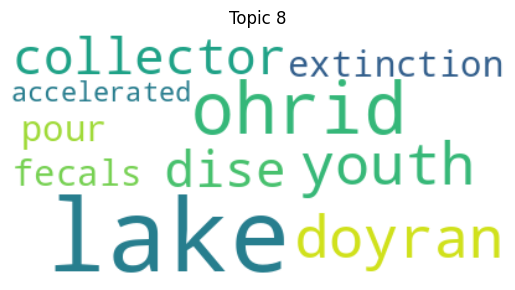

In [ ]:
for i in range(len(set(topics_negative))-1):
    create_wordcloud(topic_model_negative, topic=i)

In [ ]:
topics_over_time_negative = topic_model_negative.topics_over_time(
    negative_tweets_bertweet,
    timestamps_negative_bertweet,
    global_tuning=True,
    evolution_tuning=True,
    nr_bins=20
)
fig = topic_model_negative.visualize_topics_over_time(topics_over_time_negative)
fig.show()

20it [00:01, 12.22it/s]


In [ ]:
topic_model_negative.visualize_topics()

### ***Neutral***

In [ ]:
# RoBERTa dataset
df_neutral = df_roberta[df_roberta['RoBerta-sentiment'] == 'neutral'].copy()
neutral_tweets = df_neutral['text_en'].tolist()

In [ ]:
len(neutral_tweets)

2403

In [ ]:
timestamps_neutral = pd.to_datetime(df_neutral['created_at']).tolist()

In [ ]:
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
from sklearn.feature_extraction.text import CountVectorizer
from umap import UMAP
from hdbscan import HDBSCAN
from bertopic.vectorizers import ClassTfidfTransformer
from nltk.corpus import stopwords

# Stopwords
english_stopwords = stopwords.words('english')
custom_stopwords = ["http", "rt", "pollution", "polluted", "air", "pollute", "breathe"]
english_stopwords.extend(custom_stopwords)

vectorizer_model = CountVectorizer(stop_words=english_stopwords)
embedding_model = SentenceTransformer("all-MiniLM-L6-v2")
umap_model = UMAPumap_model = UMAP(
    n_neighbors=10,
    n_components=5,
    min_dist=0.0,
    metric="cosine"
)
hdbscan_model = HDBSCAN(min_cluster_size=30, min_samples=6, gen_min_span_tree=True, prediction_data=True)
ctfidf_model = ClassTfidfTransformer()

topic_model_neutral = BERTopic(
    hdbscan_model=hdbscan_model,
    embedding_model=embedding_model,
    nr_topics=10,
    ctfidf_model=ctfidf_model,
    vectorizer_model=vectorizer_model,
    umap_model=umap_model,
    low_memory=True,
    calculate_probabilities=True,
    verbose=True,
    n_gram_range=(1, 5)
)

topics_neutral, probs_positive = topic_model_neutral.fit_transform(neutral_tweets)
topic_model_neutral.get_topic_info()

2025-12-16 15:03:53,570 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/76 [00:00<?, ?it/s]

2025-12-16 15:03:55,838 - BERTopic - Embedding - Completed ✓
2025-12-16 15:03:55,843 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-12-16 15:04:18,005 - BERTopic - Dimensionality - Completed ✓
2025-12-16 15:04:18,008 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-12-16 15:04:18,337 - BERTopic - Cluster - Completed ✓
2025-12-16 15:04:18,340 - BERTopic - Representation - Extracting topics using c-TF-IDF for topic reduction.
2025-12-16 15:04:18,445 - BERTopic - Representation - Completed ✓
2025-12-16 15:04:18,448 - BERTopic - Topic reduction - Reducing number of topics
2025-12-16 15:04:18,459 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-12-16 15:04:18,546 - BERTopic - Representation - Completed ✓
2025-12-16 15:04:18,550 - BERTopic - Topic reduction - Reduced number of topics from 15 to 10


,Topic,Count,Name,Representation,Representative_Docs
0,-1,494,-1_wait_got_come_get,"[wait, got, come, get, know, like, going, clea...",[They came to the metropolis two years ago to ...
1,0,788,0_се_one_contaminated_public,"[се, one, contaminated, public, people, burnin...","[More than 2,000 years ago, people here heat o..."
2,1,331,1_skopje_macedonia_contaminated_macedonian,"[skopje, macedonia, contaminated, macedonian, ...","[After Skopje it was contaminated, The Air in ..."
3,2,325,2_smell_smells_clear_like,"[smell, smells, clear, like, let, clean, littl...","[Let him clear the air, and so can we., And it..."
4,3,148,3_contaminated_contamination_minister_lake,"[contaminated, contamination, minister, lake, ...","[It's not contaminated, It's not contaminated ..."
5,4,120,4_breathing_one_true_like,"[breathing, one, true, like, us, side, know, c...","[From that air of M are you still breathing?, ..."
6,5,77,5_humidity_snow_temperature_rain,"[humidity, snow, temperature, rain, climate, m...","[The weather forecast for Debrca Wednesday, Ju..."
7,6,48,6_m3_pm10_particles_measured,"[m3, pm10, particles, measured, 50, edg, allow...",[PM10 particles in the air measured at 9h. The...
8,7,36,7_sun_half_peeping_saa,"[sun, half, peeping, saa, silelov, posted, poo...","[It's more polluted by the SEC, otherwise, it'..."
9,8,36,8_protest_protests_citizens_institutions,"[protest, protests, citizens, institutions, is...",[I was a little short on the first air protest...


In [ ]:
topic_model_neutral.get_topic(0)

[('се', np.float64(0.023324128490283442)),
 ('one', np.float64(0.017603495587391892)),
 ('contaminated', np.float64(0.01645445001134552)),
 ('public', np.float64(0.014216058725277468)),
 ('people', np.float64(0.014175377890028703)),
 ('burning', np.float64(0.013340265215645929)),
 ('less', np.float64(0.013065235003858287)),
 ('aero', np.float64(0.0127453064726174)),
 ('cars', np.float64(0.012670288142049494)),
 ('smoke', np.float64(0.012525560911140106))]

In [ ]:
topic_model_neutral.visualize_barchart()

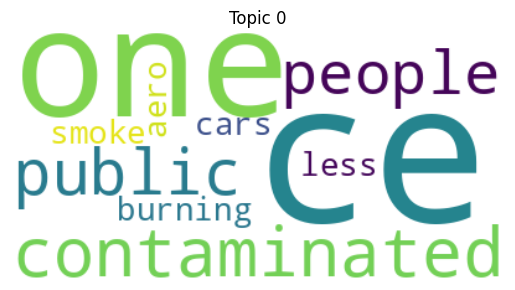

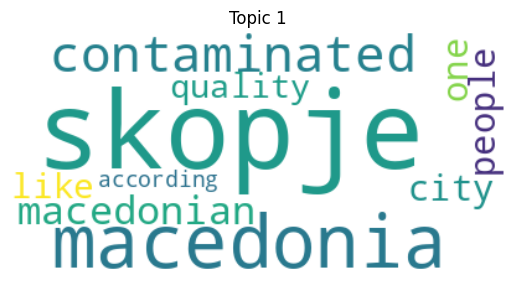

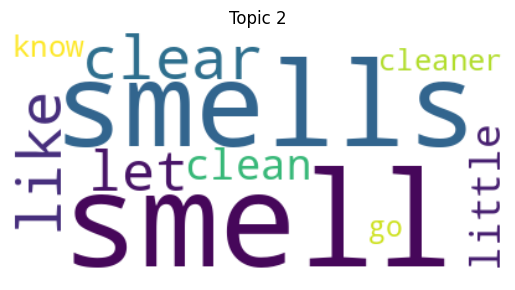

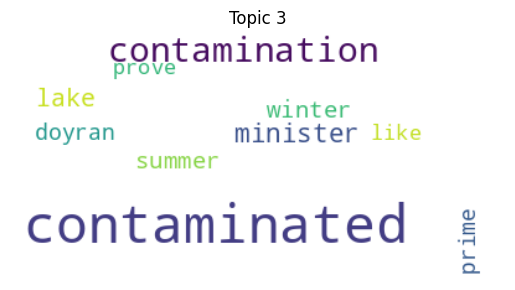

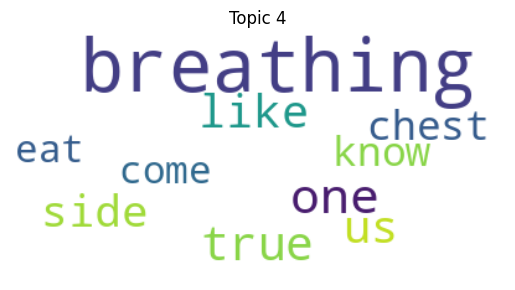

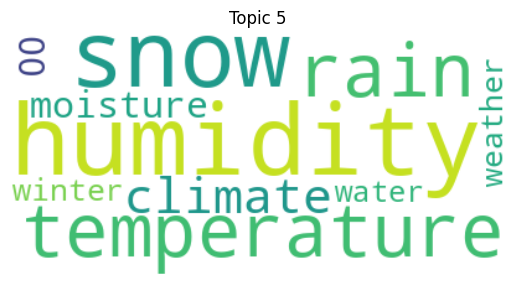

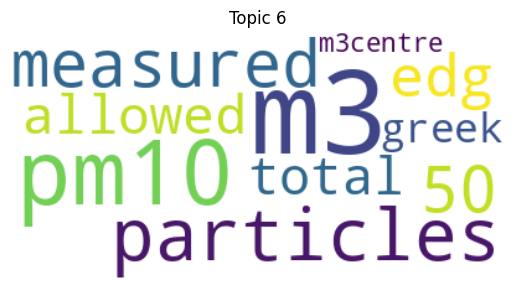

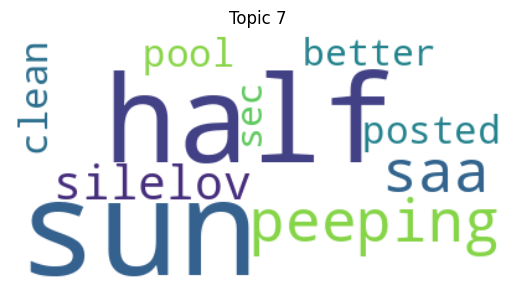

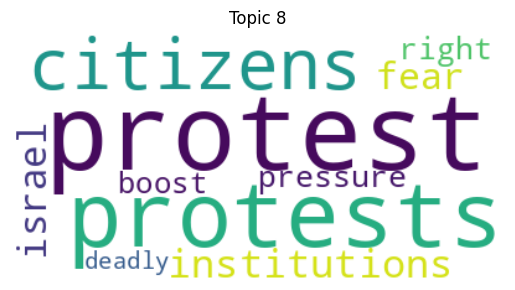

In [ ]:
for i in range(len(set(topics_neutral))-1):
    create_wordcloud(topic_model_neutral, topic=i)

In [ ]:
topics_over_time_neutral = topic_model_neutral.topics_over_time(
    neutral_tweets,
    timestamps_neutral,
    global_tuning=True,
    evolution_tuning=True,
    nr_bins=20
)
fig = topic_model_neutral.visualize_topics_over_time(topics_over_time_neutral)
fig.show()

20it [00:00, 24.84it/s]


In [ ]:
topic_model_neutral.visualize_topics()

In [ ]:
# BERTweet dataset
df_neutral_bertweet = df_bertweet[df_bertweet['BERTweet-sentiment'] == 'neutral'].copy()
neutral_tweets_bertweet = df_neutral_bertweet['text_en'].tolist()

In [ ]:
len(neutral_tweets_bertweet)

2321

In [ ]:
timestamps_neutral_bertweet = pd.to_datetime(df_neutral_bertweet['created_at']).tolist()

In [ ]:
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
from sklearn.feature_extraction.text import CountVectorizer
from umap import UMAP
from hdbscan import HDBSCAN
from bertopic.vectorizers import ClassTfidfTransformer
from nltk.corpus import stopwords

# Stopwords
english_stopwords = stopwords.words('english')
custom_stopwords = ["http", "rt", "pollution", "polluted", "air", "pollute", "breathe"]
english_stopwords.extend(custom_stopwords)

vectorizer_model = CountVectorizer(
    stop_words=english_stopwords,
    ngram_range=(1, 2)
)
embedding_model = SentenceTransformer("all-MiniLM-L6-v2")
umap_model = UMAP(
    n_neighbors=10,
    n_components=5,
    min_dist=0.0,
    metric="cosine"
)
hdbscan_model = HDBSCAN(
    min_cluster_size=25,
    min_samples=5,
    metric='euclidean',
    prediction_data=True
)
ctfidf_model = ClassTfidfTransformer()

topic_model_neutral = BERTopic(
    hdbscan_model=hdbscan_model,
    embedding_model=embedding_model,
    nr_topics=10,
    ctfidf_model=ctfidf_model,
    vectorizer_model=vectorizer_model,
    umap_model=umap_model,
    low_memory=True,
    calculate_probabilities=True,
    verbose=True,
    n_gram_range=(1, 5)
)

topics_neutral, probs_neutral = topic_model_neutral.fit_transform(neutral_tweets_bertweet)
topic_model_neutral.get_topic_info()

2025-12-16 15:08:16,328 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/73 [00:00<?, ?it/s]

2025-12-16 15:08:18,177 - BERTopic - Embedding - Completed ✓
2025-12-16 15:08:18,178 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-12-16 15:08:40,856 - BERTopic - Dimensionality - Completed ✓
2025-12-16 15:08:40,858 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-12-16 15:08:41,427 - BERTopic - Cluster - Completed ✓
2025-12-16 15:08:41,431 - BERTopic - Representation - Extracting topics using c-TF-IDF for topic reduction.
2025-12-16 15:08:41,881 - BERTopic - Representation - Completed ✓
2025-12-16 15:08:41,889 - BERTopic - Topic reduction - Reducing number of topics
2025-12-16 15:08:41,907 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-12-16 15:08:42,217 - BERTopic - Representation - Completed ✓
2025-12-16 15:08:42,221 - BERTopic - Topic reduction - Reduced number of topics from 19 to 10


,Topic,Count,Name,Representation,Representative_Docs
0,-1,533,-1_uh_uh uh_wait_wait wait,"[uh, uh uh, wait, wait wait, get, let, know, g...","[They could have done it two years ago, and yo..."
1,0,766,0_contaminated_like_one_people,"[contaminated, like, one, people, burning, get...","[It's not contaminated, it just looks like it...."
2,1,433,1_breathing_like_smell_clean,"[breathing, like, smell, clean, smells, clear,...","[I'm like that because of the air..., Wednesda..."
3,2,301,2_skopje_macedonia_city_one,"[skopje, macedonia, city, one, like, quality, ...","[Everything is in the air in Skopje., The Air ..."
4,3,74,3_aerodrom_vmro_politics_dpmne,"[aerodrom, vmro, politics, dpmne, aero, power,...",[The DPMNE came to power in the municipalities...
5,4,63,4_m3_pm10_particles_edg,"[m3, pm10, particles, edg, pm10 particles, mea...",[PM10 particles measured at 7h. A allowed tota...
6,5,39,5_се_се се_со_со со,"[се, се се, со, со со, сони, boris, boris traj...","[Gorjan Jovanovski, an adviser from ZHG today,..."
7,6,39,6_true_chest_love_know,"[true, chest, love, know, true true, know know...","[""It will become a room stifling, it will weig..."
8,7,39,7_trubarevo_metals_fire_fire trubarevo,"[trubarevo, metals, fire, fire trubarevo, heav...","[""It's 1,500 tonnes of lead imported from Ital..."
9,8,34,8_protests_protest_zaev_israel,"[protests, protest, zaev, israel, one, institu...",[I was a little short on the first air protest...


In [ ]:
topic_model_neutral.get_topic(0)

[('contaminated', np.float64(0.026405143637864073)),
 ('like', np.float64(0.011275909738653025)),
 ('one', np.float64(0.010794236804873129)),
 ('people', np.float64(0.009785746486606088)),
 ('burning', np.float64(0.009446105146570564)),
 ('get', np.float64(0.008651364343145248)),
 ('time', np.float64(0.0083903236058219)),
 ('cars', np.float64(0.008265342003249245)),
 ('problem', np.float64(0.008087823794462282)),
 ('contamination', np.float64(0.008087823794462282))]

In [ ]:
topic_model_neutral.visualize_barchart()

In [ ]:
topics_over_time_neutral = topic_model_neutral.topics_over_time(
    neutral_tweets_bertweet,
    timestamps_neutral_bertweet,
    global_tuning=True,
    evolution_tuning=True,
    nr_bins=20
)
fig = topic_model_neutral.visualize_topics_over_time(topics_over_time_neutral)
fig.show()

20it [00:04,  4.78it/s]


In [ ]:
topic_model_neutral.visualize_topics()

##***Comparing RoBERTa and BERTweet***

In [ ]:
df_mkd = pd.read_csv("/content/drive/MyDrive/PraksaMANU/Tweets Macedonia Merged/Tweets_Macedonia_sept2023_sept2025.csv")

In [ ]:
df_roberta = pd.read_csv("/content/drive/MyDrive/PraksaMANU/Tweets Macedonia Merged/Sentiment analyses/Tweets_Macedonia_with_RoBERTa_sentiment.csv")
df_bertweet = pd.read_csv("/content/drive/MyDrive/PraksaMANU/Tweets Macedonia Merged/Sentiment analyses/Tweets_Macedonia_with_BERTweet_sentiment.csv")

In [ ]:
import pandas as pd
merged_df = pd.merge(df_roberta, df_bertweet, on=['id', 'text_en', 'created_at'], how='inner')
merged_df

,id,text_en,created_at,RoBerta-sentiment,BERTweet-sentiment
0,NaN,"Come on, there's a little more unnecessary con...",2023-09-13 19:05:20,negative,negative
1,NaN,I'm not satisfied with this: environmental pol...,2023-09-12 21:10:05,negative,negative
2,NaN,We'll breathe like that.,2023-09-12 08:01:52,neutral,neutral
3,NaN,I don't know what's in those sick minds. I jus...,2023-09-11 22:04:20,negative,negative
4,NaN,I'm not satisfied with this: environmental pol...,2023-09-11 16:33:49,negative,negative
...,...,...,...,...,...
6082,1.990000e+18,November pollution in Tetovo: PM10 and PM25 pa...,2025-11-20 13:21:18,negative,neutral
6083,1.990000e+18,Abe and Norway from Finland imports the garbag...,2025-11-20 11:23:58,negative,negative
6084,1.990000e+18,So it's all our priority if we breathe fresh a...,2025-11-20 09:54:18,negative,negative
6085,1.990000e+18,So maybe he'll raise his awareness of this peo...,2025-11-20 09:37:26,neutral,neutral


In [ ]:
# RoBerta-sentiment ≠ BERTweet-sentiment
df_diff = merged_df[merged_df["RoBerta-sentiment"] != merged_df["BERTweet-sentiment"]][[
    "id",
    "text_en",
    "created_at",
    "RoBerta-sentiment",
    "BERTweet-sentiment"
]].copy()
df_diff.reset_index(drop=True)

,id,text_en,created_at,RoBerta-sentiment,BERTweet-sentiment
0,NaN,"Mines, hydro power plants, pollution for every...",2023-09-15 13:33:59,negative,neutral
1,NaN,We're mainly talking about pollution in the wi...,2023-09-24 11:36:27,neutral,negative
2,NaN,"And for the REK, at least all of Macedonia ben...",2023-09-23 17:57:48,neutral,negative
3,NaN,We give wind and fog (in this case water) and ...,2023-09-22 23:09:38,neutral,negative
4,NaN,"In Japan people wear masks when they're sick, ...",2023-09-21 08:56:48,neutral,negative
...,...,...,...,...,...
1036,1.990000e+18,You didn't seem to notice that there was pollu...,2025-11-24 18:37:27,neutral,negative
1037,1.990000e+18,It's sea-collar and pollution in M.K.,2025-11-22 16:21:08,negative,neutral
1038,1.990000e+18,European Commission sues Bulgaria over air pol...,2025-11-21 13:33:59,neutral,negative
1039,1.990000e+18,November pollution in Tetovo: PM10 and PM25 pa...,2025-11-20 13:21:18,negative,neutral


## ***Year analysis***

In [ ]:
df_sentiment = pd.read_csv("/content/drive/MyDrive/PraksaMANU/Tweets Macedonia Merged/Sentiment analyses/Tweets_Macedonia_with_BERTweet_sentiment.csv")

In [ ]:
df_sentiment["created_at"] = pd.to_datetime(
    df_sentiment["created_at"], errors="coerce"
)

In [ ]:
df_sentiment["week"] = df_sentiment["created_at"].dt.isocalendar().week

In [ ]:
def get_season(date):
    if pd.isna(date):
        return None
    if pd.Timestamp("2023-10-01") <= date < pd.Timestamp("2024-10-01"):
        return "2023/2024"
    elif pd.Timestamp("2024-10-01") <= date < pd.Timestamp("2025-10-01"):
        return "2024/2025"
    else:
        return None

df_sentiment["season"] = df_sentiment["created_at"].apply(get_season)

In [ ]:
df_sentiment = df_sentiment.dropna(subset=["season"])

# weekly counts по сезона и sentiment
df_season_weekly = (
    df_sentiment
    .groupby(["season", "week", "BERTweet-sentiment"])
    .size()
    .reset_index(name="tweet_count")
)

In [ ]:
df_seasonal_pivot = (
    df_season_weekly
    .pivot_table(
        index=["season", "week"],
        columns="BERTweet-sentiment",
        values="tweet_count",
        fill_value=0
    )
    .reset_index()
)

df_seasonal_pivot.head()

BERTweet-sentiment,season,week,negative,neutral,positive
0,2023/2024,1,110.0,77.0,24.0
1,2023/2024,2,30.0,19.0,5.0
2,2023/2024,3,30.0,21.0,6.0
3,2023/2024,4,21.0,19.0,9.0
4,2023/2024,5,31.0,14.0,1.0


## ***Kruskal–Wallis - Negative sentiment over the years***

In [ ]:
from scipy.stats import kruskal

neg_2324 = df_seasonal_pivot[
    df_seasonal_pivot["season"] == "2023/2024"
]["negative"]

neg_2425 = df_seasonal_pivot[
    df_seasonal_pivot["season"] == "2024/2025"
]["negative"]

In [ ]:
stat, p = kruskal(neg_2324, neg_2425)

print(f"Statistic = {stat:.3f}")
print(f"p-value = {p:.4f}")

if p < 0.05:
    print("Statistically significant difference in NEGATIVE tweets between seasons.")
else:
    print("No statistically significant difference in NEGATIVE tweets between seasons.")

Statistic = 8.836
p-value = 0.0030
Statistically significant difference in NEGATIVE tweets between seasons.


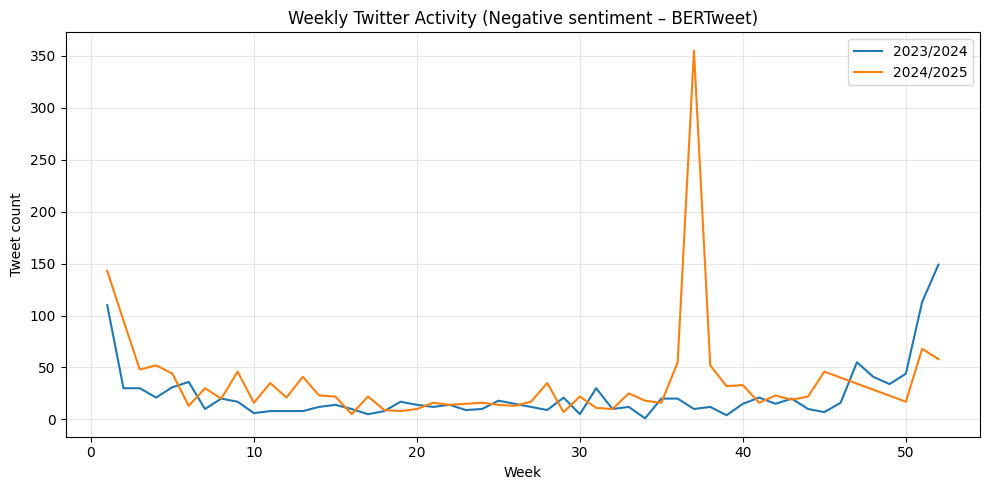

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))

df_2324 = df_seasonal_pivot[df_seasonal_pivot["season"] == "2023/2024"]
df_2425 = df_seasonal_pivot[df_seasonal_pivot["season"] == "2024/2025"]

plt.plot(df_2324["week"], df_2324["negative"], label="2023/2024")
plt.plot(df_2425["week"], df_2425["negative"], label="2024/2025")

plt.title("Weekly Twitter Activity (Negative sentiment – BERTweet)")
plt.xlabel("Week")
plt.ylabel("Tweet count")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


## ***Kruskal–Wallis - Positive sentiment over the years***

In [ ]:
from scipy.stats import kruskal

neg_2324 = df_seasonal_pivot[
    df_seasonal_pivot["season"] == "2023/2024"
]["positive"]

neg_2425 = df_seasonal_pivot[
    df_seasonal_pivot["season"] == "2024/2025"
]["positive"]

In [ ]:
stat, p = kruskal(neg_2324, neg_2425)

print(f"Statistic = {stat:.3f}")
print(f"p-value = {p:.4f}")

if p < 0.05:
    print("Statistically significant difference in POSITIVE tweets between seasons.")
else:
    print("No statistically significant difference in POSITIVE tweets between seasons.")

Statistic = 3.940
p-value = 0.0472
Statistically significant difference in POSITIVE tweets between seasons.


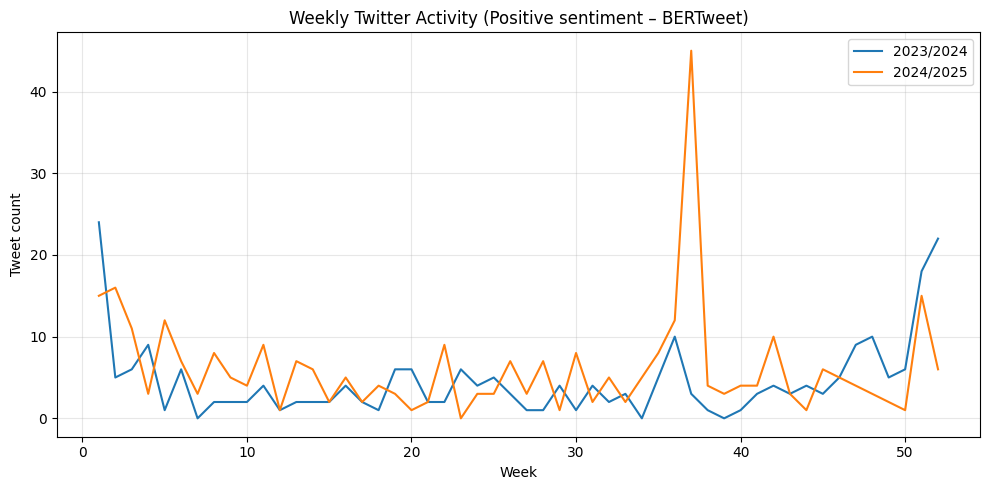

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))

df_2324 = df_seasonal_pivot[df_seasonal_pivot["season"] == "2023/2024"]
df_2425 = df_seasonal_pivot[df_seasonal_pivot["season"] == "2024/2025"]

plt.plot(df_2324["week"], df_2324["positive"], label="2023/2024")
plt.plot(df_2425["week"], df_2425["positive"], label="2024/2025")

plt.title("Weekly Twitter Activity (Positive sentiment – BERTweet)")
plt.xlabel("Week")
plt.ylabel("Tweet count")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

## ***Kruskal–Wallis - Neutral sentiment over the years***

In [ ]:
from scipy.stats import kruskal

neg_2324 = df_seasonal_pivot[
    df_seasonal_pivot["season"] == "2023/2024"
]["neutral"]

neg_2425 = df_seasonal_pivot[
    df_seasonal_pivot["season"] == "2024/2025"
]["neutral"]

In [ ]:
stat, p = kruskal(neg_2324, neg_2425)

print(f"Statistic = {stat:.3f}")
print(f"p-value = {p:.4f}")

if p < 0.05:
    print("Statistically significant difference in NEUTRAL tweets between seasons.")
else:
    print("No statistically significant difference in NEUTRAL tweets between seasons.")

Statistic = 5.421
p-value = 0.0199
Statistically significant difference in NEUTRAL tweets between seasons.


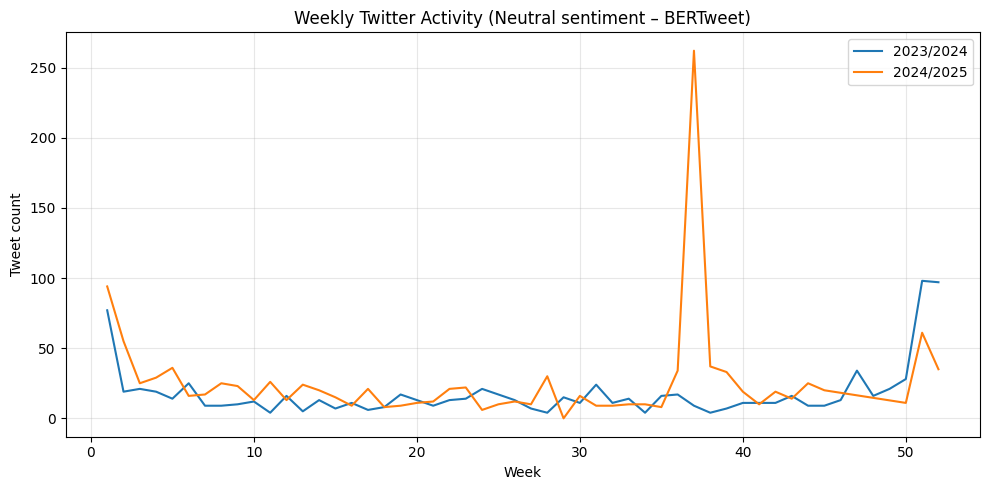

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))

df_2324 = df_seasonal_pivot[df_seasonal_pivot["season"] == "2023/2024"]
df_2425 = df_seasonal_pivot[df_seasonal_pivot["season"] == "2024/2025"]

plt.plot(df_2324["week"], df_2324["neutral"], label="2023/2024")
plt.plot(df_2425["week"], df_2425["neutral"], label="2024/2025")

plt.title("Weekly Twitter Activity (Neutral sentiment – BERTweet)")
plt.xlabel("Week")
plt.ylabel("Tweet count")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

##***Topics for 2023/24 and 2024/25***

In [ ]:
# stopwords i vectorizer(gi pretvora tvitovite vo bag-of-words matrica)
english_stopwords = stopwords.words('english')
custom_stopwords = ["http", "rt", "pollution", "polluted", "air", "pollute", "breathe"]
english_stopwords.extend(custom_stopwords)

vectorizer_model = CountVectorizer(stop_words=english_stopwords)

vectorized_data = vectorizer_model.fit_transform(lemmatized_tweet_list)
text_without_stopwords = vectorizer_model.inverse_transform(vectorized_data)

topics_tweet_list = [" ".join(words) for words in text_without_stopwords]

In [ ]:
df_topics = pd.DataFrame({
    "text": topics_tweet_list,
    "created_at": timestamps_clean
})

df_topics["created_at"] = pd.to_datetime(df_topics["created_at"], errors="coerce")

In [ ]:
def get_season(date):
    if pd.isna(date):
        return None
    if date >= pd.Timestamp("2023-10-01") and date < pd.Timestamp("2024-10-01"):
        return "2023/2024"
    elif date >= pd.Timestamp("2024-10-01") and date < pd.Timestamp("2025-10-01"):
        return "2024/2025"
    else:
        return None

df_topics["season"] = df_topics["created_at"].apply(get_season)

***2023/24***

In [ ]:
df_topics_2324 = df_topics[df_topics["season"] == "2023/2024"].reset_index(drop=True)
tweets_2324 = df_topics_2324["text"].astype(str).tolist()
print("Tweets for 2023/24:", len(tweets_2324))

Tweets for 2023/24: 2355


In [ ]:
embedding_model = SentenceTransformer("all-MiniLM-L6-v2")

topic_model_2324 = BERTopic(
    embedding_model=embedding_model,
    language="multilingual",
    min_topic_size=20,
    nr_topics=10,
    calculate_probabilities=True,
    verbose=True
)

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

In [ ]:
topics_2324, probs_2324 = topic_model_2324.fit_transform(tweets_2324)

2026-01-17 15:08:26,771 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/74 [00:00<?, ?it/s]

2026-01-17 15:08:28,934 - BERTopic - Embedding - Completed ✓
2026-01-17 15:08:28,935 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2026-01-17 15:08:50,612 - BERTopic - Dimensionality - Completed ✓
2026-01-17 15:08:50,613 - BERTopic - Cluster - Start clustering the reduced embeddings
2026-01-17 15:08:50,806 - BERTopic - Cluster - Completed ✓
2026-01-17 15:08:50,807 - BERTopic - Representation - Extracting topics using c-TF-IDF for topic reduction.
2026-01-17 15:08:50,855 - BERTopic - Representation - Completed ✓
2026-01-17 15:08:50,856 - BERTopic - Topic reduction - Reducing number of topics
2026-01-17 15:08:50,868 - BERTopic - Representation - Fine-tuning topics using representation models.
2026-01-17 15:08:50,903 - BERTopic - Representation - Completed ✓
2026-01-17 15:08:50,905 - BERTopic - Topic reduction - Reduced number of topics from 19 to 10


In [ ]:
topic_model_2324.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,1161,-1_go_one_get_people,"[go, one, get, people, like, contaminate, know...",[come go one think kid talk lot plus live back...
1,0,278,0_skopje_macedonia_city_macedonian,"[skopje, macedonia, city, macedonian, contamin...","[skopje, skopje, skopje]"
2,1,276,1_contaminate_contamination_water_food,"[contaminate, contamination, water, food, aero...","[contaminate, contaminate, contaminate]"
3,2,166,2_fire_burn_smoke_dump,"[fire, burn, smoke, dump, field, horn, burning...",[know burn burning dump field someone season w...
4,3,134,3_clear_clean_let_something,"[clear, clean, let, something, go, like, know,...","[let clear, clear clean, clear clean]"
5,4,122,4_protest_minister_journalist_corruption,"[protest, minister, journalist, corruption, on...",[environmental protest power anti push ngo men...
6,5,89,5_humidity_dry_heat_climate,"[humidity, dry, heat, climate, moisture, warm,...","[humidity, water heat otherwise problem relati..."
7,6,50,6_smell_like_taste_spring,"[smell, like, taste, spring, color, know, perf...","[smell change, smell, smell]"
8,7,49,7_particle_pm10_m3_measure,"[particle, pm10, m3, measure, edg, concentrati...",[macedonia dust pm10 particle high station sho...
9,8,30,8_traffic_city_park_parking,"[traffic, city, park, parking, urban, less, tr...",[huge work create waste summer traffic problem...


In [ ]:
topic_model_2324.visualize_barchart()

In [ ]:
df_topics_2324['topic'] = topics_2324

df_topics_2324['date'] = df_topics_2324['created_at'].dt.date
tweets_per_topic_day = df_topics_2324.groupby(['date', 'topic']).size().reset_index(name='tweet_count')

In [ ]:
import plotly.express as px

fig = px.line(tweets_per_topic_day, x='date', y='tweet_count', color='topic',
              title='Frequency of Tweets per Topic Over Time (2023/24)',
              labels={'date': 'Date', 'tweet_count': 'Number of Tweets', 'topic': 'Topic'},
              markers=True)

fig.update_layout(xaxis_title='Date',
                  yaxis_title='Number of Tweets',
                  xaxis=dict(tickangle=-45),
                  template='plotly_white')

fig.show()

In [ ]:
fig = px.line(tweets_per_topic_day, x='date', y='tweet_count', facet_col='topic',
              facet_col_wrap=2,
              title='Tweet Frequency per Topic Over Time (Faceted)',
              labels={'date': 'Date', 'tweet_count': 'Number of Tweets', 'topic': 'Topic'},
              markers=True)

fig.update_layout(template='plotly_white')
fig.show()


***2024/25***

In [ ]:
df_topics_2425 = df_topics[df_topics["season"] == "2024/2025"].reset_index(drop=True)
tweets_2425 = df_topics_2425["text"].astype(str).tolist()
print("Tweets for 2024/25:", len(tweets_2425))

Tweets for 2024/25: 3302


In [ ]:
embedding_model = SentenceTransformer("all-MiniLM-L6-v2")

topic_model_2425 = BERTopic(
    embedding_model=embedding_model,
    language="multilingual",
    min_topic_size=20,
    nr_topics=10,
    calculate_probabilities=True,
    verbose=True
)

In [ ]:
topics_2425, probs_2425 = topic_model_2425.fit_transform(tweets_2425)

2026-01-17 15:27:33,962 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/104 [00:00<?, ?it/s]

2026-01-17 15:27:35,687 - BERTopic - Embedding - Completed ✓
2026-01-17 15:27:35,688 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2026-01-17 15:27:54,356 - BERTopic - Dimensionality - Completed ✓
2026-01-17 15:27:54,357 - BERTopic - Cluster - Start clustering the reduced embeddings
2026-01-17 15:27:54,666 - BERTopic - Cluster - Completed ✓
2026-01-17 15:27:54,667 - BERTopic - Representation - Extracting topics using c-TF-IDF for topic reduction.
2026-01-17 15:27:54,728 - BERTopic - Representation - Completed ✓
2026-01-17 15:27:54,729 - BERTopic - Topic reduction - Reducing number of topics
2026-01-17 15:27:54,738 - BERTopic - Representation - Fine-tuning topics using representation models.
2026-01-17 15:27:54,778 - BERTopic - Representation - Completed ✓
2026-01-17 15:27:54,781 - BERTopic - Topic reduction - Reduced number of topics from 24 to 10


In [ ]:
topic_model_2425.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,1628,-1_skopje_people_burn_year,"[skopje, people, burn, year, one, like, fire, ...",[come health like know corruption mob look cou...
1,0,474,0_protest_people_car_traffic,"[protest, people, car, traffic, go, one, probl...","[protest contaminate need fact, like know prot..."
2,1,284,1_skopje_macedonia_city_macedonian,"[skopje, macedonia, city, macedonian, like, co...","[see skopje, macedonia, skopje]"
3,2,281,2_contaminate_poison_contamination_lake,"[contaminate, poison, contamination, lake, wat...","[contaminate, contaminate, contaminate]"
4,3,277,3_clean_like_fog_go,"[clean, like, fog, go, winter, feel, rain, day...","[go let feel, clean, clean]"
5,4,167,4_smell_smoke_burn_dump,"[smell, smoke, burn, dump, field, fire, horn, ...",[like year burn dump field time contaminate sm...
6,5,86,5_pm10_pm2_minister_pm,"[pm10, pm2, minister, pm, prime, m3, main, mun...",[two source main city third pm2 municipal bad ...
7,6,48,6_cancer_patient_lung_oncology,"[cancer, patient, lung, oncology, disease, new...","[year per lung cancer new patient gap, burn ca..."
8,7,33,7_okay_95_elon_sign,"[okay, 95, elon, sign, helpful, figure, happy,...","[okay, okay explain, helpful 95]"
9,8,24,8_clear_let_bit_bring,"[clear, let, bit, bring, aaaaaa, deer, danella...","[clear, clear, clear]"


In [ ]:
topic_model_2425.visualize_barchart()

In [ ]:
df_topics_2425['topic'] = topics_2425

df_topics_2425['date'] = df_topics_2425['created_at'].dt.date
tweets_per_topic_day = df_topics_2425.groupby(['date', 'topic']).size().reset_index(name='tweet_count')

In [ ]:
import plotly.express as px

fig = px.line(tweets_per_topic_day, x='date', y='tweet_count', color='topic',
              title='Frequency of Tweets per Topic Over Time (2024/25)',
              labels={'date': 'Date', 'tweet_count': 'Number of Tweets', 'topic': 'Topic'},
              markers=True)

fig.update_layout(xaxis_title='Date',
                  yaxis_title='Number of Tweets',
                  xaxis=dict(tickangle=-45),
                  template='plotly_white')

fig.show()

In [ ]:
fig = px.line(tweets_per_topic_day, x='date', y='tweet_count', facet_col='topic',
              facet_col_wrap=2,
              title='Tweet Frequency per Topic Over Time (Faceted)',
              labels={'date': 'Date', 'tweet_count': 'Number of Tweets', 'topic': 'Topic'},
              markers=True)

fig.update_layout(template='plotly_white')
fig.show()

##***Heating vs Non-heating seasons***

In [ ]:
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from umap import UMAP
from hdbscan import HDBSCAN
import pandas as pd

# Embedding и Vectorizer
embedding_model = SentenceTransformer("all-mpnet-base-v2")
vectorizer_model = TfidfVectorizer(
    stop_words=["don", "the", "in","it", "to", "of", "so", "and", "you", "we", "his", "on", "is", "us", "re", "not", "from", "that", "this", "with"],
    ngram_range=(1,2)
)

In [ ]:
# Heating / Non-heating
def season_label(date):
    month = date.month
    if month in [11, 12, 1, 2]:
        return "Heating"
    else:
        return "Non-heating"

df_topics_mkd["created_at"] = pd.to_datetime(
    df_air_pollution_mkd.loc[df_topics_mkd.index, "created_at"], errors="coerce"
)
df_topics_mkd = df_topics_mkd.dropna(subset=["created_at"])
df_topics_mkd["season"] = df_topics_mkd["created_at"].apply(season_label)

dfs = {
    "Heating": df_topics_mkd[df_topics_mkd["season"] == "Heating"]["text_en"].tolist(),
    "Non-heating": df_topics_mkd[df_topics_mkd["season"] == "Non-heating"]["text_en"].tolist()
}

In [ ]:
# BERTopic with UMAP and HDBSCAN
topic_results = {}

for season, texts in dfs.items():
    if len(texts) < 50:
        print(f"Skipping {season} (too few tweets)")
        continue

    # UMAP and HDBSCAN
    umap_model = UMAP(n_neighbors=15, n_components=5, metric='cosine', random_state=42)
    hdbscan_model = HDBSCAN(min_cluster_size=15, metric='euclidean', cluster_selection_method='eom')

    topic_model = BERTopic(
        embedding_model=embedding_model,
        vectorizer_model=vectorizer_model,
        umap_model=umap_model,
        hdbscan_model=hdbscan_model,
        calculate_probabilities=False,
        verbose=False
    )

    topics, _ = topic_model.fit_transform(texts)
    topic_results[season] = topic_model

In [ ]:
def topic_summary(topic_model, top_n=7):
    summary = []
    for topic in topic_model.get_topics():
        if topic == -1:
            continue
        words = [w for w, _ in topic_model.get_topic(topic)[:top_n]]
        summary.append({
            "Topic": topic,
            "Top words": ", ".join(words)
        })
    return pd.DataFrame(summary)

In [ ]:
for season, model in topic_results.items():
    print(f"\033[1m\n{season} Season Topics\033[0m")
    display(topic_summary(model))


Heating Season Topics


,Topic,Top words
0,0,"skopje, macedonia, air skopje, air, pollution,..."
1,1,"air, clear, there, snow, air clear, clean, out"
2,2,"contaminated, contamination, was, contaminated..."
3,3,"wood, trees, dumps, fields, burning, fires, horn"
4,4,"polluted, very polluted, been long, very, how ..."
5,5,"electricity, pollution, euros, for, batteries,..."
6,6,"pm10, pm2 pm10, bad, main sources, m3, cities ..."
7,7,"contaminated, was contaminated, contaminated a..."
8,8,"fog, sensors, fog pollution, read, pollution, ..."
9,9,"pollution, world, people world, someone tell, ..."



Non-heating Season Topics


,Topic,Top words
0,0,"skopje, macedonia, air skopje, air, macedonian..."
1,1,"pollution, air pollution, undp, kriva, reka, r..."
2,2,"car, cars, pollution, traffic, less, diesel, v..."
3,3,"contaminated, contamination, no contamination,..."
4,4,"air contaminated, contaminated, air, contamina..."
5,5,"air, there something, something air, than air,..."
6,6,"pollution, polluted, no pollution, change poll..."
7,7,"fields, burning, dumps, horn, smoke, fires, fo..."
8,8,"happen going, me, going happen, love, her, are..."
9,9,"breathing, breathe, what breathing, ll, what, ..."


#***Balkan***

In [ ]:
df_air_pollution_bl = pd.read_csv("/content/drive/MyDrive/PraksaMANU/Tweets Balkan Merged/Tweets_Balkan_sept2023_sept2025.csv")

In [ ]:
df_topics_bl = df_air_pollution_bl[["text_en"]].copy()

p.set_options(p.OPT.URL, p.OPT.EMOJI, p.OPT.MENTION, p.OPT.SMILEY, p.OPT.NUMBER)

# 1. Clean
df_topics_bl['text_en'] = df_topics_bl['text_en'].apply(lambda x: p.clean(str(x)))

# 2. Remove #
df_topics_bl['text_en'] = df_topics_bl['text_en'].apply(remove_hashtag_sign)

# 3. Lowercase + punctuation cleanup
df_topics_bl['text_en'] = (
    df_topics_bl['text_en']
    .str.lower()
    .str.replace(r'[^\w\s]', ' ', regex=True)
    .str.replace(r'\s\s+', ' ', regex=True)
    .str.strip()
)

# 4. Remove empty
df_topics_bl = df_topics_bl[df_topics_bl['text_en'].str.len() > 0]
timestamps_clean = pd.to_datetime(df_air_pollution_bl.loc[df_topics_bl.index, "created_at"]).tolist()


# 5. Lemmatization
lemmatizer = WordNetLemmatizer()
lemmatized_tweet_list = []

for sentence in df_topics_bl['text_en']:
    words = sentence.split()
    tagged_words = nltk.pos_tag(words)
    lemmatized_sentence = " ".join([
        lemmatizer.lemmatize(word, get_wordnet_pos(pos))
        for word, pos in tagged_words
    ])
    lemmatized_tweet_list.append(lemmatized_sentence)

# final check
print(len(lemmatized_tweet_list))

3175


Rio Tinto's controversial Jadar lithium project in Serbia, intended to be Europe's largest lithium mine, was recently mothballed (put on "care and maintenance") in late 2025 due to cost cuts and restructuring, halting its development despite EU interest in securing strategic minerals for the green transition. The project faced strong local opposition from environmentalists and residents concerned about water, biodiversity, and land, clashing with the government's vision of making Serbia a key clean energy player, though the EU still lists it as strategic, creating ongoing tension.

###***All Tweets***

In [ ]:
# stopwords i vectorizer(gi pretvora tvitovite vo bag-of-words matrica)
english_stopwords = stopwords.words('english')
custom_stopwords = ["http", "rt", "pollution", "polluted", "air", "pollute", "breathe"]
english_stopwords.extend(custom_stopwords)

vectorizer_model = CountVectorizer(stop_words=english_stopwords)

vectorized_data = vectorizer_model.fit_transform(lemmatized_tweet_list)
text_without_stopwords = vectorizer_model.inverse_transform(vectorized_data)

topics_tweet_list = [" ".join(words) for words in text_without_stopwords]

In [ ]:
# embeddings - sekoja recenica vo vektor
embedding_model = SentenceTransformer("all-MiniLM-L6-v2")
embedded_tweets = embedding_model.encode(topics_tweet_list)

# namaluvanje na dimenzii so UMAP
umap_model = UMAP(n_components=5)
umap_embeddings = umap_model.fit_transform(embedded_tweets)

# HDBSCAN - klasteriranje, naogja avtomatski temi bez da ima k
hdbscan_model = HDBSCAN(
    min_cluster_size=10,
    min_samples=6,
    gen_min_span_tree=True,
    prediction_data=True
)

hdbscan_model.fit(umap_embeddings)

# BERTopic - gi kombinira gornonavedenite i izdvojuva temi
ctfidf_model = ClassTfidfTransformer()

topic_model = BERTopic(
    hdbscan_model=hdbscan_model,
    embedding_model=embedding_model,
    nr_topics=10,
    ctfidf_model=ctfidf_model,
    vectorizer_model=vectorizer_model,
    umap_model=umap_model,
    low_memory=True,
    calculate_probabilities=True,
    verbose=True,
    n_gram_range=(1, 5)
)

topics, probs = topic_model.fit_transform(topics_tweet_list)

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

2026-01-11 20:58:06,513 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/100 [00:00<?, ?it/s]

2026-01-11 20:58:08,414 - BERTopic - Embedding - Completed ✓
2026-01-11 20:58:08,416 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2026-01-11 20:58:46,576 - BERTopic - Dimensionality - Completed ✓
2026-01-11 20:58:46,581 - BERTopic - Cluster - Start clustering the reduced embeddings
2026-01-11 20:58:48,325 - BERTopic - Cluster - Completed ✓
2026-01-11 20:58:48,329 - BERTopic - Representation - Extracting topics using c-TF-IDF for topic reduction.
2026-01-11 20:58:48,634 - BERTopic - Representation - Completed ✓
2026-01-11 20:58:48,637 - BERTopic - Topic reduction - Reducing number of topics
2026-01-11 20:58:48,659 - BERTopic - Representation - Fine-tuning topics using representation models.
2026-01-11 20:58:48,749 - BERTopic - Representation - Completed ✓
2026-01-11 20:58:48,753 - BERTopic - Topic reduction - Reduced number of topics from 60 to 10


In [ ]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,1530,-1_serbia_go_people_year,"[serbia, go, people, year, city, get, day, lik...",[green serbia like one world stop harassment s...
1,0,1069,0_harassment_serbia_water_lithium,"[harassment, serbia, water, lithium, people, b...",[serbia avoid people water start land leave di...
2,1,217,1_shock_damage_go_hit,"[shock, damage, go, hit, get, kill, confusion,...","[shock, shock, shock]"
3,2,101,2_smoke_health_child_infection,"[smoke, health, child, infection, cancer, lung...",[measure impact affect everything hit much pos...
4,3,89,3_noise_traffic_car_bus,"[noise, traffic, car, bus, park, reduce, city,...",[long problem organize transport would reduce ...
5,4,69,4_smell_sun_like_sky,"[smell, sun, like, sky, sunset, hug, light, wi...","[like smell something bad, smell hug, like sme..."
6,5,51,5_tension_stress_reduce_wind,"[tension, stress, reduce, wind, affect, know, ...","[stress affect, wind tension blow, know reduce..."
7,6,22,6_aerosuppression_use_deep_deposit,"[aerosuppression, use, deep, deposit, deposia,...","[ecology aerosuppression deposit use deep, aer..."
8,7,15,7_window_open_scrollback_close,"[window, open, scrollback, close, night, resiz...",[like confusion put much day even open window ...
9,8,12,8_nisa_record_nia_pirot,"[nisa, record, nia, pirot, never, aeronautics,...","[record nisa pirot via, record nisa pirot, rec..."


In [ ]:
topic_model.get_topic(0)

[('harassment', np.float64(0.03534064280347431)),
 ('serbia', np.float64(0.030933912519788408)),
 ('water', np.float64(0.03083065752603371)),
 ('lithium', np.float64(0.023379311201219513)),
 ('people', np.float64(0.02311675597835881)),
 ('belgrade', np.float64(0.02197970956685599)),
 ('city', np.float64(0.017588407237911177)),
 ('go', np.float64(0.016680870265952434)),
 ('one', np.float64(0.015873480724201333)),
 ('year', np.float64(0.014808966282102215))]

In [ ]:
topic_model.visualize_barchart()

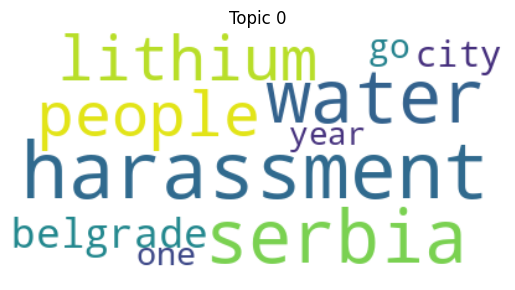

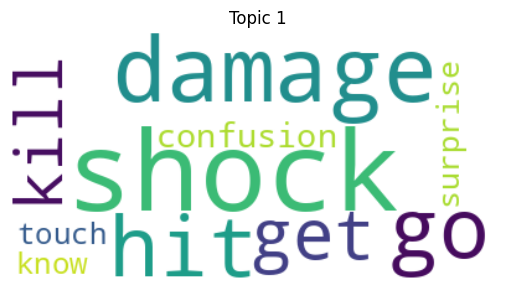

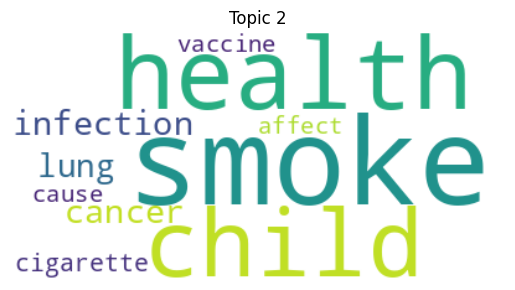

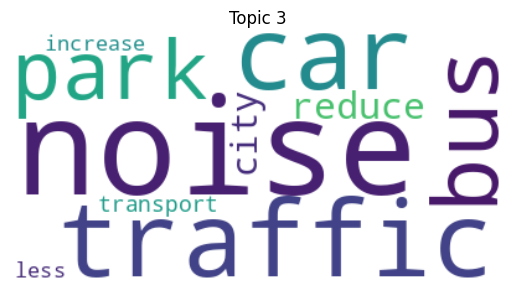

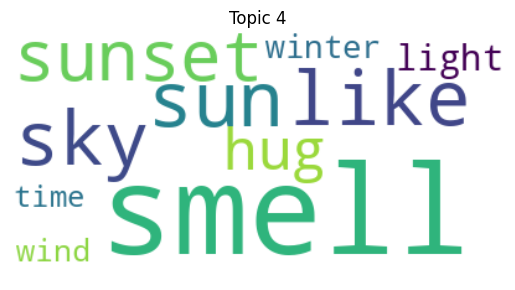

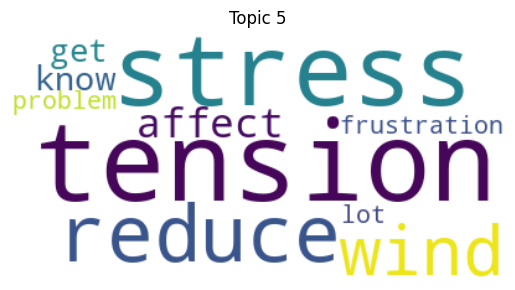

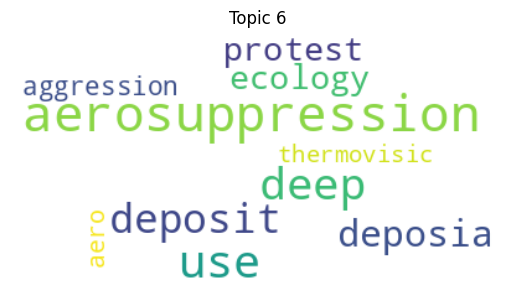

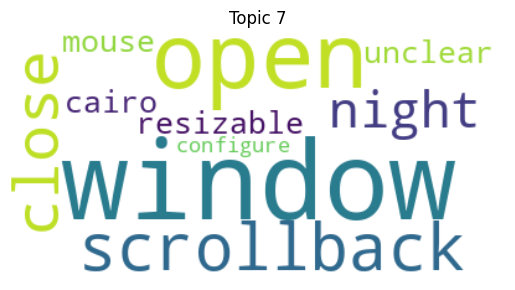

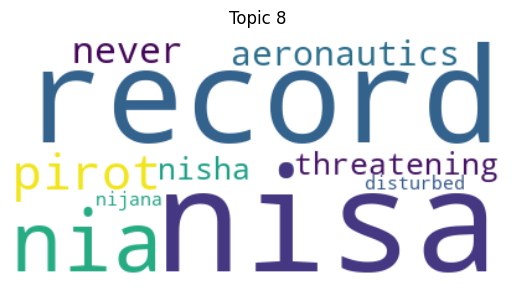

In [ ]:
for i in range(len(set(topics))-1):
    create_wordcloud(topic_model, topic=i)

In [ ]:
topics_over_time = topic_model.topics_over_time(topics_tweet_list, timestamps_clean,
                                                global_tuning=True, evolution_tuning=True, nr_bins=20)

topic_model.visualize_topics_over_time(topics_over_time)

20it [00:00, 26.93it/s]


In [ ]:
topic_model.visualize_topics()

##***Comparing RoBERTa and BERTweet***

In [ ]:
df_bl = pd.read_csv("/content/drive/MyDrive/PraksaMANU/Tweets Balkan Merged/Tweets_Balkan_sept2023_sept2025.csv")

In [ ]:
df_roberta_bl = pd.read_csv("/content/drive/MyDrive/PraksaMANU/Tweets Balkan Merged/Sentiment Analyses/Tweets_Balkan_with_RoBERTa_sentiment.csv")
df_bertweet_bl = pd.read_csv("/content/drive/MyDrive/PraksaMANU/Tweets Balkan Merged/Sentiment Analyses/Tweets_Balkan_with_BERTweet_sentiment.csv")

In [ ]:
import pandas as pd
merged_df = pd.merge(df_roberta_bl, df_bertweet_bl, on=['id', 'text_en', 'created_at'], how='inner')
merged_df

,id,text_en,created_at,RoBerta-sentiment,BERTweet-sentiment
0,NaN,Sabac is a disaster related to pollution and e...,2023-09-26 12:30:12,negative,negative
1,NaN,Climate talks are organised within the week of...,2023-09-26 08:02:09,neutral,neutral
2,NaN,It looks like it's been down a lot over the pa...,2023-09-26 00:54:26,negative,negative
3,NaN,Smells or hugs?,2023-09-25 23:16:21,neutral,neutral
4,NaN,"The question is, as long as it's not going to ...",2023-09-25 16:06:11,negative,neutral
...,...,...,...,...,...
3172,1.972279e+18,Two tanks full of oil disappeared during the n...,2025-09-28 12:37:18,negative,negative
3173,1.971981e+18,We're here to reduce this pollution of the max...,2025-09-27 16:50:07,neutral,neutral
3174,1.971962e+18,We're here to reduce this pollution from the m...,2025-09-27 15:36:10,neutral,neutral
3175,1.971270e+18,And the tax on gambling because maybe when you...,2025-09-25 17:46:38,neutral,negative


In [ ]:
# RoBerta-sentiment ≠ BERTweet-sentiment
df_diff = merged_df[merged_df["RoBerta-sentiment"] != merged_df["BERTweet-sentiment"]][[
    "id",
    "text_en",
    "created_at",
    "RoBerta-sentiment",
    "BERTweet-sentiment"
]].copy()
df_diff.reset_index(drop=True)

,id,text_en,created_at,RoBerta-sentiment,BERTweet-sentiment
0,NaN,"The question is, as long as it's not going to ...",2023-09-25 16:06:11,negative,neutral
1,NaN,The government is more concerned about Rio Tin...,2023-09-23 07:02:15,neutral,negative
2,NaN,The government is more concerned about Rio Tin...,2023-09-22 19:35:42,neutral,negative
3,NaN,The government is more concerned about Rio Tin...,2023-09-22 18:59:00,neutral,negative
4,NaN,What's all this confusion?,2023-09-22 16:09:12,negative,neutral
...,...,...,...,...,...
529,1.963337e+18,Assault of the Oceans and the World,2025-09-03 20:21:56,neutral,negative
530,1.965686e+18,The summit is one of the most clean air cities...,2025-09-10 07:57:32,neutral,negative
531,1.968392e+18,The air in Belgrade has been seized and flew —...,2025-09-17 19:09:11,neutral,negative
532,1.968260e+18,"And just advertising for gadgets, they're gree...",2025-09-17 10:25:39,neutral,negative


## ***Positive / Negative / Neutral***

In [ ]:
df_bertweet_bl = pd.read_csv("/content/drive/MyDrive/PraksaMANU/Tweets Balkan Merged/Sentiment Analyses/Tweets_Balkan_with_BERTweet_sentiment.csv")

### ***Positive***

In [ ]:
# BERTweet dataset
df_positive_bertweet = df_bertweet_bl[df_bertweet_bl['BERTweet-sentiment'] == 'positive'].copy()
positive_tweets_bertweet = df_positive_bertweet['text_en'].tolist()

In [ ]:
len(df_positive_bertweet)

173

In [ ]:
timestamps_positive_bertweet = pd.to_datetime(df_positive_bertweet['created_at']).tolist()

In [ ]:
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
from sklearn.feature_extraction.text import CountVectorizer
from umap import UMAP
from hdbscan import HDBSCAN
from bertopic.vectorizers import ClassTfidfTransformer
from nltk.corpus import stopwords

# Stopwords
english_stopwords = stopwords.words('english')
custom_stopwords = ["http", "rt", "pollution", "polluted", "air", "pollute", "breathe"]
english_stopwords.extend(custom_stopwords)

vectorizer_model = CountVectorizer(stop_words=english_stopwords)
embedding_model = SentenceTransformer("all-MiniLM-L6-v2")
umap_model = UMAP(n_components=5)
hdbscan_model = HDBSCAN(min_cluster_size=10, min_samples=6, gen_min_span_tree=True, prediction_data=True)
ctfidf_model = ClassTfidfTransformer()

topic_model_positive = BERTopic(
    hdbscan_model=hdbscan_model,
    embedding_model=embedding_model,
    nr_topics=20,
    ctfidf_model=ctfidf_model,
    vectorizer_model=vectorizer_model,
    umap_model=umap_model,
    low_memory=True,
    calculate_probabilities=True,
    verbose=True,
    n_gram_range=(1, 5)
)

topics_positive, probs_positive = topic_model_positive.fit_transform(positive_tweets_bertweet)
topic_model_positive.get_topic_info()

2026-01-11 21:11:22,736 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/6 [00:00<?, ?it/s]

2026-01-11 21:11:23,044 - BERTopic - Embedding - Completed ✓
2026-01-11 21:11:23,048 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2026-01-11 21:11:23,863 - BERTopic - Dimensionality - Completed ✓
2026-01-11 21:11:23,867 - BERTopic - Cluster - Start clustering the reduced embeddings
2026-01-11 21:11:23,887 - BERTopic - Cluster - Completed ✓
2026-01-11 21:11:23,893 - BERTopic - Representation - Extracting topics using c-TF-IDF for topic reduction.
2026-01-11 21:11:23,921 - BERTopic - Representation - Completed ✓
2026-01-11 21:11:23,924 - BERTopic - Topic reduction - Reducing number of topics
2026-01-11 21:11:23,925 - BERTopic - Topic reduction - Number of topics (20) is equal or higher than the clustered topics(5).
2026-01-11 21:11:23,926 - BERTopic - Representation - Fine-tuning topics using representation models.
2026-01-11 21:11:23,972 - BERTopic - Representation - Completed ✓


,Topic,Count,Name,Representation,Representative_Docs
0,-1,63,-1_good_surprise_great_biggest,"[good, surprise, great, biggest, reduce, power...",[Serbia is working to reduce pollution and to ...
1,0,36,0_beautiful_like_healthy_good,"[beautiful, like, healthy, good, day, nice, go...",[Every day when we wake up alive and healthy i...
2,1,32,1_belgrade_people_corruption_party,"[belgrade, people, corruption, party, traffic,...",[People's party is a safe choice for clean Bel...
3,2,13,2_quality_serbia_city_days,"[quality, serbia, city, days, breaths, annual,...",[Air quality in most Serbian cities: In one of...
4,3,29,3_reduce_state_clean_xeco,"[reduce, state, clean, xeco, thanks, applicati...",[xEco Air in full light in an article on the p...


In [ ]:
topic_model_positive.get_topic(0)

[('beautiful', np.float64(0.09474152724900442)),
 ('like', np.float64(0.0753395600859003)),
 ('healthy', np.float64(0.07418489374445268)),
 ('good', np.float64(0.06701878624215424)),
 ('day', np.float64(0.05807551120303974)),
 ('nice', np.float64(0.05807551120303974)),
 ('going', np.float64(0.04786280386648654)),
 ('smells', np.float64(0.04472894934746288)),
 ('sunset', np.float64(0.04472894934746288)),
 ('know', np.float64(0.04472894934746288))]

In [ ]:
topic_model_positive.visualize_barchart()

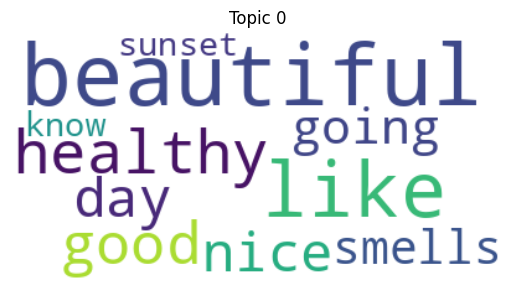

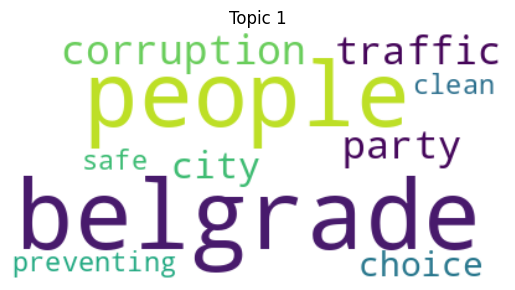

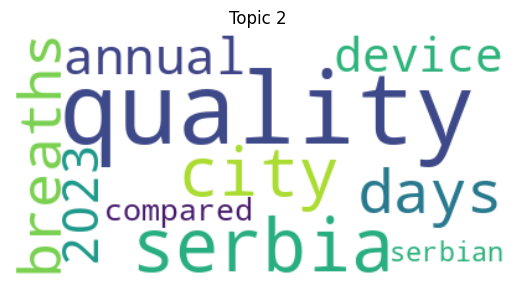

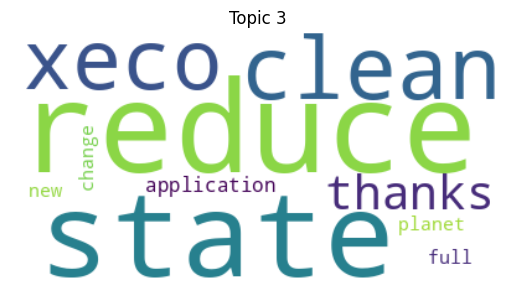

In [ ]:
for i in range(len(set(topics_positive))-1):
    create_wordcloud(topic_model_positive, topic=i)

In [ ]:
topics_over_time_positive = topic_model_positive.topics_over_time(
    positive_tweets_bertweet,
    timestamps_positive_bertweet,
    global_tuning=True,
    evolution_tuning=True,
    nr_bins=20
)
fig = topic_model_positive.visualize_topics_over_time(topics_over_time_positive)
fig.show()

19it [00:01, 15.58it/s]


In [ ]:
topic_model_positive.visualize_topics()

### ***Negative***

In [ ]:
# BERTweet dataset
df_negative_bertweet = df_bertweet_bl[df_bertweet_bl['BERTweet-sentiment'] == 'negative'].copy()
negative_tweets_bertweet = df_negative_bertweet['text_en'].tolist()

In [ ]:
len(negative_tweets_bertweet)

1710

In [ ]:
timestamps_negative_bertweet = pd.to_datetime(df_negative_bertweet['created_at']).tolist()

In [ ]:
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
from sklearn.feature_extraction.text import CountVectorizer
from umap import UMAP
from hdbscan import HDBSCAN
from bertopic.vectorizers import ClassTfidfTransformer
from nltk.corpus import stopwords

# Stopwords
english_stopwords = stopwords.words('english')
custom_stopwords = ["http", "rt", "pollution", "polluted", "air", "pollute", "breathe"]
english_stopwords.extend(custom_stopwords)

vectorizer_model = CountVectorizer(stop_words=english_stopwords)
embedding_model = SentenceTransformer("all-MiniLM-L6-v2")
umap_model = UMAP(n_components=5)
hdbscan_model = HDBSCAN(min_cluster_size=15, min_samples=6, gen_min_span_tree=True, prediction_data=True)
ctfidf_model = ClassTfidfTransformer()

topic_model_negative = BERTopic(
    hdbscan_model=hdbscan_model,
    embedding_model=embedding_model,
    nr_topics=10,
    ctfidf_model=ctfidf_model,
    vectorizer_model=vectorizer_model,
    umap_model=umap_model,
    low_memory=True,
    calculate_probabilities=True,
    verbose=True,
    n_gram_range=(1, 5)
)

topics_negative, probs_negative = topic_model_negative.fit_transform(negative_tweets_bertweet)
topic_model_negative.get_topic_info()

2026-01-23 14:42:45,886 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/54 [00:00<?, ?it/s]

2026-01-23 14:42:46,939 - BERTopic - Embedding - Completed ✓
2026-01-23 14:42:46,940 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2026-01-23 14:42:52,762 - BERTopic - Dimensionality - Completed ✓
2026-01-23 14:42:52,763 - BERTopic - Cluster - Start clustering the reduced embeddings
2026-01-23 14:42:52,895 - BERTopic - Cluster - Completed ✓
2026-01-23 14:42:52,896 - BERTopic - Representation - Extracting topics using c-TF-IDF for topic reduction.
2026-01-23 14:42:52,961 - BERTopic - Representation - Completed ✓
2026-01-23 14:42:52,962 - BERTopic - Topic reduction - Reducing number of topics
2026-01-23 14:42:52,969 - BERTopic - Representation - Fine-tuning topics using representation models.
2026-01-23 14:42:53,014 - BERTopic - Representation - Completed ✓
2026-01-23 14:42:53,015 - BERTopic - Topic reduction - Reduced number of topics from 22 to 10


,Topic,Count,Name,Representation,Representative_Docs
0,-1,812,-1_people_water_like_going,"[people, water, like, going, us, one, harassme...",[Many people are going to get better and we're...
1,0,280,0_serbia_belgrade_want_water,"[serbia, belgrade, want, water, pressure, peop...","[No bus, no 2 red, no pressure on the job, no ..."
2,1,265,1_people_water_much_environment,"[people, water, much, environment, cancer, foo...","[No, but buggers don't have them in the EU.Lif..."
3,2,129,2_harassment_city_protest_citizens,"[harassment, city, protest, citizens, last, wo...","[What kind of harassment?, How do you know the..."
4,3,72,3_damaged_wind_know_tension,"[damaged, wind, know, tension, breathing, smel...",[A large part of the problem is non-planetary ...
5,4,48,4_chinese_rio_tinto_tinta,"[chinese, rio, tinto, tinta, china, gonna, har...",[Rio Tinto brings with it the destruction of o...
6,5,39,5_lithium_dig_see_one,"[lithium, dig, see, one, problem, water, could...","[I can't see you or I can't, because I know ho..."
7,6,29,6_arrest_caught_responsible_crime,"[arrest, caught, responsible, crime, whole, th...","[It's not a trial, it's a murder. 10000-15000 ..."
8,7,21,7_confusion_much_problem_understand,"[confusion, much, problem, understand, lot, tr...",[There's confusion. I just don't know how much...
9,8,15,8_sorry_gone_empathy_esteem,"[sorry, gone, empathy, esteem, oh, misery, sel...","[I'm sorry., I'm sorry. I'm sorry. I'm sorry.,..."


In [ ]:
topic_model_negative.get_topic(0)

[('serbia', np.float64(0.11245358451257956)),
 ('belgrade', np.float64(0.05836895902864934)),
 ('want', np.float64(0.03008251450741176)),
 ('water', np.float64(0.030009364698607828)),
 ('pressure', np.float64(0.027303468445505814)),
 ('people', np.float64(0.024967838088519035)),
 ('land', np.float64(0.021317740251581955)),
 ('cities', np.float64(0.0207028110424582)),
 ('sarajevo', np.float64(0.01808917252924079)),
 ('red', np.float64(0.01798474313505969))]

In [ ]:
topic_model_negative.visualize_barchart()

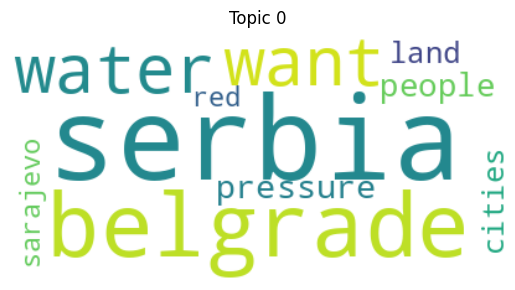

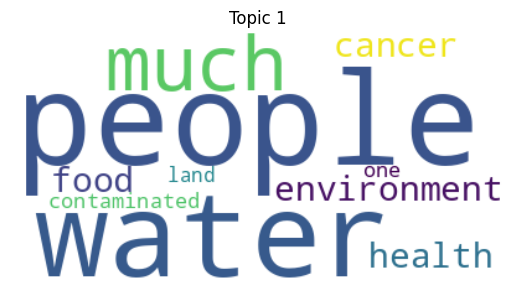

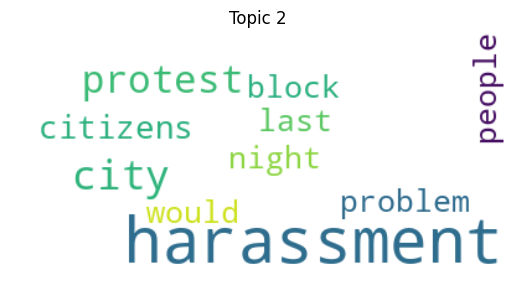

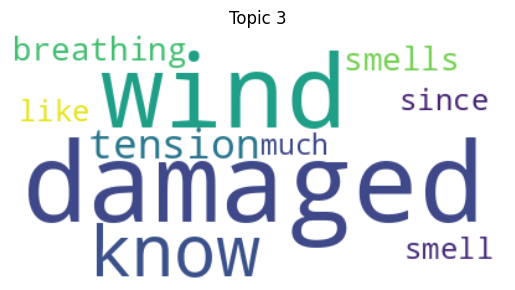

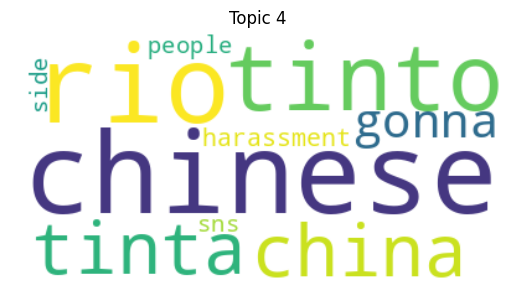

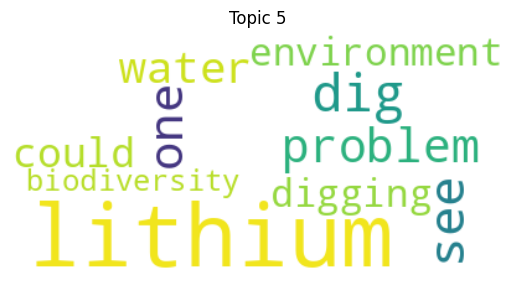

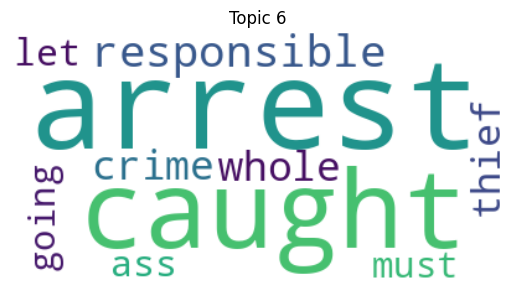

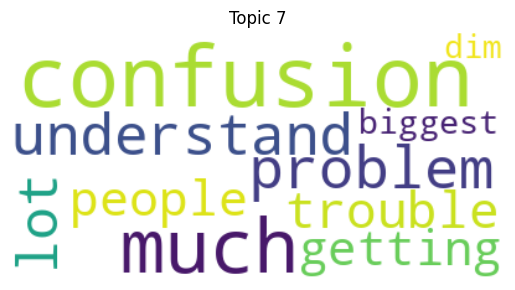

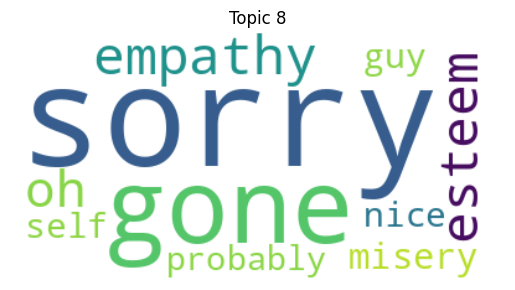

In [ ]:
for i in range(len(set(topics_negative))-1):
    create_wordcloud(topic_model_negative, topic=i)

In [ ]:
topics_over_time_negative = topic_model_negative.topics_over_time(
    negative_tweets_bertweet,
    timestamps_negative_bertweet,
    global_tuning=True,
    evolution_tuning=True,
    nr_bins=20
)
fig = topic_model_negative.visualize_topics_over_time(topics_over_time_negative)
fig.show()

20it [00:00, 58.07it/s]


In [ ]:
topic_model_negative.visualize_topics()

### ***Neutral***


In [ ]:
# BERTweet dataset
df_neutral_bertweet = df_bertweet_bl[df_bertweet_bl['BERTweet-sentiment'] == 'neutral'].copy()
neutral_tweets_bertweet = df_neutral_bertweet['text_en'].tolist()

In [ ]:
len(neutral_tweets_bertweet)

1294

In [ ]:
timestamps_neutral_bertweet = pd.to_datetime(df_neutral_bertweet['created_at']).tolist()

In [ ]:
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
from sklearn.feature_extraction.text import CountVectorizer
from umap import UMAP
from hdbscan import HDBSCAN
from bertopic.vectorizers import ClassTfidfTransformer
from nltk.corpus import stopwords

# Stopwords
english_stopwords = stopwords.words('english')
custom_stopwords = ["http", "rt", "pollution", "polluted", "air", "pollute", "breathe"]
english_stopwords.extend(custom_stopwords)

vectorizer_model = CountVectorizer(
    stop_words=english_stopwords,
    ngram_range=(1, 2)
)
embedding_model = SentenceTransformer("all-MiniLM-L6-v2")
umap_model = UMAP(
    n_neighbors=10,
    n_components=5,
    min_dist=0.0,
    metric="cosine"
)
hdbscan_model = HDBSCAN(
    min_cluster_size=25,
    min_samples=5,
    metric='euclidean',
    prediction_data=True
)
ctfidf_model = ClassTfidfTransformer()

topic_model_neutral = BERTopic(
    hdbscan_model=hdbscan_model,
    embedding_model=embedding_model,
    nr_topics=10,
    ctfidf_model=ctfidf_model,
    vectorizer_model=vectorizer_model,
    umap_model=umap_model,
    low_memory=True,
    calculate_probabilities=True,
    verbose=True,
    n_gram_range=(1, 5)
)

topics_neutral, probs_neutral = topic_model_neutral.fit_transform(neutral_tweets_bertweet)
topic_model_neutral.get_topic_info()

2026-01-23 14:47:18,347 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/41 [00:00<?, ?it/s]

2026-01-23 14:47:19,236 - BERTopic - Embedding - Completed ✓
2026-01-23 14:47:19,237 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2026-01-23 14:47:23,682 - BERTopic - Dimensionality - Completed ✓
2026-01-23 14:47:23,683 - BERTopic - Cluster - Start clustering the reduced embeddings
2026-01-23 14:47:23,766 - BERTopic - Cluster - Completed ✓
2026-01-23 14:47:23,766 - BERTopic - Representation - Extracting topics using c-TF-IDF for topic reduction.
2026-01-23 14:47:23,849 - BERTopic - Representation - Completed ✓
2026-01-23 14:47:23,850 - BERTopic - Topic reduction - Reducing number of topics
2026-01-23 14:47:23,856 - BERTopic - Representation - Fine-tuning topics using representation models.
2026-01-23 14:47:23,939 - BERTopic - Representation - Completed ✓
2026-01-23 14:47:23,941 - BERTopic - Topic reduction - Reduced number of topics from 13 to 10


,Topic,Count,Name,Representation,Representative_Docs
0,-1,322,-1_rio_harassment_environment_tinto,"[rio, harassment, environment, tinto, rio tint...","[When you're done with the operation, are you ..."
1,0,531,0_serbia_belgrade_reduce_city,"[serbia, belgrade, reduce, city, water, traffi...","[How can we reduce air pollution on our own?, ..."
2,1,103,1_hit_damaged_shock_breathing,"[hit, damaged, shock, breathing, like, fog, to...",[Almost in total darkness and confusion hugely...
3,2,98,2_like_going_confusion_getting,"[like, going, confusion, getting, one, dragon,...",[We would have found that the place where the ...
4,3,69,3_agency_agency agency_sarajevo_zenanica,"[agency, agency agency, sarajevo, zenanica, ze...",[#use #aerosuppression #deposit #deep #ecology...
5,4,44,4_lithium_would_rio_make lithium,"[lithium, would, rio, make lithium, workers af...","[We have Lithium! We earn workers from Africa,..."
6,5,42,5_light_way_way way_away,"[light, way, way way, away, length, moon, take...",[GREEN ALARM IN BANNALUCY AWAY AWAY AWAY TO TH...
7,6,30,6_90_infection_infected_vaccinated,"[90, infection, infected, vaccinated, cold, ge...",[And when I read the various data that 75-90% ...
8,7,29,7_winter_ice_go_live,"[winter, ice, go, live, going, life, terrace, ...","[The question was not trivial, of course, that..."
9,8,26,8_much_gold_money_city,"[much, gold, money, city, sns, billion, 50, fa...",[If we remember the promises when Zidjin Bor a...


In [ ]:
topic_model_neutral.get_topic(0)

[('serbia', np.float64(0.022716519138929966)),
 ('belgrade', np.float64(0.015857533899043392)),
 ('reduce', np.float64(0.0130127813512995)),
 ('city', np.float64(0.012839517826692142)),
 ('water', np.float64(0.01163135518841477)),
 ('traffic', np.float64(0.010111123322165088)),
 ('quality', np.float64(0.009810282358416966)),
 ('one', np.float64(0.008326323588566597)),
 ('cities', np.float64(0.008170253003939096)),
 ('people', np.float64(0.008057732505064448))]

In [ ]:
topic_model_neutral.visualize_barchart()

In [ ]:
topics_over_time_neutral = topic_model_neutral.topics_over_time(
    neutral_tweets_bertweet,
    timestamps_neutral_bertweet,
    global_tuning=True,
    evolution_tuning=True,
    nr_bins=20
)
fig = topic_model_neutral.visualize_topics_over_time(topics_over_time_neutral)
fig.show()

20it [00:00, 27.00it/s]


In [ ]:
topic_model_neutral.visualize_topics()

## ***Year analysis***

In [ ]:
df_sentiment_bl = pd.read_csv("/content/drive/MyDrive/PraksaMANU/Tweets Balkan Merged/Sentiment Analyses/Tweets_Balkan_with_BERTweet_sentiment.csv")

In [ ]:
df_sentiment_bl["created_at"] = pd.to_datetime(
    df_sentiment_bl["created_at"], errors="coerce"
)

In [ ]:
df_sentiment_bl["week"] = df_sentiment_bl["created_at"].dt.isocalendar().week

In [ ]:
def get_season(date):
    if pd.isna(date):
        return None
    if pd.Timestamp("2023-10-01") <= date < pd.Timestamp("2024-10-01"):
        return "2023/2024"
    elif pd.Timestamp("2024-10-01") <= date < pd.Timestamp("2025-10-01"):
        return "2024/2025"
    else:
        return None

df_sentiment_bl["season"] = df_sentiment_bl["created_at"].apply(get_season)

In [ ]:
df_sentiment_bl = df_sentiment_bl.dropna(subset=["season"])

# weekly counts po sezona и sentiment
df_season_weekly = (
    df_sentiment_bl
    .groupby(["season", "week", "BERTweet-sentiment"])
    .size()
    .reset_index(name="tweet_count")
)

In [ ]:
df_seasonal_pivot = (
    df_season_weekly
    .pivot_table(
        index=["season", "week"],
        columns="BERTweet-sentiment",
        values="tweet_count",
        fill_value=0
    )
    .reset_index()
)

df_seasonal_pivot.head()

BERTweet-sentiment,season,week,negative,neutral,positive
0,2023/2024,1,21.0,23.0,3.0
1,2023/2024,2,14.0,10.0,1.0
2,2023/2024,3,27.0,17.0,3.0
3,2023/2024,4,25.0,19.0,2.0
4,2023/2024,5,43.0,37.0,5.0


## ***Kruskal–Wallis - Negative sentiment over the years***

In [ ]:
from scipy.stats import kruskal

neg_2324 = df_seasonal_pivot[
    df_seasonal_pivot["season"] == "2023/2024"
]["negative"]

neg_2425 = df_seasonal_pivot[
    df_seasonal_pivot["season"] == "2024/2025"
]["negative"]

In [ ]:
stat, p = kruskal(neg_2324, neg_2425)

print(f"Statistic = {stat:.3f}")
print(f"p-value = {p:.4f}")

if p < 0.05:
    print("Statistically significant difference in NEGATIVE tweets between seasons.")
else:
    print("No statistically significant difference in NEGATIVE tweets between seasons.")

Statistic = 14.621
p-value = 0.0001
Statistically significant difference in NEGATIVE tweets between seasons.


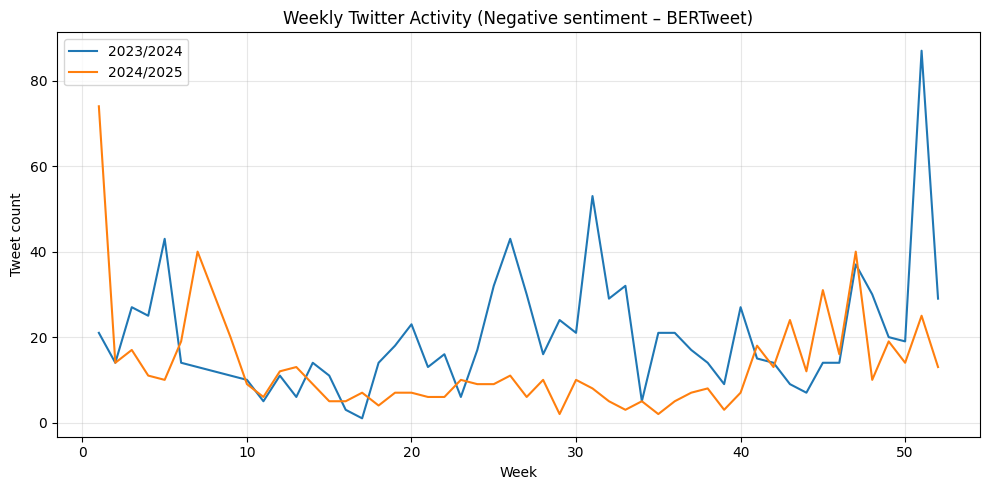

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))

df_2324 = df_seasonal_pivot[df_seasonal_pivot["season"] == "2023/2024"]
df_2425 = df_seasonal_pivot[df_seasonal_pivot["season"] == "2024/2025"]

plt.plot(df_2324["week"], df_2324["negative"], label="2023/2024")
plt.plot(df_2425["week"], df_2425["negative"], label="2024/2025")

plt.title("Weekly Twitter Activity (Negative sentiment – BERTweet)")
plt.xlabel("Week")
plt.ylabel("Tweet count")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


## ***Kruskal–Wallis - Positive sentiment over the years***

In [ ]:
from scipy.stats import kruskal

neg_2324 = df_seasonal_pivot[
    df_seasonal_pivot["season"] == "2023/2024"
]["positive"]

neg_2425 = df_seasonal_pivot[
    df_seasonal_pivot["season"] == "2024/2025"
]["positive"]

In [ ]:
stat, p = kruskal(neg_2324, neg_2425)

print(f"Statistic = {stat:.3f}")
print(f"p-value = {p:.4f}")

if p < 0.05:
    print("Statistically significant difference in POSITIVE tweets between seasons.")
else:
    print("No statistically significant difference in POSITIVE tweets between seasons.")

Statistic = 6.760
p-value = 0.0093
Statistically significant difference in POSITIVE tweets between seasons.


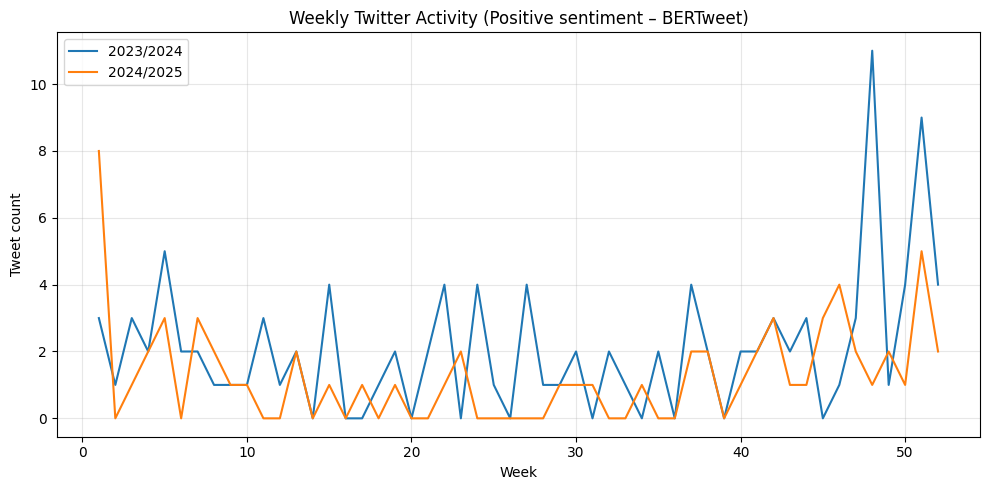

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))

df_2324 = df_seasonal_pivot[df_seasonal_pivot["season"] == "2023/2024"]
df_2425 = df_seasonal_pivot[df_seasonal_pivot["season"] == "2024/2025"]

plt.plot(df_2324["week"], df_2324["positive"], label="2023/2024")
plt.plot(df_2425["week"], df_2425["positive"], label="2024/2025")

plt.title("Weekly Twitter Activity (Positive sentiment – BERTweet)")
plt.xlabel("Week")
plt.ylabel("Tweet count")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

## ***Kruskal–Wallis - Neutral sentiment over the years***

In [ ]:
from scipy.stats import kruskal

neg_2324 = df_seasonal_pivot[
    df_seasonal_pivot["season"] == "2023/2024"
]["neutral"]

neg_2425 = df_seasonal_pivot[
    df_seasonal_pivot["season"] == "2024/2025"
]["neutral"]

In [ ]:
stat, p = kruskal(neg_2324, neg_2425)

print(f"Statistic = {stat:.3f}")
print(f"p-value = {p:.4f}")

if p < 0.05:
    print("Statistically significant difference in NEUTRAL tweets between seasons.")
else:
    print("No statistically significant difference in NEUTRAL tweets between seasons.")

Statistic = 15.780
p-value = 0.0001
Statistically significant difference in NEUTRAL tweets between seasons.


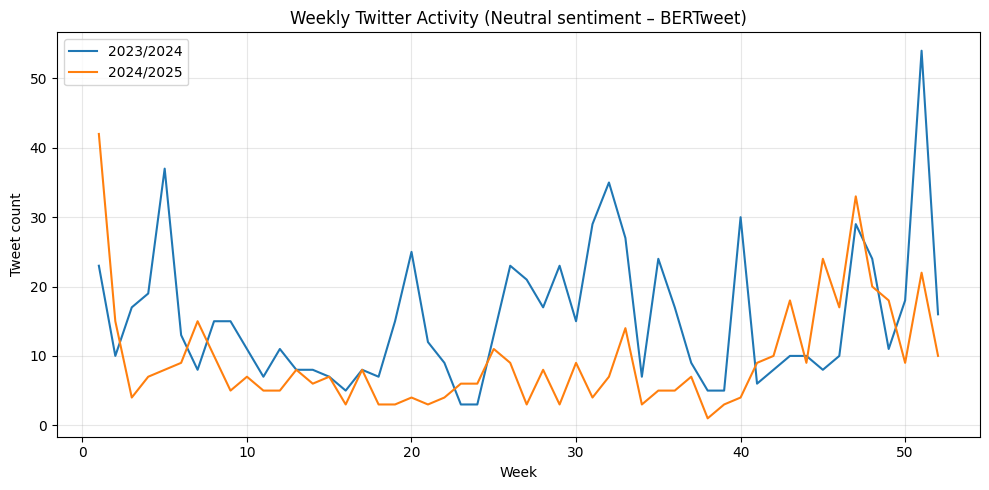

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))

df_2324 = df_seasonal_pivot[df_seasonal_pivot["season"] == "2023/2024"]
df_2425 = df_seasonal_pivot[df_seasonal_pivot["season"] == "2024/2025"]

plt.plot(df_2324["week"], df_2324["neutral"], label="2023/2024")
plt.plot(df_2425["week"], df_2425["neutral"], label="2024/2025")

plt.title("Weekly Twitter Activity (Neutral sentiment – BERTweet)")
plt.xlabel("Week")
plt.ylabel("Tweet count")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

##***Topics for 2023/24 and 2024/25***

In [ ]:
# stopwords i vectorizer(gi pretvora tvitovite vo bag-of-words matrica)
english_stopwords = stopwords.words('english')
custom_stopwords = ["http", "rt", "pollution", "polluted", "air", "pollute", "breathe"]
english_stopwords.extend(custom_stopwords)

vectorizer_model = CountVectorizer(stop_words=english_stopwords)

vectorized_data = vectorizer_model.fit_transform(lemmatized_tweet_list)
text_without_stopwords = vectorizer_model.inverse_transform(vectorized_data)

topics_tweet_list = [" ".join(words) for words in text_without_stopwords]

In [ ]:
df_topics = pd.DataFrame({
    "text": topics_tweet_list,
    "created_at": timestamps_clean
})

df_topics["created_at"] = pd.to_datetime(df_topics["created_at"], errors="coerce")

In [ ]:
def get_season(date):
    if pd.isna(date):
        return None
    if date >= pd.Timestamp("2023-10-01") and date < pd.Timestamp("2024-10-01"):
        return "2023/2024"
    elif date >= pd.Timestamp("2024-10-01") and date < pd.Timestamp("2025-10-01"):
        return "2024/2025"
    else:
        return None

df_topics["season"] = df_topics["created_at"].apply(get_season)

***2023/24***

In [ ]:
df_topics_2324 = df_topics[df_topics["season"] == "2023/2024"].reset_index(drop=True)
tweets_2324 = df_topics_2324["text"].astype(str).tolist()
print("Tweets for 2023/24:", len(tweets_2324))

Tweets for 2023/24: 1944


In [ ]:
embedding_model = SentenceTransformer("all-MiniLM-L6-v2")

topic_model_2324 = BERTopic(
    embedding_model=embedding_model,
    language="multilingual",
    min_topic_size=20,
    nr_topics=10,
    calculate_probabilities=True,
    verbose=True
)

In [ ]:
topics_2324, probs_2324 = topic_model_2324.fit_transform(tweets_2324)

2026-01-17 15:29:11,643 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/61 [00:00<?, ?it/s]

2026-01-17 15:29:12,753 - BERTopic - Embedding - Completed ✓
2026-01-17 15:29:12,754 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2026-01-17 15:29:22,907 - BERTopic - Dimensionality - Completed ✓
2026-01-17 15:29:22,908 - BERTopic - Cluster - Start clustering the reduced embeddings
2026-01-17 15:29:23,069 - BERTopic - Cluster - Completed ✓
2026-01-17 15:29:23,070 - BERTopic - Representation - Extracting topics using c-TF-IDF for topic reduction.
2026-01-17 15:29:23,110 - BERTopic - Representation - Completed ✓
2026-01-17 15:29:23,111 - BERTopic - Topic reduction - Reducing number of topics
2026-01-17 15:29:23,118 - BERTopic - Representation - Fine-tuning topics using representation models.
2026-01-17 15:29:23,150 - BERTopic - Representation - Completed ✓
2026-01-17 15:29:23,151 - BERTopic - Topic reduction - Reduced number of topics from 19 to 10


In [ ]:
topic_model_2324.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,877,-1_people_get_serbia_go,"[people, get, serbia, go, year, know, one, red...",[people thing reason destruction number want n...
1,0,279,0_serbia_belgrade_city_people,"[serbia, belgrade, city, people, eu, world, sa...",[serbia belgrade world city affected among nee...
2,1,201,1_water_use_ecology_deep,"[water, use, ecology, deep, climate, aerosuppr...",[ecology aerosuppression protest deposit video...
3,2,185,2_harassment_city_people_problem,"[harassment, city, people, problem, money, go,...",[change problem stop harassment city authority...
4,3,143,3_damage_hit_go_get,"[damage, hit, go, get, think, touch, gonna, up...","[yesterday today damage, hit really damage sho..."
5,4,113,4_lithium_electricity_coal_dig,"[lithium, electricity, coal, dig, use, battery...",[relate lithium serbia avoid rio cheap see say...
6,5,52,5_vaccine_infection_health_vaccinate,"[vaccine, infection, health, vaccinate, virus,...",[like read data seem infected various 90 vec v...
7,6,36,6_noise_city_reduce_traffic,"[noise, city, reduce, traffic, park, center, l...",[long problem organize transport would reduce ...
8,7,35,7_rio_tinto_tinta_job,"[rio, tinto, tinta, job, dig, pressure, water,...",[serbia rio bus stop water want land job dig p...
9,8,23,8_smell_gas_eruption_burn,"[smell, gas, eruption, burn, taste, km, come, ...","[smell tonight leon, smell problem burn whethe..."


In [ ]:
df_topics_2324['topic'] = topics_2324

df_topics_2324['date'] = df_topics_2324['created_at'].dt.date
tweets_per_topic_day = df_topics_2324.groupby(['date', 'topic']).size().reset_index(name='tweet_count')

In [ ]:
import plotly.express as px

fig = px.line(tweets_per_topic_day, x='date', y='tweet_count', color='topic',
              title='Frequency of Tweets per Topic Over Time (2023/24)',
              labels={'date': 'Date', 'tweet_count': 'Number of Tweets', 'topic': 'Topic'},
              markers=True)

fig.update_layout(xaxis_title='Date',
                  yaxis_title='Number of Tweets',
                  xaxis=dict(tickangle=-45),
                  template='plotly_white')

fig.show()

In [ ]:
fig = px.line(tweets_per_topic_day, x='date', y='tweet_count', facet_col='topic',
              facet_col_wrap=2,
              title='Tweet Frequency per Topic Over Time (Faceted)',
              labels={'date': 'Date', 'tweet_count': 'Number of Tweets', 'topic': 'Topic'},
              markers=True)

fig.update_layout(template='plotly_white')
fig.show()


***2024/25***

In [ ]:
df_topics_2425 = df_topics[df_topics["season"] == "2024/2025"].reset_index(drop=True)
tweets_2425 = df_topics_2425["text"].astype(str).tolist()
print("Tweets for 2024/25:", len(tweets_2425))

Tweets for 2024/25: 1197


In [ ]:
embedding_model = SentenceTransformer("all-MiniLM-L6-v2")

topic_model_2425 = BERTopic(
    embedding_model=embedding_model,
    language="multilingual",
    min_topic_size=30,
    nr_topics=20,
    calculate_probabilities=True,
    verbose=True
)

In [ ]:
topics_2425, probs_2425 = topic_model_2425.fit_transform(tweets_2425)

2026-01-17 15:33:35,461 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/38 [00:00<?, ?it/s]

2026-01-17 15:33:36,418 - BERTopic - Embedding - Completed ✓
2026-01-17 15:33:36,419 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2026-01-17 15:33:43,958 - BERTopic - Dimensionality - Completed ✓
2026-01-17 15:33:43,959 - BERTopic - Cluster - Start clustering the reduced embeddings
2026-01-17 15:33:44,101 - BERTopic - Cluster - Completed ✓
2026-01-17 15:33:44,105 - BERTopic - Representation - Extracting topics using c-TF-IDF for topic reduction.
2026-01-17 15:33:44,154 - BERTopic - Representation - Completed ✓
2026-01-17 15:33:44,156 - BERTopic - Topic reduction - Reducing number of topics
2026-01-17 15:33:44,156 - BERTopic - Topic reduction - Number of topics (20) is equal or higher than the clustered topics(4).
2026-01-17 15:33:44,160 - BERTopic - Representation - Fine-tuning topics using representation models.
2026-01-17 15:33:44,220 - BERTopic - Representation - Completed ✓


In [ ]:
topic_model_2425.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,637,-1_go_get_people_year,"[go, get, people, year, like, shock, damage, t...",[like smell measure impact one well year earth...
1,0,425,0_serbia_water_belgrade_year,"[serbia, water, belgrade, year, city, people, ...",[serbia like lot harassment see city last year...
2,1,74,1_harassment_people_medium_problem,"[harassment, people, medium, problem, tell, we...","[harassment get rosulence, harassment start ok..."
3,2,61,2_get_kid_go_little,"[get, kid, go, little, good, right, like, look...",[like go part reduce believe right tension lea...


In [ ]:
df_topics_2425['topic'] = topics_2425

df_topics_2425['date'] = df_topics_2425['created_at'].dt.date
tweets_per_topic_day = df_topics_2425.groupby(['date', 'topic']).size().reset_index(name='tweet_count')

In [ ]:
import plotly.express as px

fig = px.line(tweets_per_topic_day, x='date', y='tweet_count', color='topic',
              title='Frequency of Tweets per Topic Over Time (2024/25)',
              labels={'date': 'Date', 'tweet_count': 'Number of Tweets', 'topic': 'Topic'},
              markers=True)

fig.update_layout(xaxis_title='Date',
                  yaxis_title='Number of Tweets',
                  xaxis=dict(tickangle=-45),
                  template='plotly_white')

fig.show()

In [ ]:
fig = px.line(tweets_per_topic_day, x='date', y='tweet_count', facet_col='topic',
              facet_col_wrap=2,
              title='Tweet Frequency per Topic Over Time (Faceted)',
              labels={'date': 'Date', 'tweet_count': 'Number of Tweets', 'topic': 'Topic'},
              markers=True)

fig.update_layout(template='plotly_white')
fig.show()

##***Heating vs Non-heating seasons***

In [ ]:
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from umap import UMAP
from hdbscan import HDBSCAN
import pandas as pd

# Embedding и Vectorizer
embedding_model = SentenceTransformer("all-mpnet-base-v2")
vectorizer_model = TfidfVectorizer(
    stop_words=["don", "the", "in","it", "to", "of", "so", "and", "you", "we", "his", "on", "is", "us", "re", "not", "from", "that", "this", "with"],
    ngram_range=(1,2)
)

In [ ]:
# Heating / Non-heating
def season_label(date):
    month = date.month
    if month in [11, 12, 1, 2]:
        return "Heating"
    else:
        return "Non-heating"

df_topics_bl["created_at"] = pd.to_datetime(
    df_air_pollution_bl.loc[df_topics_bl.index, "created_at"], errors="coerce"
)
df_topics_bl = df_topics_bl.dropna(subset=["created_at"])
df_topics_bl["season"] = df_topics_bl["created_at"].apply(season_label)

dfs = {
    "Heating": df_topics_bl[df_topics_bl["season"] == "Heating"]["text_en"].tolist(),
    "Non-heating": df_topics_bl[df_topics_bl["season"] == "Non-heating"]["text_en"].tolist()
}

In [ ]:
# BERTopic with UMAP and HDBSCAN
topic_results = {}

for season, texts in dfs.items():
    if len(texts) < 50:
        print(f"Skipping {season} (too few tweets)")
        continue

    # UMAP and HDBSCAN
    umap_model = UMAP(n_neighbors=15, n_components=5, metric='cosine', random_state=42)
    hdbscan_model = HDBSCAN(min_cluster_size=15, metric='euclidean', cluster_selection_method='eom')

    topic_model = BERTopic(
        embedding_model=embedding_model,
        vectorizer_model=vectorizer_model,
        umap_model=umap_model,
        hdbscan_model=hdbscan_model,
        calculate_probabilities=False,
        verbose=False
    )

    topics, _ = topic_model.fit_transform(texts)
    topic_results[season] = topic_model

In [ ]:
def topic_summary(topic_model, top_n=7):
    summary = []
    for topic in topic_model.get_topics():
        if topic == -1:
            continue
        words = [w for w, _ in topic_model.get_topic(topic)[:top_n]]
        summary.append({
            "Topic": topic,
            "Top words": ", ".join(words)
        })
    return pd.DataFrame(summary)

In [ ]:
for season, model in topic_results.items():
    print(f"\033[1m\n{season} Season Topics\033[0m")
    display(topic_summary(model))


Heating Season Topics


,Topic,Top words
0,0,"pollution, air pollution, air, quality, have, ..."
1,1,"serbia, air, pollution, air pollution, belgrad..."
2,2,"serbia, zenanica, zenanica zenanica, belgrade,..."
3,3,"damaged, tension, air, air damaged, damaged ai..."
4,4,"confusion, much confusion, much, there, they, ..."
5,5,"harassment, kind harassment, local authorities..."
6,6,"he gone, gone, going, gone he, sunset, out, river"
7,7,"they, infected, vaccine, sneezing, 90 infected..."
8,8,"agency agency, agency, sarajevo, air sarajevo,..."



Non-heating Season Topics


,Topic,Top words
0,0,"serbia, belgrade, air, water, most serbia, pol..."
1,1,"air pollution, air, pollution, infection, when..."
2,2,"car, traffic, city, vehicles, less, pollution,..."
3,3,"harassment, he, harassment or, are, doesn have..."
4,4,"just just, just, sorry, shock, jump, gonna hap..."
5,5,"lithium, lithium has, experiences, there, lith..."
6,6,"protest, arrest, responsible, he, opposition, ..."
7,7,"dig, digging, mines, rio, lithium, special, will"
8,8,"fire, fires, village, koznica fires, are groun..."
9,9,"microplastics, plastics, scientists, plastic, ..."


In [1]:
from IPython.display import display
import ipywidgets as widgets